## IMPORT LIBRARIES

In [1]:
import os
import pandas as pd
import numpy as np
import pickle
from scipy import stats
import tensorflow as tf
import seaborn as sns
from pylab import rcParams
from keras.models import Model, load_model
from keras.layers import Input, Dense
from keras.callbacks import ModelCheckpoint, TensorBoard
from keras import regularizers
import lightgbm as lgb
from scipy.misc import derivative
from bayes_opt import BayesianOptimization
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

import seaborn as sns
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import matplotlib
import plotly.graph_objs as go
from sklearn.model_selection import train_test_split

import graphviz
from  sklearn.model_selection  import train_test_split
from  sklearn.tree             import DecisionTreeClassifier
from  sklearn.neural_network   import MLPClassifier
from  sklearn.metrics          import accuracy_score
from  sklearn                  import tree
from  sklearn.metrics          import confusion_matrix

from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report
from sklearn import metrics
from sklearn.metrics import log_loss
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import MinMaxScaler

%matplotlib inline

KeyboardInterrupt: 

## KDD 99 DATASETS

In [2]:
corrected = "./corrected"
kddcup_data_corrected = "./kddcup.data.corrected"

kddcup_data_10_percent_corrected = "./kddcup.data_10_percent_corrected"
kddcup_testdata = "./kddcup.testdata.unlabeled"

correspondence = "./training_attack_types.txt"
header_files = "./headers"

In [3]:
dct = dict()
with open(correspondence, "r") as f:
    for line in f:
        line = line.split()
        if line != []:
            dct[line[0]] = line[1][:-1]
dct["normal"] = "normal"

In [4]:
header = ['duration', 'protocol_type', 'service', 'flag', 'src_bytes', 'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot', 'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell', 'su_attempted', 'num_root', 'num_file_creations', 'num_shells', 'num_access_files', 'num_outbound_cmds', 'is_host_login', 'is_guest_login', 'count', 'srv_count', 'serror_rate', 'srv_serror_rate', 'rerror_rate', 'srv_rerror_rate', 'same_srv_rate', 'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count', 'dst_host_srv_count', 'dst_host_same_srv_rate', 'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate', 'dst_host_srv_diff_host_rate', 'dst_host_serror_rate', 'dst_host_srv_serror_rate', 'dst_host_rerror_rate', 'dst_host_srv_rerror_rate', 'classes']

## IMPORT TRAINING DATASET

In [5]:
df = pd.read_csv(kddcup_data_corrected, header=None)
df.columns = header
df.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,classes
0,0,tcp,http,SF,215,45076,0,0,0,0,...,0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,normal.
1,0,tcp,http,SF,162,4528,0,0,0,0,...,1,1.0,0.0,1.00,0.0,0.0,0.0,0.0,0.0,normal.
2,0,tcp,http,SF,236,1228,0,0,0,0,...,2,1.0,0.0,0.50,0.0,0.0,0.0,0.0,0.0,normal.
3,0,tcp,http,SF,233,2032,0,0,0,0,...,3,1.0,0.0,0.33,0.0,0.0,0.0,0.0,0.0,normal.
4,0,tcp,http,SF,239,486,0,0,0,0,...,4,1.0,0.0,0.25,0.0,0.0,0.0,0.0,0.0,normal.


In [6]:
df_initial = pd.read_csv(kddcup_data_corrected, header=None)
df_initial.columns = header
df_initial.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,classes
0,0,tcp,http,SF,215,45076,0,0,0,0,...,0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,normal.
1,0,tcp,http,SF,162,4528,0,0,0,0,...,1,1.0,0.0,1.00,0.0,0.0,0.0,0.0,0.0,normal.
2,0,tcp,http,SF,236,1228,0,0,0,0,...,2,1.0,0.0,0.50,0.0,0.0,0.0,0.0,0.0,normal.
3,0,tcp,http,SF,233,2032,0,0,0,0,...,3,1.0,0.0,0.33,0.0,0.0,0.0,0.0,0.0,normal.
4,0,tcp,http,SF,239,486,0,0,0,0,...,4,1.0,0.0,0.25,0.0,0.0,0.0,0.0,0.0,normal.


In [8]:
df_initial.shape

(4898431, 42)

In [9]:
df_initial.isna().sum() #CHECK NaN COLUMNS

duration                       0
protocol_type                  0
service                        0
flag                           0
src_bytes                      0
dst_bytes                      0
land                           0
wrong_fragment                 0
urgent                         0
hot                            0
num_failed_logins              0
logged_in                      0
num_compromised                0
root_shell                     0
su_attempted                   0
num_root                       0
num_file_creations             0
num_shells                     0
num_access_files               0
num_outbound_cmds              0
is_host_login                  0
is_guest_login                 0
count                          0
srv_count                      0
serror_rate                    0
srv_serror_rate                0
rerror_rate                    0
srv_rerror_rate                0
same_srv_rate                  0
diff_srv_rate                  0
srv_diff_h

In [11]:
df_initial.classes.value_counts()

smurf.              2807886
neptune.            1072017
normal.              972781
satan.                15892
ipsweep.              12481
portsweep.            10413
nmap.                  2316
back.                  2203
warezclient.           1020
teardrop.               979
pod.                    264
guess_passwd.            53
buffer_overflow.         30
land.                    21
warezmaster.             20
imap.                    12
rootkit.                 10
loadmodule.               9
ftp_write.                8
multihop.                 7
phf.                      4
perl.                     3
spy.                      2
Name: classes, dtype: int64

In [12]:
df_initial.describe()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
count,4.898431e+06,4.898431e+06,4.898431e+06,4.898431e+06,4.898431e+06,4.898431e+06,4.898431e+06,4.898431e+06,4.898431e+06,4.898431e+06,...,4.898431e+06,4.898431e+06,4.898431e+06,4.898431e+06,4.898431e+06,4.898431e+06,4.898431e+06,4.898431e+06,4.898431e+06,4.898431e+06
mean,4.834243e+01,1.834621e+03,1.093623e+03,5.716116e-06,6.487792e-04,7.961733e-06,1.243766e-02,3.205108e-05,1.435290e-01,8.088304e-03,...,2.329811e+02,1.892142e+02,7.537132e-01,3.071111e-02,6.050520e-01,6.464107e-03,1.780911e-01,1.778859e-01,5.792780e-02,5.765941e-02
std,7.233298e+02,9.414311e+05,6.450123e+05,2.390833e-03,4.285434e-02,7.215084e-03,4.689782e-01,7.299408e-03,3.506116e-01,3.856481e+00,...,6.402094e+01,1.059128e+02,4.111860e-01,1.085432e-01,4.809877e-01,4.125978e-02,3.818382e-01,3.821774e-01,2.309428e-01,2.309777e-01
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,0.000000e+00,4.500000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,2.550000e+02,4.900000e+01,4.100000e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,0.000000e+00,5.200000e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,2.550000e+02,2.550000e+02,1.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,0.000000e+00,1.032000e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,2.550000e+02,2.550000e+02,1.000000e+00,4.000000e-02,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
max,5.832900e+04,1.379964e+09,1.309937e+09,1.000000e+00,3.000000e+00,1.400000e+01,7.700000e+01,5.000000e+00,1.000000e+00,7.479000e+03,...,2.550000e+02,2.550000e+02,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


In [13]:
df_initial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898431 entries, 0 to 4898430
Data columns (total 42 columns):
duration                       int64
protocol_type                  object
service                        object
flag                           object
src_bytes                      int64
dst_bytes                      int64
land                           int64
wrong_fragment                 int64
urgent                         int64
hot                            int64
num_failed_logins              int64
logged_in                      int64
num_compromised                int64
root_shell                     int64
su_attempted                   int64
num_root                       int64
num_file_creations             int64
num_shells                     int64
num_access_files               int64
num_outbound_cmds              int64
is_host_login                  int64
is_guest_login                 int64
count                          int64
srv_count                      in

## IMPORT TEST DATASET

In [7]:
test_data = pd.read_csv(kddcup_testdata, header=None)
test_data.columns = header[:-1]

In [15]:
test_data_initial = test_data

In [16]:
test_data_initial.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
0,0,udp,private,SF,105,146,0,0,0,0,...,1,1,1.0,0.00,1.00,0.0,0.0,0.0,0.0,0.0
1,0,udp,private,SF,105,146,0,0,0,0,...,255,254,1.0,0.01,0.00,0.0,0.0,0.0,0.0,0.0
2,0,udp,private,SF,105,146,0,0,0,0,...,255,254,1.0,0.01,0.00,0.0,0.0,0.0,0.0,0.0
3,0,udp,private,SF,105,146,0,0,0,0,...,255,254,1.0,0.01,0.00,0.0,0.0,0.0,0.0,0.0
4,0,udp,private,SF,105,146,0,0,0,0,...,255,254,1.0,0.01,0.01,0.0,0.0,0.0,0.0,0.0


In [17]:
test_data_initial.shape

(2984154, 41)

In [18]:
test_data.describe()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
count,2.984154e+06,2.984154e+06,2.984154e+06,2.984154e+06,2.984154e+06,2.984154e+06,2.984154e+06,2.984154e+06,2.984154e+06,2.984154e+06,...,2.984154e+06,2.984154e+06,2.984154e+06,2.984154e+06,2.984154e+06,2.984154e+06,2.984154e+06,2.984154e+06,2.984154e+06,2.984154e+06
mean,3.720818e+00,7.688802e+02,7.308897e+02,3.015930e-06,4.771872e-04,1.373924e-05,5.270170e-03,2.597051e-04,1.470725e-01,4.903567e-03,...,2.355073e+02,1.991410e+02,7.902420e-01,2.417571e-02,5.676274e-01,4.283301e-03,6.000331e-02,5.988593e-02,1.456255e-01,1.459071e-01
std,2.439534e+02,4.555130e+04,3.991422e+04,1.736641e-03,3.568144e-02,6.098877e-03,3.037666e-01,1.710198e-02,3.541782e-01,1.480858e+00,...,6.033789e+01,1.008801e+02,3.917469e-01,9.541677e-02,4.894808e-01,3.412028e-02,2.348805e-01,2.363297e-01,3.497601e-01,3.519739e-01
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,0.000000e+00,1.050000e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,2.550000e+02,2.480000e+02,9.900000e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,0.000000e+00,5.200000e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,2.550000e+02,2.550000e+02,1.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,0.000000e+00,1.032000e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,2.550000e+02,2.550000e+02,1.000000e+00,1.000000e-02,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
max,6.636600e+04,6.282565e+07,3.231770e+07,1.000000e+00,3.000000e+00,6.000000e+00,2.330000e+02,5.000000e+00,1.000000e+00,9.420000e+02,...,2.550000e+02,2.550000e+02,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


In [19]:
test_data_initial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2984154 entries, 0 to 2984153
Data columns (total 41 columns):
duration                       int64
protocol_type                  object
service                        object
flag                           object
src_bytes                      int64
dst_bytes                      int64
land                           int64
wrong_fragment                 int64
urgent                         int64
hot                            int64
num_failed_logins              int64
logged_in                      int64
num_compromised                int64
root_shell                     int64
su_attempted                   int64
num_root                       int64
num_file_creations             int64
num_shells                     int64
num_access_files               int64
num_outbound_cmds              int64
is_host_login                  int64
is_guest_login                 int64
count                          int64
srv_count                      in

### Dictionary for Output Column

-    0 - normal
-    1 - probe -  surveillance and other probing, e.g., port scanning.
-    2 - dos - denial-of-service, e.g. syn flood;
-    3 - u2r - unauthorized access to local superuser (root) privileges, e.g., various __buffer overflow__ attacks;
-    4 - R2L - unauthorized access from a remote machine, e.g. guessing password;

In [6]:
def labels_map(label):
    """
     0 - normal
     1 - probe -  surveillance and other probing, e.g., port scanning.
     2 - dos - denial-of-service, e.g. syn flood;
     3 - u2r - unauthorized access to local superuser (root) privileges, e.g., various __buffer overflow__ attacks;
     4 - R2L - unauthorized access from a remote machine, e.g. guessing password;
    """
    label = str(label).split('.')[0]
    if label == 'normal':
        return "normal"
    if label in ['ipsweep', 'mscan', 'nmap', 'portsweep', 'saint', 'satan']: 
        return "probe"
    if label in ['apache2', 'back', 'land', 'mailbomb', 'neptune', 'pod', 'processtable', 'smurf', 'teardrop', 'udpstorm']:
        return "dos"
    if label in ['buffer_overflow', 'httptunnel', 'loadmodule', 'perl', 'ps', 'rootkit', 'sqlattack', 'xterm']: 
        return "u2r"
    if label in ['ftp_write', 'guess_passwd', 'imap', 'multihop', 'named', 'phf', 'sendmail', 'snmpgetattack',
                 'snmpguess', 'spy', 'warezclient', 'warezmaster', 'worm', 'xlock', 'xsnoop']: 
        return "R2L"
df['classes'] = df.classes.apply(labels_map)
#test_data.classes = test_data.apply(labels_map)

In [19]:
X = df[df.columns[:-1]]
y = df['classes']

In [20]:
## Identifying columns as categorical or not
categorial_features = ["protocol_type","service","flag","land","logged_in","root_shell","su_attempted",
                       "is_host_login","is_guest_login"]
x_categor = X.loc[:,categorial_features]

In [21]:
x_numerical = X[X.columns.difference(categorial_features, sort=False)]

In [22]:
X.shape, x_categor.shape, x_numerical.shape

((4898431, 40), (4898431, 9), (4898431, 31))

In [23]:
y.shape

(4898431,)

### Show ratio of duplicated rows in Training and Testing Dataset

In [16]:
print('The number of duplicates is {}\n'.format(X.duplicated().sum()))
print('The total numer of rows is {}\n'.format(X.shape[0]))
print('Ratio is {}%'.format((X.duplicated().sum()/X.shape[0])*100))

The number of duplicates is 3823457

The total numer of rows is 4898431

Ratio is 78.05472813641757%


In [17]:
print('The number of duplicates in test is {}\n'.format(test_data.duplicated().sum()))
print('The total numer of rows in test is {}'.format(test_data.shape[0]))
print('Ratio is {}%'.format((test_data.duplicated().sum()/test_data.shape[0])*100))

The number of duplicates in test is 2407705

The total numer of rows in test is 2984154
Ratio is 80.68300094432124%


#### Find how many unique value in each column

In [30]:
for column in df.columns:
    print(column, len(df[column].unique()))

duration 9883
protocol_type 3
service 70
flag 11
src_bytes 7195
dst_bytes 21493
land 2
wrong_fragment 3
urgent 6
hot 30
num_failed_logins 6
logged_in 2
num_compromised 98
root_shell 2
su_attempted 3
num_root 93
num_file_creations 42
num_shells 3
num_access_files 10
num_outbound_cmds 1
is_host_login 2
is_guest_login 2
count 512
srv_count 512
serror_rate 96
srv_serror_rate 87
rerror_rate 89
srv_rerror_rate 76
same_srv_rate 101
diff_srv_rate 95
srv_diff_host_rate 72
dst_host_count 256
dst_host_srv_count 256
dst_host_same_srv_rate 101
dst_host_diff_srv_rate 101
dst_host_same_src_port_rate 101
dst_host_srv_diff_host_rate 76
dst_host_serror_rate 101
dst_host_srv_serror_rate 100
dst_host_rerror_rate 101
dst_host_srv_rerror_rate 101
classes 5


In [40]:
for column in categorial_features:
    print(column, len(df[column].unique()))

protocol_type 3
service 70
flag 11
land 2
logged_in 2
root_shell 2
su_attempted 3
is_host_login 2
is_guest_login 2


#### Drop Duplicated Rows

In [7]:
print('rows and columns: ' + str(df.shape))
df_no_duplicate = df.drop_duplicates()
print('rows and columns after removing duplicates:' + str(df_no_duplicate.shape))
print('Ratio is {}%'.format(((df.shape[0]-df_no_duplicate.shape[0])/df.shape[0])*100))

rows and columns: (4898431, 42)
rows and columns after removing duplicates:(1074983, 42)
Ratio is 78.05454440411634%


In [20]:
print('rows and columns: ' + str(test_data.shape))
test_no_duplicate = test_data.drop_duplicates()
print('rows and columns after removing duplicates:' + str(test_no_duplicate.shape))
print('Ratio is {}%'.format(((test_data.shape[0]-test_no_duplicate.shape[0])/test_data.shape[0])*100))

rows and columns: (2984154, 41)
rows and columns after removing duplicates:(576449, 41)
Ratio is 80.68300094432124%


Let's try to find unnecessery columns. Features which will not impact on our prediction.

In [19]:
test_no_duplicate.shape

(576449, 41)

In [56]:
df_no_duplicate.shape

(1074992, 42)

In [13]:
len(df_initial[df_initial.isnull().any(axis=1)])

0

#### Find constant columns and drop it from DF and DF_no_duplicate

In [14]:
for col in np.array(df_initial.columns):
    if len(df_initial[col].unique()) == 1:
        print(col)

num_outbound_cmds


In [15]:
df_initial.num_outbound_cmds.unique()

array([0], dtype=int64)

This feature has the same value in all samples.
Drop it!

In [8]:
df.drop('num_outbound_cmds', axis=1,inplace=True)

In [9]:
df.shape

(4898431, 41)

In [10]:
df_no_duplicate.drop('num_outbound_cmds', axis=1,inplace=True)

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [11]:
df_no_duplicate.shape

(1074983, 41)

# OUTPUT VALUE COUNT FOR DF, NO DUPLICATED DF

In [21]:
df_initial.classes.value_counts()

smurf.              2807886
neptune.            1072017
normal.              972781
satan.                15892
ipsweep.              12481
portsweep.            10413
nmap.                  2316
back.                  2203
warezclient.           1020
teardrop.               979
pod.                    264
guess_passwd.            53
buffer_overflow.         30
land.                    21
warezmaster.             20
imap.                    12
rootkit.                 10
loadmodule.               9
ftp_write.                8
multihop.                 7
phf.                      4
perl.                     3
spy.                      2
Name: classes, dtype: int64

In [83]:
df.classes.value_counts()

dos       3883370
normal     972781
probe       41102
R2L          1126
u2r            52
Name: classes, dtype: int64

In [84]:
df_no_duplicate.classes.value_counts()

normal    812814
dos       247267
probe      13851
R2L          999
u2r           52
Name: classes, dtype: int64

In [23]:
rows_count = df.shape[0]
df.groupby('classes').size() * 100/rows_count

classes
R2L        0.022987
dos       79.277834
normal    19.859032
probe      0.839085
u2r        0.001062
dtype: float64

In [90]:
rows_count = df_no_duplicate.shape[0]
df_no_duplicate.groupby('classes').size() * 100/rows_count

classes
R2L        0.092932
dos       23.001945
normal    75.611800
probe      1.288485
u2r        0.004837
dtype: float64

In [24]:
df.groupby(['protocol_type'])['classes'].value_counts()

protocol_type  classes
icmp           dos        2808150
               normal       12763
               probe        12632
tcp            dos        1074241
               normal      768670
               probe        26512
               R2L           1126
               u2r             49
udp            normal      191348
               probe         1958
               dos            979
               u2r              3
Name: classes, dtype: int64

In [91]:
df_no_duplicate.groupby(['protocol_type'])['classes'].value_counts()

protocol_type  classes
icmp           normal       4427
               probe        4258
               dos          3213
tcp            normal     726721
               dos        243136
               probe        7635
               R2L           999
               u2r            49
udp            normal      81666
               probe        1958
               dos           918
               u2r             3
Name: classes, dtype: int64

In [25]:
df.groupby(['classes'])['service'].value_counts()

classes  service    
R2L      ftp_data           733
         ftp                313
         telnet              57
         imap4               12
         other                5
         http                 4
         login                2
dos      ecr_i          2808145
         private        1014699
         http              4004
         telnet            1924
         finger            1820
         ftp_data          1805
         smtp              1140
         Z39_50            1066
         domain            1046
         pop_3             1046
         mtp               1044
         uucp_path         1044
         imap4             1043
         nntp              1043
         pop_2             1043
         sunrpc            1043
         ftp               1042
         netbios_ssn       1042
         supdup            1042
         whois             1042
         netbios_ns        1041
         remote_job        1041
         vmnet             1041
                   

In [92]:
df_no_duplicate.groupby(['classes'])['service'].value_counts()

classes  service   
R2L      ftp_data         606
         ftp              313
         telnet            57
         imap4             12
         other              5
         http               4
         login              2
dos      private       186818
         ecr_i           3210
         http            2747
         telnet          1893
         finger          1795
         ftp_data        1766
         smtp            1115
         Z39_50          1041
         uucp_path       1032
         time            1025
         mtp             1023
         whois           1023
         discard         1020
         remote_job      1020
         klogin          1018
         iso_tsap        1017
         csnet_ns        1016
         gopher          1016
         netbios_ns      1016
         pop_2           1016
         pop_3           1016
         ctf             1015
         daytime         1013
                        ...  
probe    pop_2             12
         sql_net    

# SET INPUT ==> X and OUTPUT ==> y

## Initial DataFrame "DF"
- INPUT: X ==> x_categor, x_numerical
- OUTPUT: y

## DataFrame after drop Duplicated rows "DF_NO_DUPLICATE"
- INPUT: X_nd ==> x_categor_nd, x_numerical_nd
- OUTPUT: y_nd

In [103]:
X_nd = df_no_duplicate[df_no_duplicate.columns[:-1]]

In [104]:
## Identifying columns as categorical or not
categorial_features = ["protocol_type","service","flag","land","logged_in","root_shell","su_attempted",
                       "is_host_login","is_guest_login"]
x_categor_nd = X_nd.loc[:,categorial_features]

In [105]:
x_numerical_nd =X_nd[X_nd.columns.difference(categorial_features, sort=False)]

In [106]:
y_nd = df_no_duplicate['classes']

In [107]:
x_numerical_nd.shape

(1074983, 31)

In [108]:
x_categor_nd.shape

(1074983, 9)

In [109]:
y_nd.shape

(1074983,)

# VISUALIZATION

<Figure size 432x288 with 0 Axes>

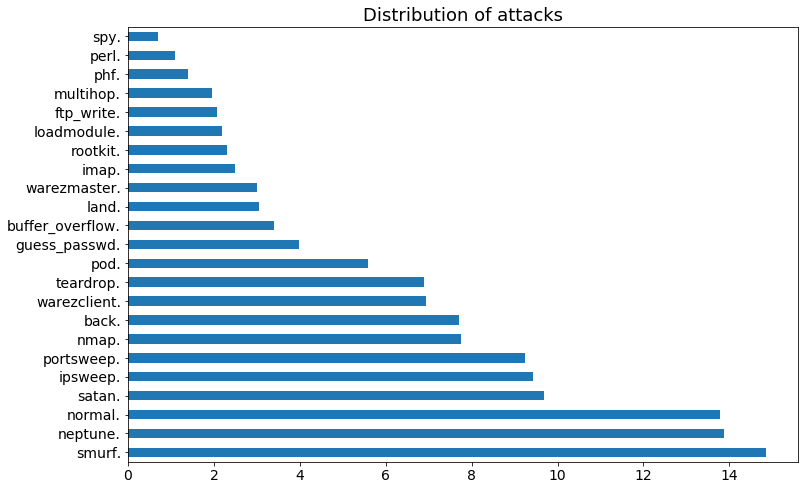

In [33]:
plt.clf()
plt.figure(figsize=(12,8))
params = {'axes.titlesize':'18',
          'xtick.labelsize':'14',
          'ytick.labelsize':'14'}
plt.rcParams.update(params)
plt.title('Distribution of attacks')
#df.plot(kind='barh')
df_initial['classes'].value_counts().apply(np.log).plot(kind='barh')

plt.show()

<Figure size 432x288 with 0 Axes>

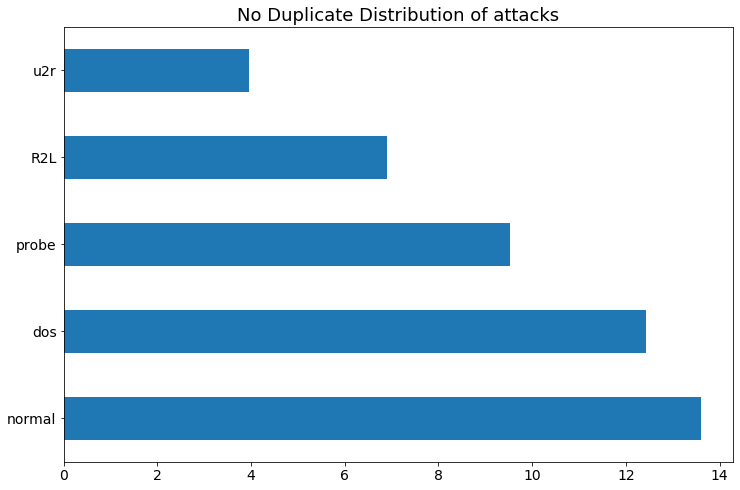

In [93]:
plt.clf()
plt.figure(figsize=(12,8))
params = {'axes.titlesize':'18',
          'xtick.labelsize':'14',
          'ytick.labelsize':'14'}
plt.rcParams.update(params)
plt.title('No Duplicate Distribution of attacks')
#df.plot(kind='barh')
df_no_duplicate['classes'].value_counts().apply(np.log).plot(kind='barh')

plt.show()

<Figure size 432x288 with 0 Axes>

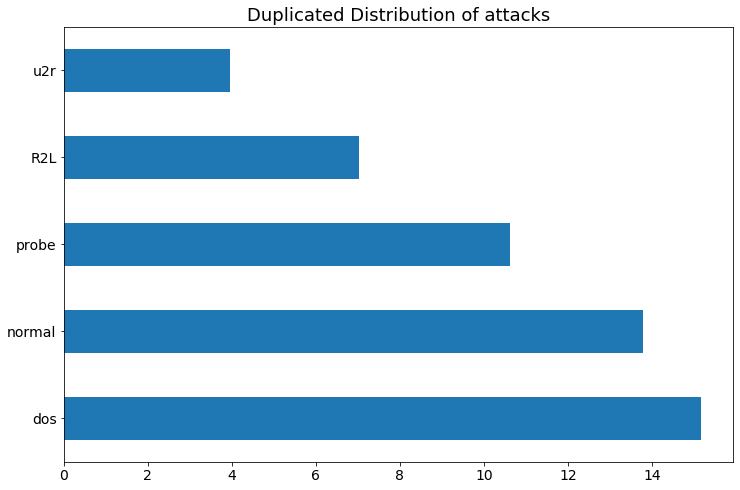

In [94]:
plt.clf()
plt.figure(figsize=(12,8))
params = {'axes.titlesize':'18',
          'xtick.labelsize':'14',
          'ytick.labelsize':'14'}
plt.rcParams.update(params)
plt.title('Duplicated Distribution of attacks')
#df.plot(kind='barh')
df['classes'].value_counts().apply(np.log).plot(kind='barh')

plt.show()

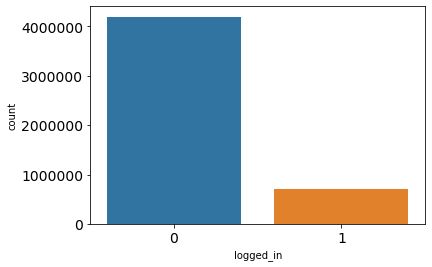

In [100]:
sns.countplot(x_categor['logged_in'])

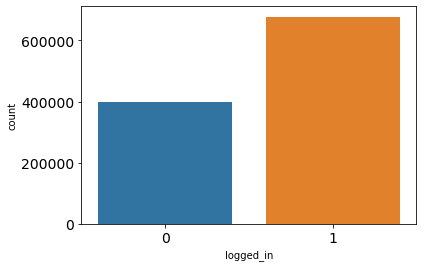

In [99]:
sns.countplot(x_categor_nd['logged_in'])

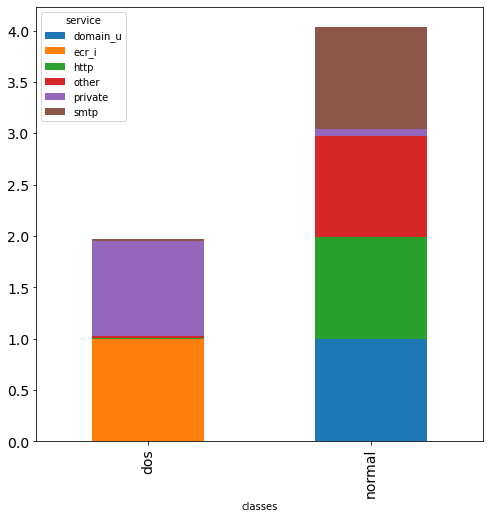

In [102]:
## Create a subset of main dataset (f_data) that contains only services and labels that represents at
## least 1% of the total cases

f_services = pd.crosstab(index=df["service"],columns="count")
f_services = f_services/len(df)
f_services = f_services[f_services["count"] > 0.01]

f_attacks = pd.crosstab(index=df["classes"],columns="count")
f_attacks = f_attacks/len(df)
f_attacks = f_attacks[f_attacks["count"] > 0.01]

f_data = df[df['service'].isin(list(f_services.index))]
f_data = f_data[f_data['classes'].isin(list(f_attacks.index))]

## Create the plot

attack_data = pd.crosstab(index = f_data["classes"], columns=f_data["service"])
frequency_table_attack = (attack_data/attack_data.sum())

frequency_table_attack.plot(kind="bar", 
                 figsize=(8,8),
                 stacked=True);

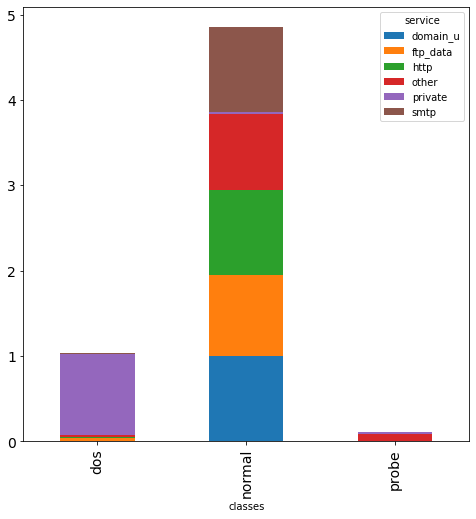

In [103]:
## Create a subset of main dataset (f_data) that contains only services and labels that represents at
## least 1% of the total cases

f_services = pd.crosstab(index=df_no_duplicate["service"],columns="count")
f_services = f_services/len(df_no_duplicate)
f_services = f_services[f_services["count"] > 0.01]

f_attacks = pd.crosstab(index=df_no_duplicate["classes"],columns="count")
f_attacks = f_attacks/len(df_no_duplicate)
f_attacks = f_attacks[f_attacks["count"] > 0.01]

f_data = df_no_duplicate[df_no_duplicate['service'].isin(list(f_services.index))]
f_data = f_data[f_data['classes'].isin(list(f_attacks.index))]

## Create the plot

attack_data = pd.crosstab(index = f_data["classes"], columns=f_data["service"])
frequency_table_attack = (attack_data/attack_data.sum())

frequency_table_attack.plot(kind="bar", 
                 figsize=(8,8),
                 stacked=True);

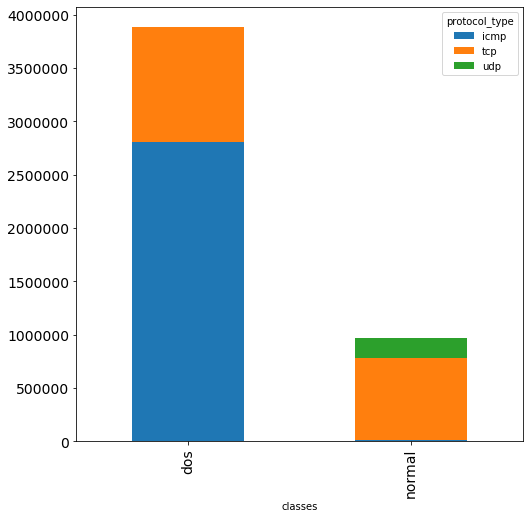

In [41]:
## Create a subset of main dataset (f_data) that contains only protocols and labels that represents at
## least 1% of the total cases

f_protocol = pd.crosstab(index=df["protocol_type"],columns="count")
f_protocol = f_protocol/len(df)
f_protocol = f_protocol[f_protocol["count"] > 0.01]

f_data = df[df['protocol_type'].isin(list(f_protocol.index))]
f_data = f_data[f_data['classes'].isin(list(f_attacks.index))]

## Create a Two-Way Table

relationship_protocoal_attack = pd.crosstab(index=f_data["classes"], 
                          columns=f_data["protocol_type"])
## Plot the Two-Way Table
relationship_protocoal_attack.plot(kind="bar", 
                 figsize=(8,8),
                 stacked=True);

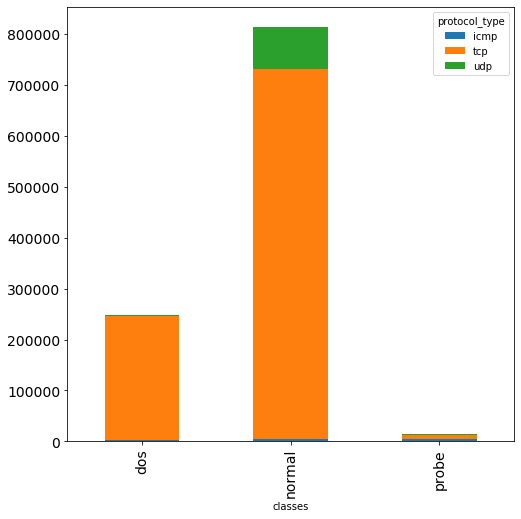

In [104]:
## Create a subset of main dataset (f_data) that contains only protocols and labels that represents at
## least 1% of the total cases

f_protocol = pd.crosstab(index=df_no_duplicate["protocol_type"],columns="count")
f_protocol = f_protocol/len(df_no_duplicate)
f_protocol = f_protocol[f_protocol["count"] > 0.01]

f_data = df_no_duplicate[df_no_duplicate['protocol_type'].isin(list(f_protocol.index))]
f_data = f_data[f_data['classes'].isin(list(f_attacks.index))]

## Create a Two-Way Table

relationship_protocoal_attack = pd.crosstab(index=f_data["classes"], 
                          columns=f_data["protocol_type"])
## Plot the Two-Way Table
relationship_protocoal_attack.plot(kind="bar", 
                 figsize=(8,8),
                 stacked=True);

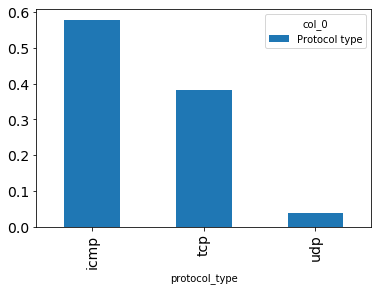

In [42]:
## Create a cross tab dataframe
protocol_data = pd.crosstab(index = df["protocol_type"],columns="Protocol type")
frequency_table_protocol = (protocol_data/protocol_data.sum())

## Plot the dataframe
frequency_table_protocol.plot.bar();

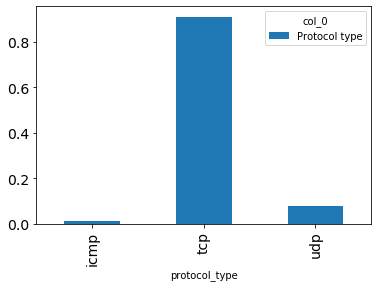

In [105]:
## Create a cross tab dataframe
protocol_data = pd.crosstab(index = df_no_duplicate["protocol_type"],columns="Protocol type")
frequency_table_protocol = (protocol_data/protocol_data.sum())

## Plot the dataframe
frequency_table_protocol.plot.bar();

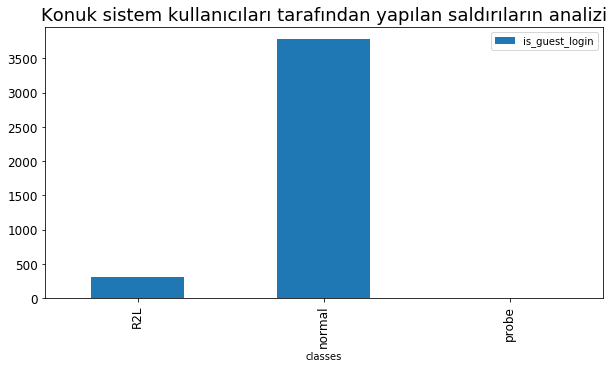

In [49]:
df_temp = df[["is_guest_login","classes"]]
df_temp = df_temp.loc[df_temp['is_guest_login'] == 1]
df_temp.groupby(["classes"]).count().plot(kind='bar', title ="Konuk sistem kullanıcıları tarafından yapılan saldırıların analizi", figsize=(10, 5), legend=True, fontsize=12)

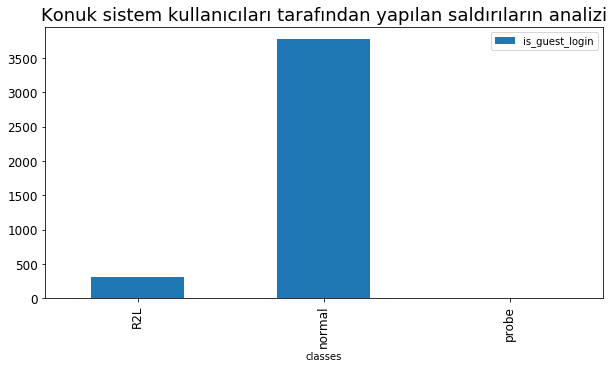

In [106]:
df_temp = df_no_duplicate[["is_guest_login","classes"]]
df_temp = df_temp.loc[df_temp['is_guest_login'] == 1]
df_temp.groupby(["classes"]).count().plot(kind='bar', title ="Konuk sistem kullanıcıları tarafından yapılan saldırıların analizi", figsize=(10, 5), legend=True, fontsize=12)

([<matplotlib.patches.Wedge at 0x18a365c5048>,
 [Text(-0.8487648787647506, 0.6997129272605004, 'Duplicate'),
  Text(0.8487649442765994, -0.6997128477933939, 'Unique')])

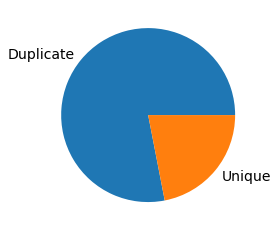

In [54]:
dup_ds = df[df.duplicated(keep="first")]
unique_s = df[df.duplicated(keep="first") == False]
plt.pie([dup_ds.shape[0], unique_s.shape[0]], labels=['Duplicate', 'Unique'])

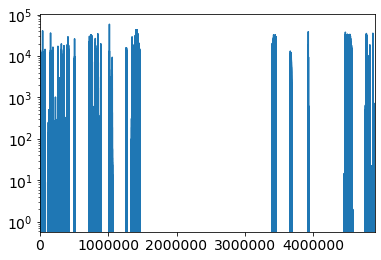

In [57]:
df_initial.duration.plot(kind='line', logy=True)

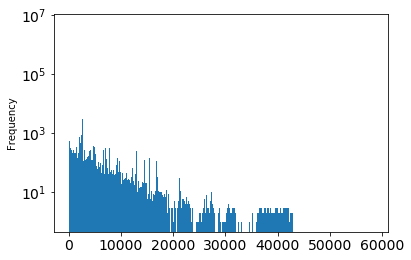

In [58]:
df_initial['duration'].plot(kind='hist', logy=True, bins=1000)

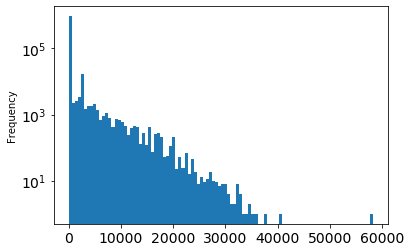

In [59]:
df[df['classes'] == 'normal']['duration'].plot(kind='hist', logy=True, bins=100)

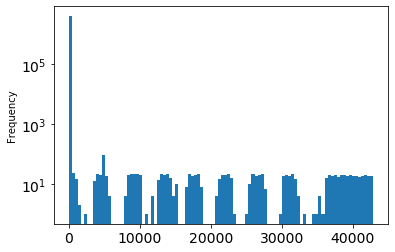

In [60]:
df[df['classes'] != 'normal']['duration'].plot(kind='hist', logy=True, bins=100)

<Figure size 432x288 with 0 Axes>

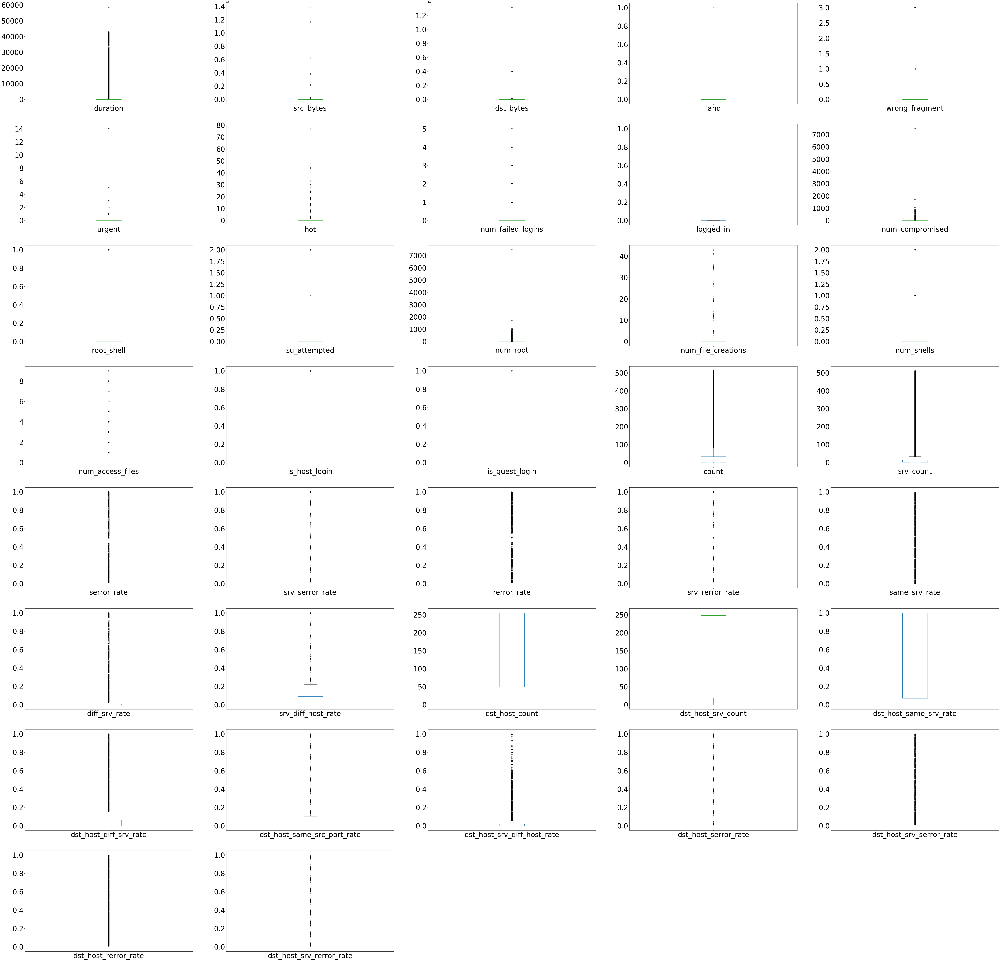

<Figure size 432x288 with 0 Axes>

In [156]:
fig = df_no_duplicate.plot(kind='box', subplots=True, figsize=(100,100), layout=(8,5), sharex=False, 
        fontsize=40, sharey=False)
plt.figure()
#This gives us a much clearer idea of the distribution of the input attributes:

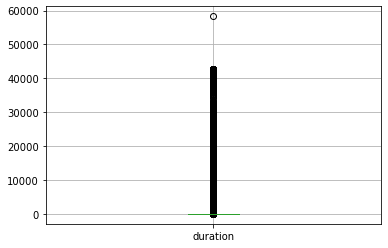

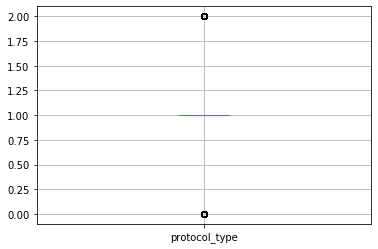

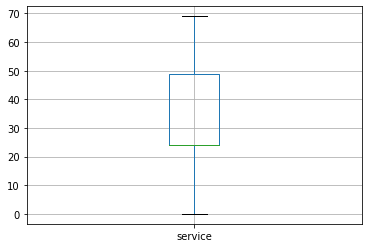

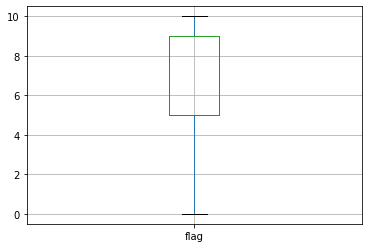

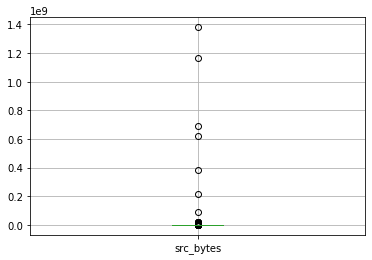

...

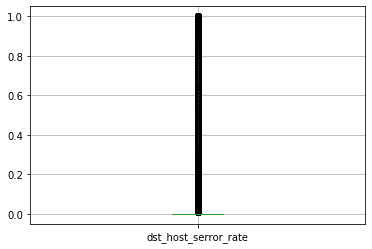

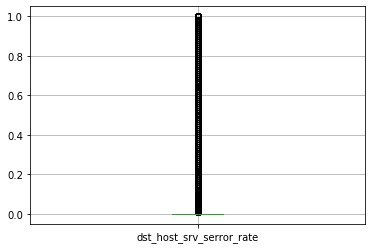

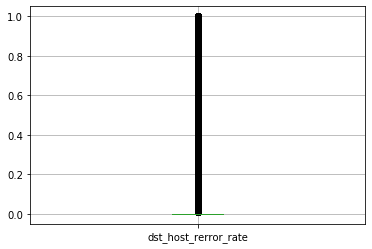

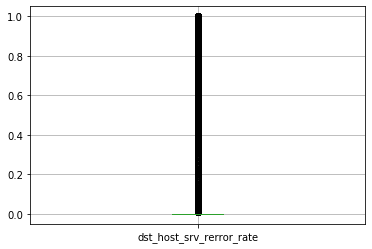

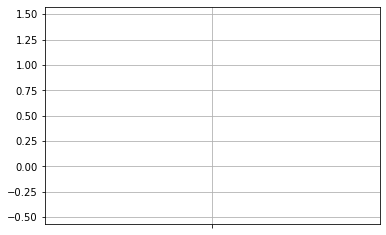

In [95]:
#BOX PLOTS OBSERVATION
for index in df_no_duplicate:
    fig = df_no_duplicate[[index]].boxplot()
    plt.show()

<Figure size 432x288 with 0 Axes>

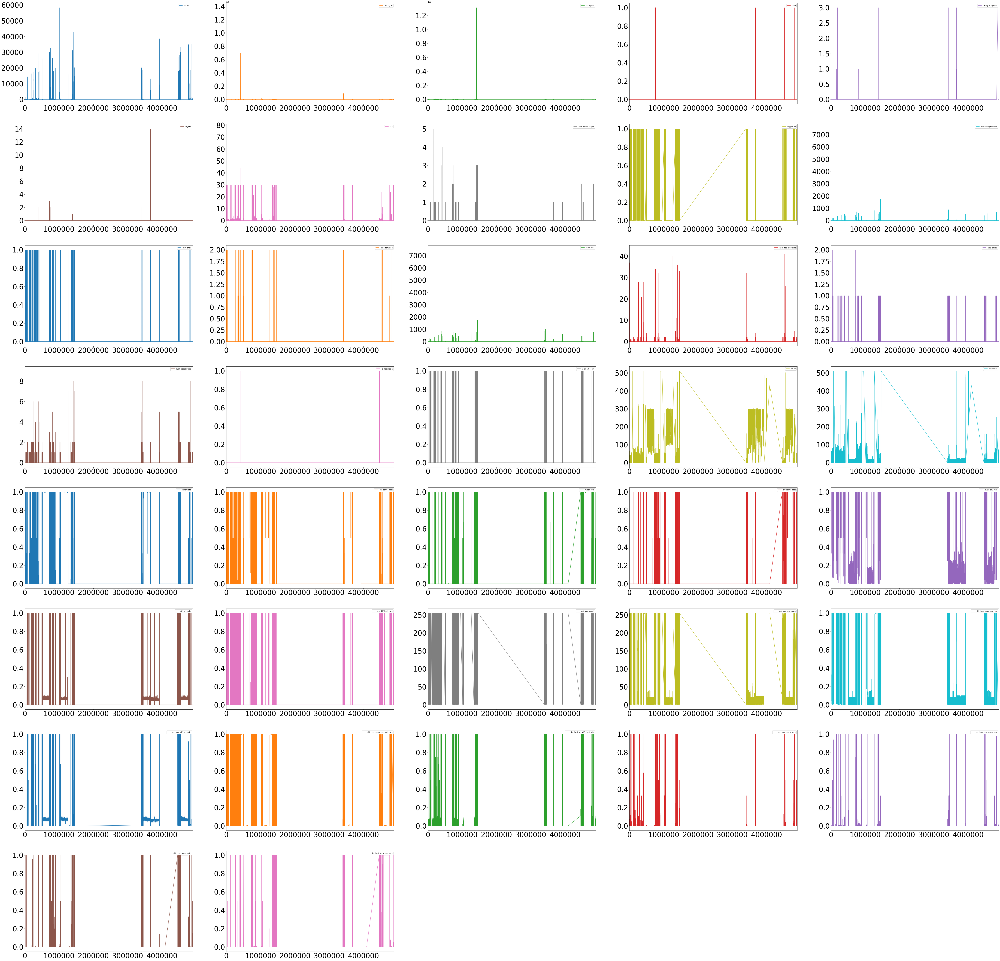

<Figure size 432x288 with 0 Axes>

In [155]:
find = df_no_duplicate.plot(kind='line', subplots=True, figsize=(100,100), layout=(8,5), sharex=False, fontsize=40, sharey=False)
plt.figure()
#This gives us a much clearer idea of the distribution of the input attributes:

# CORRELATION ANALYSIS

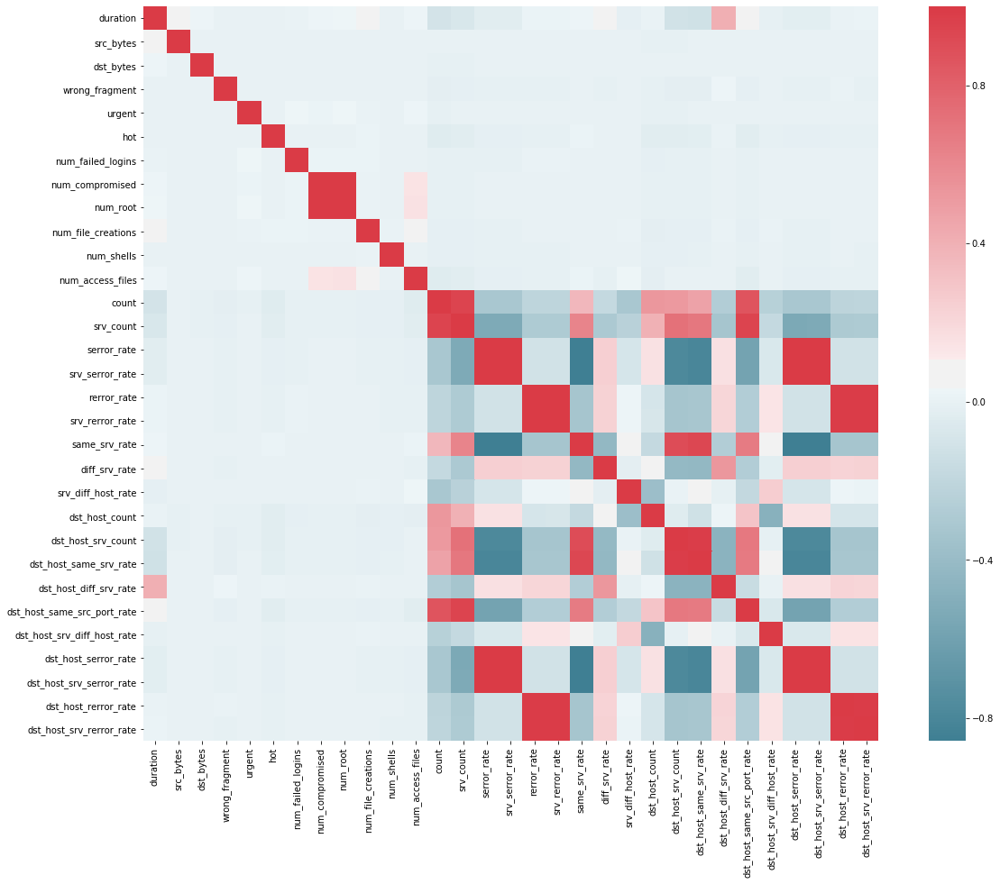

In [29]:
corr = x_numerical.corr()
f, ax = plt.subplots(figsize=(20, 15))

sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)

In [30]:
# Select upper triangle of correlation matrix
upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(np.bool))

In [32]:
to_drop = [column for column in upper.columns if any(upper[column] >= 0.75)]
to_drop

['num_root',
 'srv_count',
 'srv_serror_rate',
 'srv_rerror_rate',
 'dst_host_srv_count',
 'dst_host_same_srv_rate',
 'dst_host_same_src_port_rate',
 'dst_host_serror_rate',
 'dst_host_srv_serror_rate',
 'dst_host_rerror_rate',
 'dst_host_srv_rerror_rate']

In [33]:
for column in to_drop:
    print(column, len(df[column].unique()))

num_root 93
srv_count 512
srv_serror_rate 87
srv_rerror_rate 76
dst_host_srv_count 256
dst_host_same_srv_rate 101
dst_host_same_src_port_rate 101
dst_host_serror_rate 101
dst_host_srv_serror_rate 100
dst_host_rerror_rate 101
dst_host_srv_rerror_rate 101


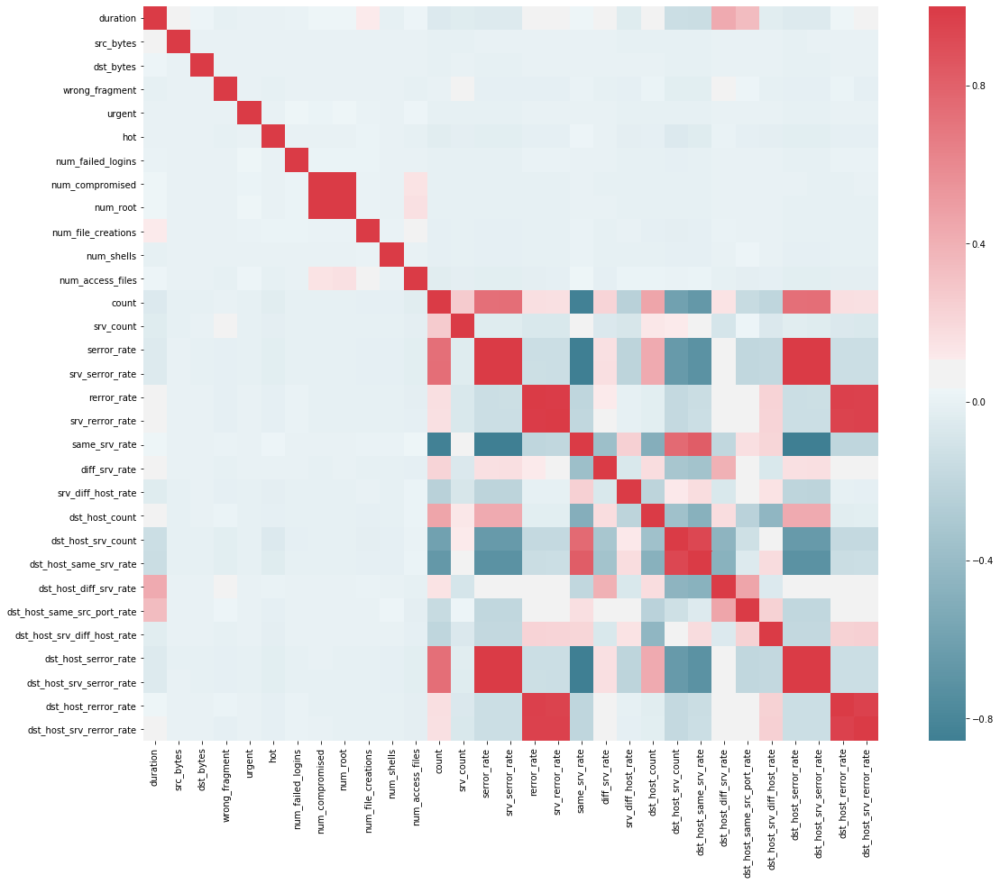

In [34]:
corr_nd = x_numerical_nd.corr()
f, ax = plt.subplots(figsize=(20, 15))

sns.heatmap(corr_nd, mask=np.zeros_like(corr_nd, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)

In [35]:
# Select upper triangle of correlation matrix
upper_nd = corr_nd.where(np.triu(np.ones(corr_nd.shape), k=1).astype(np.bool))

In [43]:
to_drop_nd = [column for column in upper_nd.columns if any(upper_nd[column] >= 0.9)]
to_drop_nd

['num_root',
 'srv_serror_rate',
 'srv_rerror_rate',
 'dst_host_same_srv_rate',
 'dst_host_serror_rate',
 'dst_host_srv_serror_rate',
 'dst_host_rerror_rate',
 'dst_host_srv_rerror_rate']

In [44]:
for column in to_drop_nd:
    print(column, len(df[column].unique()))

num_root 93
srv_serror_rate 87
srv_rerror_rate 76
dst_host_same_srv_rate 101
dst_host_serror_rate 101
dst_host_srv_serror_rate 100
dst_host_rerror_rate 101
dst_host_srv_rerror_rate 101


# Drop Correlated Columns

In [110]:
corr_column_names = ['dst_host_srv_serror_rate', 'srv_serror_rate', 'dst_host_serror_rate']
df_no_corr = df_no_duplicate.drop(corr_column_names, axis=1, inplace=False)

In [111]:
df_no_corr.shape

(1074983, 38)

In [112]:
X_nc = df_no_corr[df_no_corr.columns[:-1]]

In [113]:
## Identifying columns as categorical or not
categorial_features = ["protocol_type","service","flag","land","logged_in","root_shell","su_attempted",
                       "is_host_login","is_guest_login"]
x_categor_nc = X_nc.loc[:,categorial_features]

In [114]:
x_numerical_nc =X_nc[X_nc.columns.difference(categorial_features, sort=False)]

In [115]:
y_nc = df_no_corr['classes']

# SET INPUT ==> X and OUTPUT ==> y

## DataFrame after drop Duplicated rows and Correlated Columns "DF_NO_CORR"
- INPUT: X_nc ==> x_categor_nc, x_numerical_nc
- OUTPUT: y_nc

In [116]:
x_numerical_nc.shape

(1074983, 28)

In [117]:
x_categor_nc.shape

(1074983, 9)

In [118]:
y_nc.shape

(1074983,)

# FEATURE SELECTION

## Feature Importance with RandomForestClassifier

#### Model for DF

In [69]:
# ONLY LABEL NEED CATEGORICAL VARIABLES ARE ==> PROTOCOL, SERVICE, FLAG
# FIND UNIQUE VALUES IN THESE FEATURES
le_eda = LabelEncoder()
need_labeling = ['protocol_type', 'service','flag']

for i in need_labeling:
    le_eda.fit(df_no_corr[i])
    df_no_corr[i] = le_eda.transform(df_no_corr[i])

In [70]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(max_depth=25, random_state=42)

In [72]:
from sklearn.model_selection import train_test_split
X = df_no_corr[df_no_corr.columns[:-1]]
y = df_no_corr['classes']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.23, random_state=42)

In [74]:
from sklearn.preprocessing import MinMaxScaler
def do_normalization(x_train):
    cat_features = [ 'protocol_type',
                     'service',
                     'flag',
                     'land',
                     'logged_in',
                     'root_shell',
                     'su_attempted',
                     'is_host_login',
                     'is_guest_login']
    cols=list(x_train.axes[1].values)
    cont_features=list(set(cols).difference(set(cat_features)))
    scaler = MinMaxScaler()
    x_train.loc[:,cont_features]=scaler.fit_transform(x_train.loc[:,cont_features])
    return x_train
X_train = do_normalization(X_train)
X_test = do_normalization(X_test)

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [149]:
x_numerical_nc.shape

(1074992, 28)

In [152]:
y_nc = df_no_corr['classes']

In [76]:
rf.fit(X_train,y_train)

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=25, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [77]:
importances=[]
for (x,y) in zip((X_train.axes[1].values),rf.feature_importances_):
    importances.append([x, y])
    
print([i[0] for i in importances])

['duration', 'protocol_type', 'service', 'flag', 'src_bytes', 'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot', 'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell', 'su_attempted', 'num_root', 'num_file_creations', 'num_shells', 'num_access_files', 'is_host_login', 'is_guest_login', 'count', 'srv_count', 'serror_rate', 'rerror_rate', 'srv_rerror_rate', 'same_srv_rate', 'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count', 'dst_host_srv_count', 'dst_host_same_srv_rate', 'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate', 'dst_host_srv_diff_host_rate', 'dst_host_rerror_rate', 'dst_host_srv_rerror_rate']


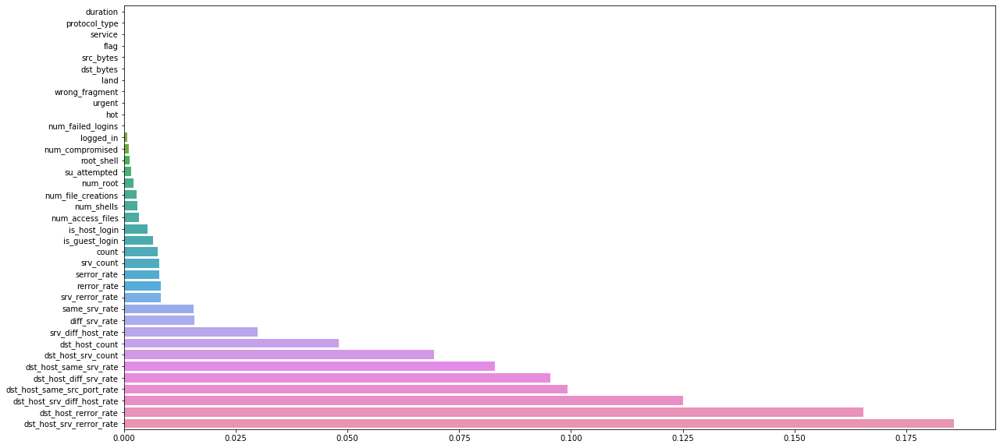

In [78]:
fig, axes = plt.subplots(figsize=(20,10))        
sns.barplot(x=np.sort([i[1] for i in importances]),y=[i[0] for i in importances])

#### Model for df_no_duplicate

In [79]:
le_eda = LabelEncoder()
need_labeling = ['protocol_type', 'service','flag']

for i in need_labeling:
    le_eda.fit(df_no_duplicate[i])
    df_no_duplicate[i] = le_eda.transform(df_no_duplicate[i])

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [80]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(max_depth=25, random_state=42)

In [81]:
from sklearn.model_selection import train_test_split
X = df_no_duplicate[df_no_duplicate.columns[:-1]]
y = df_no_duplicate['classes']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.23, random_state=42)

In [82]:
from sklearn.preprocessing import MinMaxScaler
def do_normalization(x_train):
    cat_features = [ 'protocol_type',
                     'service',
                     'flag',
                     'land',
                     'logged_in',
                     'root_shell',
                     'su_attempted',
                     'is_host_login',
                     'is_guest_login']
    cols=list(x_train.axes[1].values)
    cont_features=list(set(cols).difference(set(cat_features)))
    scaler = MinMaxScaler()
    x_train.loc[:,cont_features]=scaler.fit_transform(x_train.loc[:,cont_features])
    return x_train
X_train = do_normalization(X_train)
X_test = do_normalization(X_test)

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [84]:
rf.fit(X_train,y_train)

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=25, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [85]:
importances=[]
for (x,y) in zip((X_train.axes[1].values),rf.feature_importances_):
    importances.append([x, y])
    
print([i[0] for i in importances])

['duration', 'protocol_type', 'service', 'flag', 'src_bytes', 'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot', 'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell', 'su_attempted', 'num_root', 'num_file_creations', 'num_shells', 'num_access_files', 'is_host_login', 'is_guest_login', 'count', 'srv_count', 'serror_rate', 'srv_serror_rate', 'rerror_rate', 'srv_rerror_rate', 'same_srv_rate', 'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count', 'dst_host_srv_count', 'dst_host_same_srv_rate', 'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate', 'dst_host_srv_diff_host_rate', 'dst_host_serror_rate', 'dst_host_srv_serror_rate', 'dst_host_rerror_rate', 'dst_host_srv_rerror_rate']


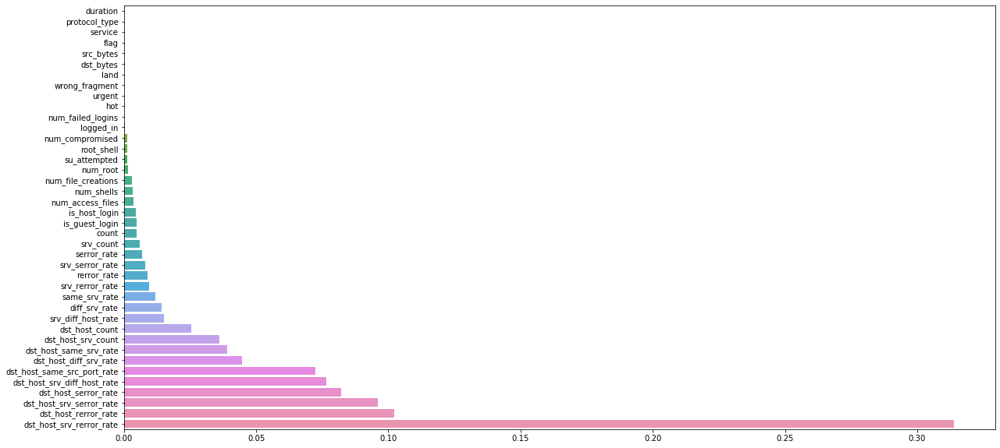

In [86]:
fig, axes = plt.subplots(figsize=(20,10))        
sns.barplot(x=np.sort([i[1] for i in importances]),y=[i[0] for i in importances])

#### Model for df_no_corr

In [87]:
le_eda = LabelEncoder()
need_labeling = ['protocol_type', 'service','flag']

for i in need_labeling:
    le_eda.fit(df[i])
    df[i] = le_eda.transform(df[i])

In [88]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(max_depth=25, random_state=42)

In [89]:
from sklearn.model_selection import train_test_split
X = df[df.columns[:-1]]
y = df['classes']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.23, random_state=42)

In [90]:
from sklearn.preprocessing import MinMaxScaler
def do_normalization(x_train):
    cat_features = [ 'protocol_type',
                     'service',
                     'flag',
                     'land',
                     'logged_in',
                     'root_shell',
                     'su_attempted',
                     'is_host_login',
                     'is_guest_login']
    cols=list(x_train.axes[1].values)
    cont_features=list(set(cols).difference(set(cat_features)))
    scaler = MinMaxScaler()
    x_train.loc[:,cont_features]=scaler.fit_transform(x_train.loc[:,cont_features])
    return x_train
X_train = do_normalization(X_train)
X_test = do_normalization(X_test)

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [92]:
rf.fit(X_train,y_train)

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=25, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [93]:
importances=[]
for (x,y) in zip((X_train.axes[1].values),rf.feature_importances_):
    importances.append([x, y])
    
print([i[0] for i in importances])

['duration', 'protocol_type', 'service', 'flag', 'src_bytes', 'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot', 'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell', 'su_attempted', 'num_root', 'num_file_creations', 'num_shells', 'num_access_files', 'is_host_login', 'is_guest_login', 'count', 'srv_count', 'serror_rate', 'srv_serror_rate', 'rerror_rate', 'srv_rerror_rate', 'same_srv_rate', 'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count', 'dst_host_srv_count', 'dst_host_same_srv_rate', 'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate', 'dst_host_srv_diff_host_rate', 'dst_host_serror_rate', 'dst_host_srv_serror_rate', 'dst_host_rerror_rate', 'dst_host_srv_rerror_rate']


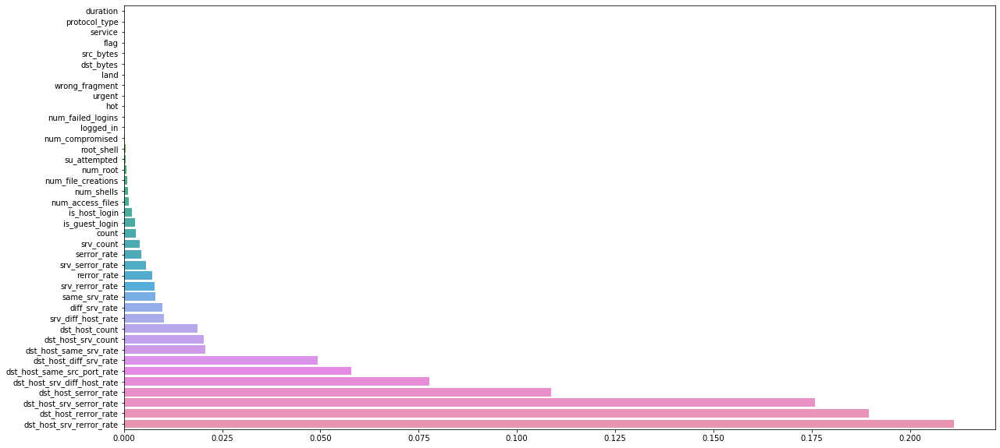

In [94]:
fig, axes = plt.subplots(figsize=(20,10))        
sns.barplot(x=np.sort([i[1] for i in importances]),y=[i[0] for i in importances])

## Results of EDA

- We find 1 feature that doesn't impact on target
    - 'num_outbound_cmds'
    
    
- 3 feature we've deleted due to high correlation
    - 'dst_host_srv_serror_rate' 
    - 'srv_serror_rate' 
    - 'dst_host_serror_rate'


- Many samples had duplicate.
    - ~78% of initial dataset reduced
    
    
- It seems that some of features are not important
    - You can find importan and non-important feature for output columns.
    - You can drop some of these non-important column if you want to 
        - Make the learning algorithm faster
        - Decrease harmful bias
        - Interpretability of your model

In [111]:
# CREATE BINARY OUTPUT (ATTACK & NORMAL) WITH DF
df_binary = df.copy()
df_binary.loc[df_binary.classes != 'normal','classes']= 1
df_binary.loc[df_binary.classes == 'normal','classes']= 0

In [112]:
# ONLY LABEL NEED CATEGORICAL VARIABLES ARE ==> PROTOCOL, SERVICE, FLAG
# FIND UNIQUE VALUES IN THESE FEATURES
le = LabelEncoder()
need_labeling = ['protocol_type', 'service','flag']

for i in need_labeling:
    le.fit(df_binary[i])
    df_binary[i] = le.transform(df_binary[i])

In [113]:
## Split the data in train and test datasets (with duplicates)

df_b = df_binary.copy()
y_b = pd.factorize(df_b['classes'])[0]
df_b = df_b.drop('classes', 1)
X_train_b, X_test_b, y_train_b, y_test_b = train_test_split(df_b, y_b, test_size=0.2, random_state=42)

In [115]:
df.shape,X_train_b.shape, X_test_b.shape, y_train_b.shape, y_test_b.shape

((4898431, 41), (3918744, 40), (979687, 40), (3918744,), (979687,))

In [12]:
# CREATE BINARY OUTPUT (ATTACK & NORMAL) WITH DF_no_duplicate
df_binary_duplicates = df_no_duplicate.copy()
df_binary_duplicates.loc[df_binary_duplicates.classes != "normal",'classes']= 1
df_binary_duplicates.loc[df_binary_duplicates.classes == "normal",'classes']= 0

In [13]:
# ONLY LABEL NEED CATEGORICAL VARIABLES ARE ==> PROTOCOL, SERVICE, FLAG
# FIND UNIQUE VALUES IN THESE FEATURES
le = LabelEncoder()
need_labeling = ['protocol_type', 'service','flag']

for i in need_labeling:
    le.fit(df_binary_duplicates[i])
    df_binary_duplicates[i] = le.transform(df_binary_duplicates[i])

In [14]:
## Split the data in train and test datasets (without duplicates)
df_b_nd = df_binary_duplicates.copy()
y_b_nd = pd.factorize(df_b_nd['classes'])[0]
df_b_nd = df_b_nd.drop('classes', 1)
X_train_bnd, X_test_bnd, y_train_bnd, y_test_bnd = train_test_split(df_b_nd, y_b_nd, test_size=0.2, random_state=42)

In [15]:
df_binary_duplicates.shape, X_train_bnd.shape, X_test_bnd.shape, y_train_bnd.shape, y_test_bnd.shape

((1074983, 41), (859986, 40), (214997, 40), (859986,), (214997,))

In [120]:
# ONLY LABEL NEED CATEGORICAL VARIABLES ARE ==> PROTOCOL, SERVICE, FLAG
# FIND UNIQUE VALUES IN THESE FEATURES
le = LabelEncoder()
need_labeling = ['protocol_type', 'service','flag']

for i in need_labeling:
    le.fit(df[i])
    df[i] = le.transform(df[i])

In [121]:
# Dataset (non binary) with duplicates

df_temp = df.copy()
y = df_temp['classes']
df_temp = df_temp.drop('classes', 1)
X_train, X_test, y_train, y_test = train_test_split(df_temp, y, test_size=0.2, random_state=42)

In [122]:
df.shape,X_train.shape, X_test.shape, y_train.shape, y_test.shape

((4898431, 41), (3918744, 40), (979687, 40), (3918744,), (979687,))

In [123]:
df_binary.classes.value_counts()

1    3925650
0     972781
Name: classes, dtype: int64

In [16]:
# ONLY LABEL NEED CATEGORICAL VARIABLES ARE ==> PROTOCOL, SERVICE, FLAG
# FIND UNIQUE VALUES IN THESE FEATURES
le = LabelEncoder()
need_labeling = ['protocol_type', 'service','flag']

for i in need_labeling:
    le.fit(df_no_duplicate[i])
    df_no_duplicate[i] = le.transform(df_no_duplicate[i])

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [17]:
# Dataset (non binary) without duplicates

df_nd  = df_no_duplicate.copy()
y_nd = df_nd['classes']
df_nd = df_nd.drop('classes', 1)
X_train_nd, X_test_nd, y_train_nd, y_test_nd = train_test_split(df_nd , y_nd, test_size=0.2, random_state=42)

In [18]:
df_no_duplicate.shape,X_train_nd.shape, X_test_nd.shape, y_train_nd.shape, y_test_nd.shape

((1074983, 41), (859986, 40), (214997, 40), (859986,), (214997,))

In [19]:
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

Model Accuracy for Binary with no duplicates is: 0.7301393200073084

 ------------------------------------

              precision    recall  f1-score   support

      normal        0.1       0.1       0.1    194689
      attack        0.8       0.9       0.8    784998

    accuracy                            0.7    979687
   macro avg        0.5       0.5       0.5    979687
weighted avg        0.7       0.7       0.7    979687


 ------------------------------------

ROC-AUC Score is ..: 0.4744777742879804
Log Loss Score is ..: 9.32080861139005


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



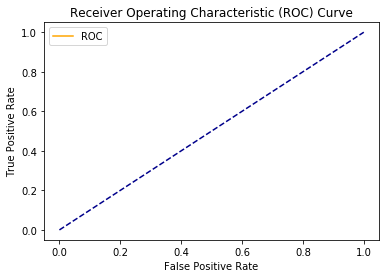

In [127]:
# Gaussian NB used for binary classification.
gnb = GaussianNB()
gnb.fit(X_train_b,y_train_b)
print("Model Accuracy for {} is: {}".format("Binary with no duplicates",gnb.score(X_test_b,y_test_b)))
print("\n ------------------------------------\n")
y_pred = gnb.predict(X_test_b)
target_names = ['normal','attack']
print(classification_report(y_test_b, y_pred, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_b, y_pred))
print("Log Loss Score is ..:",log_loss(y_test_b, y_pred, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_b, y_pred, pos_label=2)
plot_roc_curve(fpr,tpr)

Model Accuracy for Binary with duplicates is: 0.8223417070935873

 ------------------------------------

              precision    recall  f1-score   support

      normal        0.8       1.0       0.9    162675
      attack        0.9       0.3       0.4     52322

    accuracy                            0.8    214997
   macro avg        0.9       0.6       0.7    214997
weighted avg        0.8       0.8       0.8    214997


 ------------------------------------

ROC-AUC Score is ..: 0.6447019468591094
Log Loss Score is ..: 6.136105624622478


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



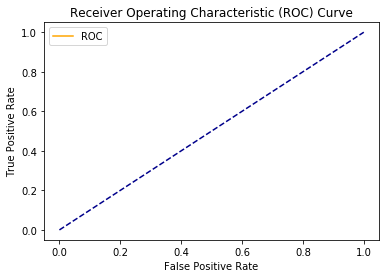

In [128]:
# Gaussian NB used for binary classification.
gnb = GaussianNB()
gnb.fit(X_train_bnd,y_train_bnd)
print("Model Accuracy for {} is: {}".format("Binary with duplicates",gnb.score(X_test_bnd,y_test_bnd)))
print("\n ------------------------------------\n")
y_pred = gnb.predict(X_test_bnd)
target_names = ['normal','attack']
print(classification_report(y_test_bnd, y_pred, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_bnd, y_pred))
print("Log Loss Score is ..:",log_loss(y_test_bnd, y_pred, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_bnd, y_pred, pos_label=2)
plot_roc_curve(fpr,tpr)

In [129]:
# For first 3 model, Gaussian NB used for binary classification.
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report
from sklearn import metrics
from sklearn.metrics import log_loss
from sklearn.metrics import roc_auc_score

gnb = GaussianNB()
gnb.fit(X_train,y_train)
print("Model Accuracy for {} is: {}".format("Not Binary with no duplicates",gnb.score(X_test,y_test)))
print("\n ------------------------------------\n")
y_pred = gnb.predict(X_test)
target_names = ['normal','prop','dos','u2r','r2l']
print(classification_report(y_test, y_pred, target_names=target_names, digits=4))
print("\n ------------------------------------\n")

Model Accuracy for Not Binary with no duplicates is: 0.9250536140624506

 ------------------------------------

              precision    recall  f1-score   support

      normal     0.0049    0.0045    0.0047       224
        prop     0.9303    0.9991    0.9634    776508
         dos     0.9806    0.6693    0.7955    194689
         u2r     0.0853    0.0189    0.0309      8254
         r2l     0.0009    0.8333    0.0018        12

    accuracy                         0.9251    979687
   macro avg     0.4004    0.5050    0.3593    979687
weighted avg     0.9329    0.9251    0.9220    979687


 ------------------------------------



In [130]:
# For first 3 model, Gaussian NB used for binary classification.
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report
from sklearn import metrics
from sklearn.metrics import log_loss
from sklearn.metrics import roc_auc_score

gnb = GaussianNB()
gnb.fit(X_train_nd,y_train_nd)
print("Model Accuracy for {} is: {}".format("Not Binary with duplicates",gnb.score(X_test_nd,y_test_nd)))
print("\n ------------------------------------\n")
y_pred = gnb.predict(X_test_nd)
target_names = ['normal','prop','dos','u2r','r2l']
print(classification_report(y_test_nd, y_pred, target_names=target_names, digits=4))
print("\n ------------------------------------\n")

Model Accuracy for Not Binary with duplicates is: 0.7020935175839663

 ------------------------------------

              precision    recall  f1-score   support

      normal     0.0000    0.0000    0.0000       182
        prop     0.4475    0.9959    0.6176     49352
         dos     0.9939    0.6247    0.7672    162675
         u2r     0.1422    0.0597    0.0841      2779
         r2l     0.0025    0.3333    0.0049         9

    accuracy                         0.7021    214997
   macro avg     0.3172    0.4027    0.2948    214997
weighted avg     0.8566    0.7021    0.7233    214997


 ------------------------------------



Model Accuracy for Binary with no duplicates is: 0.9990752148390252

 ------------------------------------

              precision    recall  f1-score   support

      normal        1.0       1.0       1.0    194689
      attack        1.0       1.0       1.0    784998

    accuracy                            1.0    979687
   macro avg        1.0       1.0       1.0    979687
weighted avg        1.0       1.0       1.0    979687


 ------------------------------------

ROC-AUC Score is ..: 0.9993572658227999
Log Loss Score is ..: 0.031940975638242296


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



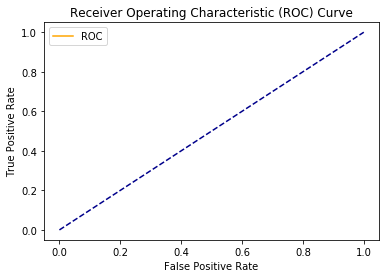

In [231]:
clf_mlp = MLPClassifier(solver='adam', alpha=1e-5,
                hidden_layer_sizes=(5, 2), random_state=1)
clf_mlp.fit(X_train_b,y_train_b)
print("Model Accuracy for {} is: {}".format("Binary with no duplicates",clf_mlp.score(X_test_b,y_test_b)))
print("\n ------------------------------------\n")
y_pred = clf_mlp.predict(X_test_b)
target_names = ['normal','attack']
print(classification_report(y_test_b, y_pred, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_b, y_pred))
print("Log Loss Score is ..:",log_loss(y_test_b, y_pred, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_b, y_pred, pos_label=2)
plot_roc_curve(fpr,tpr)

Model Accuracy for Binary with duplicates is: 0.9940882896040409

 ------------------------------------

              precision    recall  f1-score   support

      normal        1.0       1.0       1.0    162675
      attack        1.0       1.0       1.0     52322

    accuracy                            1.0    214997
   macro avg        1.0       1.0       1.0    214997
weighted avg        1.0       1.0       1.0    214997


 ------------------------------------

ROC-AUC Score is ..: 0.9879253661291286
Log Loss Score is ..: 0.204183284387705


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



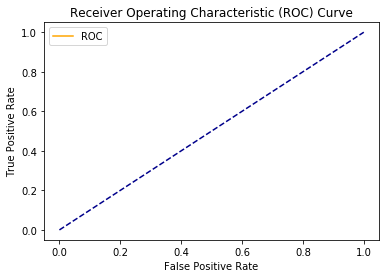

In [209]:
clf_mlp = MLPClassifier(solver='adam', alpha=1e-5,
                hidden_layer_sizes=(5, 2), random_state=1)
clf_mlp.fit(X_train_bnd,y_train_bnd)
print("Model Accuracy for {} is: {}".format("Binary with duplicates",clf_mlp.score(X_test_bnd,y_test_bnd)))
print("\n ------------------------------------\n")
y_pred = clf_mlp.predict(X_test_bnd)
target_names = ['normal','attack']
print(classification_report(y_test_bnd, y_pred, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_bnd, y_pred))
print("Log Loss Score is ..:",log_loss(y_test_bnd, y_pred, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_bnd, y_pred, pos_label=2)
plot_roc_curve(fpr,tpr)

In [210]:
clf_mlp = MLPClassifier(solver='adam', alpha=1e-5,
                hidden_layer_sizes=(5, 2), random_state=1)
clf_mlp.fit(X_train,y_train)
print("Model Accuracy for {} is: {}".format("Not Binary with no duplicates",clf_mlp.score(X_test,y_test)))
print("\n ------------------------------------\n")
y_pred = clf_mlp.predict(X_test)
target_names = ['normal','prop','dos','u2r','r2l']
print(classification_report(y_test, y_pred, target_names=target_names, digits=4))
print("\n ------------------------------------\n")

Model Accuracy for Not Binary with no duplicates is: 0.9989231254472092

 ------------------------------------



C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.



              precision    recall  f1-score   support

      normal     0.9948    0.9998    0.9973    194689
        prop     0.9961    0.9651    0.9804      8254
         dos     1.0000    0.9994    0.9997    776508
         u2r     0.0000    0.0000    0.0000        12
         r2l     0.0000    0.0000    0.0000       224

    accuracy                         0.9989    979687
   macro avg     0.5982    0.5929    0.5955    979687
weighted avg     0.9987    0.9989    0.9988    979687


 ------------------------------------



In [211]:
clf_mlp = MLPClassifier(solver='adam', alpha=1e-5,
                hidden_layer_sizes=(5, 2), random_state=1)
clf_mlp.fit(X_train_nd,y_train_nd)
print("Model Accuracy for {} is: {}".format("Not Binary with duplicates",clf_mlp.score(X_test_nd,y_test_nd)))
print("\n ------------------------------------\n")
y_pred = clf_mlp.predict(X_test_nd)
target_names = ['normal','prop','dos','u2r','r2l']
print(classification_report(y_test_nd, y_pred, target_names=target_names, digits=4))
print("\n ------------------------------------\n")

Model Accuracy for Not Binary with duplicates is: 0.9941813141578719

 ------------------------------------



C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.



              precision    recall  f1-score   support

      normal     0.9930    0.9994    0.9962    162675
        prop     0.9617    0.9496    0.9556      2779
         dos     0.9999    0.9834    0.9916     49352
         u2r     0.0000    0.0000    0.0000         9
         r2l     0.0000    0.0000    0.0000       182

    accuracy                         0.9942    214997
   macro avg     0.5909    0.5865    0.5887    214997
weighted avg     0.9933    0.9942    0.9937    214997


 ------------------------------------



In [20]:
def sort(featuresImportance):
    dummy = list()
    for i in range(len(featuresImportance)-1):
        for j in range(len(featuresImportance)-1):
            if featuresImportance[j][1] < featuresImportance[j+1][1]:
                dummy = featuresImportance[j][1]
                featuresImportance[j][1] = featuresImportance[j+1][1]
                featuresImportance[j+1][1] = dummy

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



Important 5 Feature Binary with no duplicates foram: 

duration, Effects: 0.3683474047965255
protocol_type, Effects: 0.20637578013144506
service, Effects: 0.08645642424309777
flag, Effects: 0.04486482158170445
src_bytes, Effects: 0.04415144208642384
Model Accuracy for Binary with no duplicates is: 0.9999459010888171

 ------------------------------------

              precision    recall  f1-score   support

      normal        1.0       1.0       1.0    194689
      attack        1.0       1.0       1.0    784998

    accuracy                            1.0    979687
   macro avg        1.0       1.0       1.0    979687
weighted avg        1.0       1.0       1.0    979687


 ------------------------------------

ROC-AUC Score is ..: 0.9999507919185006
Log Loss Score is ..: 0.001868516725965217


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



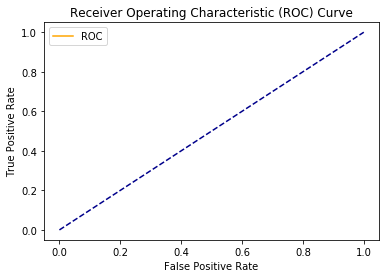

In [232]:
from sklearn.ensemble import RandomForestClassifier
rd_array = []

randomForest = RandomForestClassifier(criterion  = "entropy")
rd_array.append(randomForest.fit(X_train_b,y_train_b))

featuresImportance=[]
for (x,y) in zip((X_train_b.axes[1].values),randomForest.feature_importances_):
    featuresImportance.append([x, y])

sort(featuresImportance)
print("Important 5 Feature Binary with no duplicates foram: \n") 
for i in range (5):
    print("%s, Effects: %s" % (featuresImportance[i][0],featuresImportance[i][1]))

print("Model Accuracy for {} is: {}".format("Binary with no duplicates",randomForest.score(X_test_b,y_test_b)))
print("\n ------------------------------------\n")
y_pred = randomForest.predict(X_test_b)
target_names = ['normal','attack']
print(classification_report(y_test_b, y_pred, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_b, y_pred))
print("Log Loss Score is ..:",log_loss(y_test_b, y_pred, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_b, y_pred, pos_label=2)
plot_roc_curve(fpr,tpr)

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



Important 5 Feature Binary with duplicates foram: 

duration, Effects: 0.2893361455246395
protocol_type, Effects: 0.13450673705799845
service, Effects: 0.12843916030904326
flag, Effects: 0.08922654151689884
src_bytes, Effects: 0.08566826572628275
Model Accuracy for Binary with duplicates is: 0.9998186021200296

 ------------------------------------

              precision    recall  f1-score   support

      normal        1.0       1.0       1.0    162675
      attack        1.0       1.0       1.0     52322

    accuracy                            1.0    214997
   macro avg        1.0       1.0       1.0    214997
weighted avg        1.0       1.0       1.0    214997


 ------------------------------------

ROC-AUC Score is ..: 0.9996791685973676
Log Loss Score is ..: 0.006265290567687794


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



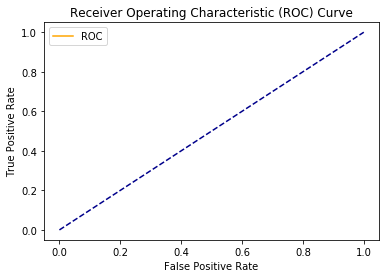

In [233]:
from sklearn.ensemble import RandomForestClassifier
rd_array = []

randomForest = RandomForestClassifier(criterion  = "entropy")
rd_array.append(randomForest.fit(X_train_bnd,y_train_bnd))

featuresImportance=[]
for (x,y) in zip((X_train_bnd.axes[1].values),randomForest.feature_importances_):
    featuresImportance.append([x, y])

sort(featuresImportance)
print("Important 5 Feature Binary with duplicates foram: \n") 
for i in range (5):
    print("%s, Effects: %s" % (featuresImportance[i][0],featuresImportance[i][1]))

print("Model Accuracy for {} is: {}".format("Binary with duplicates",randomForest.score(X_test_bnd,y_test_bnd)))
print("\n ------------------------------------\n")
y_pred = randomForest.predict(X_test_bnd)
target_names = ['normal','attack']
print(classification_report(y_test_bnd, y_pred, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_bnd, y_pred))
print("Log Loss Score is ..:",log_loss(y_test_bnd, y_pred, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_bnd, y_pred, pos_label=2)
plot_roc_curve(fpr,tpr)

In [234]:
from sklearn.ensemble import RandomForestClassifier
rd_array = []

randomForest = RandomForestClassifier(criterion  = "entropy")
rd_array.append(randomForest.fit(X_train,y_train))

featuresImportance=[]
for (x,y) in zip((X_train.axes[1].values),randomForest.feature_importances_):
    featuresImportance.append([x, y])

sort(featuresImportance)
print("Important 5 Feature Not Binary with no duplicates foram: \n") 
for i in range (5):
    print("%s, Effects: %s" % (featuresImportance[i][0],featuresImportance[i][1]))

print("Model Accuracy for {} is: {}".format("Not Binary with no duplicates",randomForest.score(X_test,y_test)))
print("\n ------------------------------------\n")
y_pred = randomForest.predict(X_test)
target_names = ['normal','prop','dos','u2r','r2l']
print(classification_report(y_test, y_pred, target_names=target_names, digits=4))
print("\n ------------------------------------\n")

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



Important 5 Feature Not Binary with no duplicates foram: 

duration, Effects: 0.1314162800541414
protocol_type, Effects: 0.10317353603300483
service, Effects: 0.09800730830126625
flag, Effects: 0.08428949101776216
src_bytes, Effects: 0.07737444500999403
Model Accuracy for Not Binary with no duplicates is: 0.9999469218229904

 ------------------------------------

              precision    recall  f1-score   support

      normal     0.9998    1.0000    0.9999    194689
        prop     0.9996    0.9978    0.9987      8254
         dos     1.0000    1.0000    1.0000    776508
         u2r     1.0000    0.3333    0.5000        12
         r2l     0.9817    0.9554    0.9683       224

    accuracy                         0.9999    979687
   macro avg     0.9962    0.8573    0.8934    979687
weighted avg     0.9999    0.9999    0.9999    979687


 ------------------------------------



In [235]:
from sklearn.ensemble import RandomForestClassifier
rd_array = []

randomForest = RandomForestClassifier(criterion  = "entropy")
rd_array.append(randomForest.fit(X_train_nd,y_train_nd))

featuresImportance=[]
for (x,y) in zip((X_train_nd.axes[1].values),randomForest.feature_importances_):
    featuresImportance.append([x, y])

sort(featuresImportance)
print("Important 5 Feature Not Binary with duplicates foram: \n") 
for i in range (5):
    print("%s, Effects: %s" % (featuresImportance[i][0],featuresImportance[i][1]))

print("Model Accuracy for {} is: {}".format("Not Binary with duplicates",clf_mlp.score(X_test_nd,y_test_nd)))
print("\n ------------------------------------\n")
y_pred = clf_mlp.predict(X_test_nd)
target_names = ['normal','prop','dos','u2r','r2l']
print(classification_report(y_test_nd, y_pred, target_names=target_names, digits=4))
print("\n ------------------------------------\n")

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



Important 5 Feature Not Binary with duplicates foram: 

duration, Effects: 0.18205606859166903
protocol_type, Effects: 0.178720231317263
service, Effects: 0.08883703186698973
flag, Effects: 0.07711190318623759
src_bytes, Effects: 0.07531342769283074
Model Accuracy for Not Binary with duplicates is: 0.7690293352930506

 ------------------------------------



C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.



              precision    recall  f1-score   support

      normal     0.9968    0.9998    0.9983    162675
        prop     0.0520    0.9691    0.0986      2779
         dos     0.0000    0.0000    0.0000     49352
         u2r     0.0000    0.0000    0.0000         9
         r2l     0.0000    0.0000    0.0000       182

    accuracy                         0.7690    214997
   macro avg     0.2098    0.3938    0.2194    214997
weighted avg     0.7549    0.7690    0.7566    214997


 ------------------------------------



In [29]:
from sklearn.ensemble import AdaBoostClassifier

params = {
    'n_estimators' : [50,100,200,300],
    'learning_rate' : [1,2,0.5,.1],
}

clf = GridSearchCV(AdaBoostClassifier(), params, n_jobs=2, verbose=2)
clf.fit(X_train_nd, y_train_nd)

print (clf.best_estimator_)
clf = clf.best_estimator_



C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



Fitting 3 folds for each of 16 candidates, totalling 48 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed: 127.7min
[Parallel(n_jobs=2)]: Done  48 out of  48 | elapsed: 169.9min finished


AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1,
                   n_estimators=50, random_state=None)


NameError: name 'X_test' is not defined

In [30]:
predict = clf.predict(X_test_nd)

In [32]:
print("Model Accuracy for {} is: {}".format("Not Binary with duplicates",clf.score(X_test_nd,y_test_nd)))
print("\n ------------------------------------\n")
target_names = ['normal','prop','dos','u2r','r2l']
print(classification_report(y_test_nd, predict, target_names=target_names, digits=4))
print("\n ------------------------------------\n")

Model Accuracy for Not Binary with duplicates is: 0.9257896621813327

 ------------------------------------



C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.



              precision    recall  f1-score   support

      normal     0.0000    0.0000    0.0000       182
        prop     0.9968    0.8315    0.9066     49352
         dos     0.9949    0.9570    0.9756    162675
         u2r     0.1344    0.8392    0.2317      2779
         r2l     0.0000    0.0000    0.0000         9

    accuracy                         0.9258    214997
   macro avg     0.4252    0.5255    0.4228    214997
weighted avg     0.9833    0.9258    0.9493    214997


 ------------------------------------



Model Accuracy for Binary with no duplicates is: 0.997575756338504

 ------------------------------------

              precision    recall  f1-score   support

      normal        1.0       1.0       1.0    194689
      attack        1.0       1.0       1.0    784998

    accuracy                            1.0    979687
   macro avg        1.0       1.0       1.0    979687
weighted avg        1.0       1.0       1.0    979687


 ------------------------------------

ROC-AUC Score is ..: 0.9982419880072576
Log Loss Score is ..: 0.08373051340559534


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



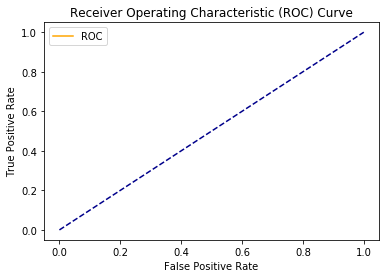

In [236]:
clf_gini = DecisionTreeClassifier(criterion = "gini", random_state = 100, max_depth=5, min_samples_leaf=5)
clf_gini.fit(X_train_b,y_train_b)
print("Model Accuracy for {} is: {}".format("Binary with no duplicates",clf_gini.score(X_test_b,y_test_b)))
print("\n ------------------------------------\n")
y_pred = clf_gini.predict(X_test_b)
target_names = ['normal','attack']
print(classification_report(y_test_b, y_pred, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_b, y_pred))
print("Log Loss Score is ..:",log_loss(y_test_b, y_pred, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_b, y_pred, pos_label=2)
plot_roc_curve(fpr,tpr)

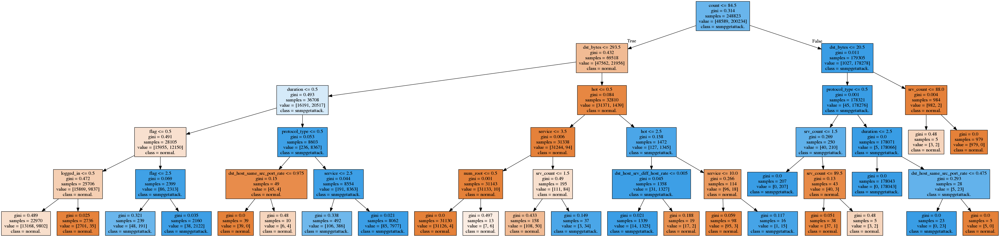

Model Accuracy for Binary with duplicates is: 0.9941115457424987

 ------------------------------------

              precision    recall  f1-score   support

      normal        1.0       1.0       1.0    162675
      attack        1.0       1.0       1.0     52322

    accuracy                            1.0    214997
   macro avg        1.0       1.0       1.0    214997
weighted avg        1.0       1.0       1.0    214997


 ------------------------------------

ROC-AUC Score is ..: 0.9890038800355239
Log Loss Score is ..: 0.20338063716014768


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



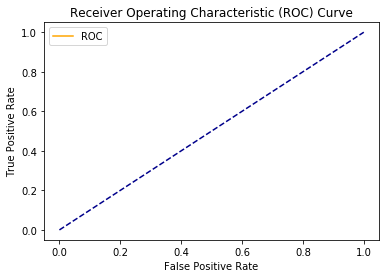

In [237]:
clf_gini = DecisionTreeClassifier(criterion = "gini", random_state = 100, max_depth=5, min_samples_leaf=5)
clf_gini.fit(X_train_bnd,y_train_bnd)
print("Model Accuracy for {} is: {}".format("Binary with duplicates",clf_gini.score(X_test_bnd,y_test_bnd)))
print("\n ------------------------------------\n")
y_pred = clf_gini.predict(X_test_bnd)
target_names = ['normal','attack']
print(classification_report(y_test_bnd, y_pred, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_bnd, y_pred))
print("Log Loss Score is ..:",log_loss(y_test_bnd, y_pred, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_bnd, y_pred, pos_label=2)
plot_roc_curve(fpr,tpr)

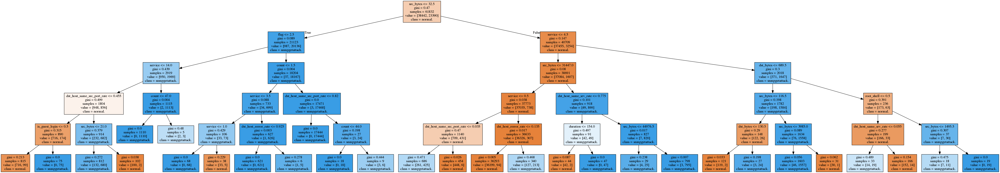

In [238]:
names = col_names[:len(col_names)-1]

clf_gini = DecisionTreeClassifier(criterion = "gini", random_state = 100, max_depth=5, min_samples_leaf=5)
clf_gini.fit(X_train,y_train)
print("Model Accuracy for {} is: {}".format("Not Binary with no duplicates",clf_gini.score(X_test,y_test)))
print("\n ------------------------------------\n")
y_pred = clf_gini.predict(X_test)
target_names = ['normal','prop','dos','u2r','r2l']
print(classification_report(y_test, y_pred, target_names=target_names, digits=4))
print("\n ------------------------------------\n")

Model Accuracy for Not Binary with no duplicates is: 0.997544113579133

 ------------------------------------



C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.



              precision    recall  f1-score   support

      normal     0.9885    0.9993    0.9939    194689
        prop     0.9954    0.7910    0.8815      8254
         dos     0.9998    0.9996    0.9997    776508
         u2r     0.0000    0.0000    0.0000        12
         r2l     0.0000    0.0000    0.0000       224

    accuracy                         0.9975    979687
   macro avg     0.5968    0.5580    0.5750    979687
weighted avg     0.9973    0.9975    0.9973    979687


 ------------------------------------



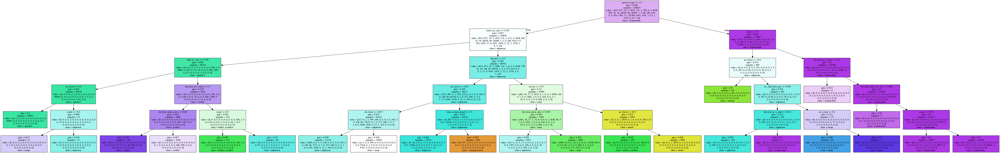

In [239]:
clf_gini = DecisionTreeClassifier(criterion = "gini", random_state = 100, max_depth=5, min_samples_leaf=5)
clf_gini.fit(X_train_nd,y_train_nd)
print("Model Accuracy for {} is: {}".format("Not Binary with duplicates",clf_mlp.score(X_test_nd,y_test_nd)))
print("\n ------------------------------------\n")
y_pred = clf_mlp.predict(X_test_nd)
target_names = ['normal','prop','dos','u2r','r2l']
print(classification_report(y_test_nd, y_pred, target_names=target_names, digits=4))
print("\n ------------------------------------\n")

Model Accuracy for Not Binary with duplicates is: 0.7690293352930506

 ------------------------------------



C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.



              precision    recall  f1-score   support

      normal     0.9968    0.9998    0.9983    162675
        prop     0.0520    0.9691    0.0986      2779
         dos     0.0000    0.0000    0.0000     49352
         u2r     0.0000    0.0000    0.0000         9
         r2l     0.0000    0.0000    0.0000       182

    accuracy                         0.7690    214997
   macro avg     0.2098    0.3938    0.2194    214997
weighted avg     0.7549    0.7690    0.7566    214997


 ------------------------------------



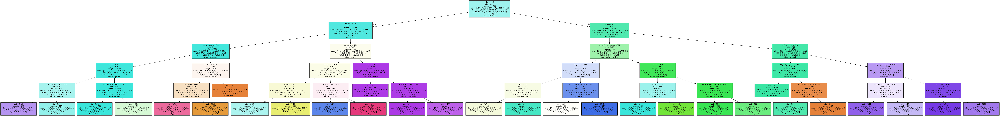

Model Accuracy for Binary with no duplicates is: 0.9993834765593501

 ------------------------------------

              precision    recall  f1-score   support

      normal        1.0       1.0       1.0    194689
      attack        1.0       1.0       1.0    784998

    accuracy                            1.0    979687
   macro avg        1.0       1.0       1.0    979687
weighted avg        1.0       1.0       1.0    979687


 ------------------------------------

ROC-AUC Score is ..: 0.9995380354754989
Log Loss Score is ..: 0.021293997905886528


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



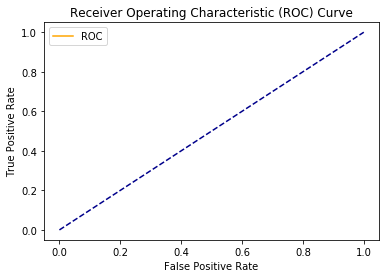

In [240]:
clf_gini = DecisionTreeClassifier(criterion = "entropy", random_state = 100, max_depth=5, min_samples_leaf=5)
clf_gini.fit(X_train_b,y_train_b)
print("Model Accuracy for {} is: {}".format("Binary with no duplicates",clf_gini.score(X_test_b,y_test_b)))
print("\n ------------------------------------\n")
y_pred = clf_gini.predict(X_test_b)
target_names = ['normal','attack']
print(classification_report(y_test_b, y_pred, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_b, y_pred))
print("Log Loss Score is ..:",log_loss(y_test_b, y_pred, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_b, y_pred, pos_label=2)
plot_roc_curve(fpr,tpr)

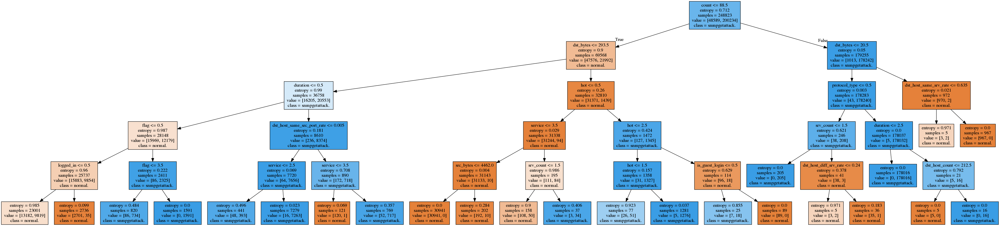

Model Accuracy for Binary with duplicates is: 0.9919161662720876

 ------------------------------------

              precision    recall  f1-score   support

      normal        1.0       1.0       1.0    162675
      attack        1.0       1.0       1.0     52322

    accuracy                            1.0    214997
   macro avg        1.0       1.0       1.0    214997
weighted avg        1.0       1.0       1.0    214997


 ------------------------------------

ROC-AUC Score is ..: 0.9845905880414106
Log Loss Score is ..: 0.2792064135773038


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



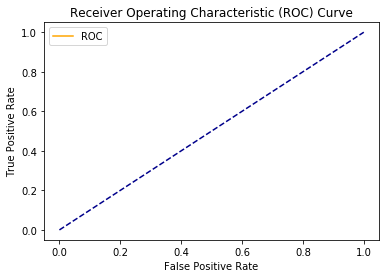

In [241]:
clf_gini = DecisionTreeClassifier(criterion = "entropy", random_state = 100, max_depth=5, min_samples_leaf=5)
clf_gini.fit(X_train_bnd,y_train_bnd)
print("Model Accuracy for {} is: {}".format("Binary with duplicates",clf_gini.score(X_test_bnd,y_test_bnd)))
print("\n ------------------------------------\n")
y_pred = clf_gini.predict(X_test_bnd)
target_names = ['normal','attack']
print(classification_report(y_test_bnd, y_pred, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_bnd, y_pred))
print("Log Loss Score is ..:",log_loss(y_test_bnd, y_pred, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_bnd, y_pred, pos_label=2)
plot_roc_curve(fpr,tpr)

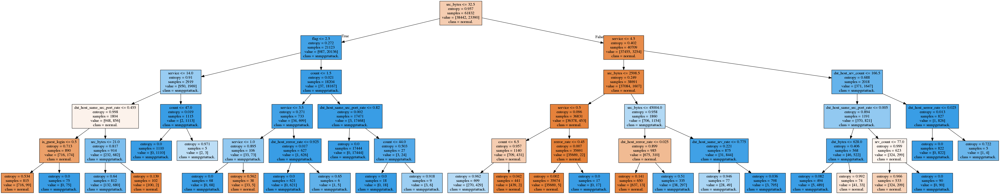

In [242]:
clf_gini = DecisionTreeClassifier(criterion = "entropy", random_state = 100, max_depth=5, min_samples_leaf=5)
clf_gini.fit(X_train,y_train)
print("Model Accuracy for {} is: {}".format("Not Binary with no duplicates",clf_gini.score(X_test,y_test)))
print("\n ------------------------------------\n")
y_pred = clf_gini.predict(X_test)
target_names = ['normal','prop','dos','u2r','r2l']
print(classification_report(y_test, y_pred, target_names=target_names, digits=4))
print("\n ------------------------------------\n")

Model Accuracy for Not Binary with no duplicates is: 0.9985485160056222

 ------------------------------------



C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.



              precision    recall  f1-score   support

      normal     0.9953    0.9987    0.9970    194689
        prop     0.9393    0.9422    0.9407      8254
         dos     1.0000    0.9994    0.9997    776508
         u2r     0.0000    0.0000    0.0000        12
         r2l     0.0000    0.0000    0.0000       224

    accuracy                         0.9985    979687
   macro avg     0.5869    0.5881    0.5875    979687
weighted avg     0.9983    0.9985    0.9984    979687


 ------------------------------------



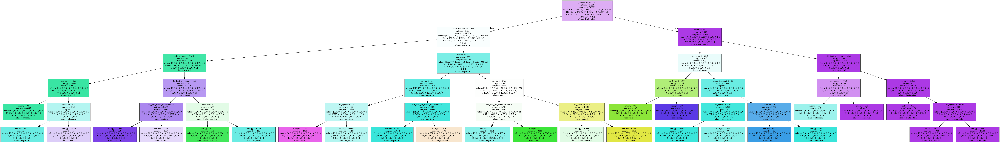

In [88]:
clf_gini = DecisionTreeClassifier(criterion = "entropy", random_state = 100, max_depth=5, min_samples_leaf=5)
clf_gini.fit(X_train_nd,y_train_nd)
print("Model Accuracy for {} is: {}".format("Not Binary with duplicates",clf_gini.score(X_test_nd,y_test_nd)))
print("\n ------------------------------------\n")
y_pred = clf_gini.predict(X_test_nd)
target_names = ['normal','prop','dos','u2r','r2l']
print(classification_report(y_test_nd, y_pred, target_names=target_names, digits=4))
print("\n ------------------------------------\n")

Model Accuracy for Not Binary with duplicates is: 0.9917580245305748

 ------------------------------------



C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.



              precision    recall  f1-score   support

      normal     0.9904    0.9988    0.9946    162675
        prop     0.9813    0.5473    0.7027      2779
         dos     0.9967    0.9973    0.9970     49352
         u2r     0.0000    0.0000    0.0000         9
         r2l     0.0000    0.0000    0.0000       182

    accuracy                         0.9918    214997
   macro avg     0.5937    0.5087    0.5389    214997
weighted avg     0.9908    0.9918    0.9905    214997


 ------------------------------------



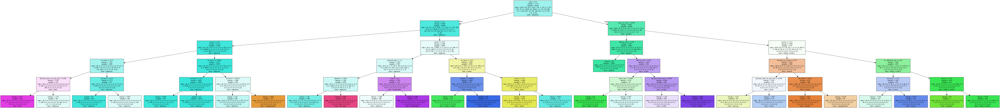

In [28]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



Fitting 3 folds for each of 20 candidates, totalling 60 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed: 23.8min
[Parallel(n_jobs=2)]: Done  60 out of  60 | elapsed: 41.1min finished


Model Accuracy for Binary with duplicates is: 0.9998558119415619

 ------------------------------------

              precision    recall  f1-score   support

      normal        1.0       1.0       1.0    162675
      attack        1.0       1.0       1.0     52322

    accuracy                            1.0    214997
   macro avg        1.0       1.0       1.0    214997
weighted avg        1.0       1.0       1.0    214997


 ------------------------------------

ROC-AUC Score is ..: 0.9997491356777748
Log Loss Score is ..: 0.004980105142976214


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



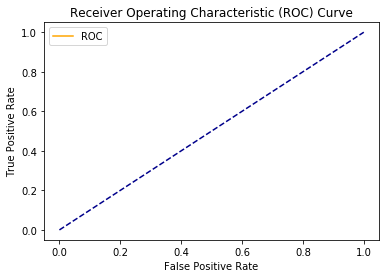

In [33]:
params = {
    'n_estimators' : [10,25,50,100],
    'max_depth' : [10,25,50,100,None],
}

clf = GridSearchCV(RandomForestClassifier(), params, n_jobs=2, verbose=2)
clf.fit(X_train_bnd,y_train_bnd)
clf = clf.best_estimator_
print("Model Accuracy for {} is: {}".format("Binary with duplicates",clf.score(X_test_bnd,y_test_bnd)))
print("\n ------------------------------------\n")
y_pred = clf.predict(X_test_bnd)
target_names = ['normal','attack']
print(classification_report(y_test_bnd, y_pred, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_bnd, y_pred))
print("Log Loss Score is ..:",log_loss(y_test_bnd, y_pred, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_bnd, y_pred, pos_label=2)
plot_roc_curve(fpr,tpr)

In [34]:
params = {
    'n_estimators' : [10,25,50,100],
    'max_depth' : [10,25,50,100,None],
}

clf = GridSearchCV(RandomForestClassifier(), params, n_jobs=2, verbose=2)
clf.fit(X_train_nd,y_train_nd)
clf = clf.best_estimator_


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



Fitting 3 folds for each of 20 candidates, totalling 60 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed: 16.3min
[Parallel(n_jobs=2)]: Done  60 out of  60 | elapsed: 28.9min finished


Model Accuracy for Binary with duplicates is: 0.9998418582584874

 ------------------------------------



ValueError: Number of classes, 5, does not match size of target_names, 2. Try specifying the labels parameter

In [35]:
print("Model Accuracy for {} is: {}".format("Not Binary with duplicates",clf.score(X_test_nd,y_test_nd)))
print("\n ------------------------------------\n")
y_pred = clf.predict(X_test_nd)
target_names = ['normal','prop','dos','u2r','r2l']
print(classification_report(y_test_nd, y_pred, target_names=target_names, digits=4))
print("\n ------------------------------------\n")

Model Accuracy for Not Binary with duplicates is: 0.9998418582584874

 ------------------------------------

              precision    recall  f1-score   support

      normal     0.9998    1.0000    0.9999    162675
        prop     0.9989    0.9964    0.9977      2779
         dos     0.9999    1.0000    0.9999     49352
         u2r     0.7143    0.5556    0.6250         9
         r2l     1.0000    0.9451    0.9718       182

    accuracy                         0.9998    214997
   macro avg     0.9426    0.8994    0.9189    214997
weighted avg     0.9998    0.9998    0.9998    214997


 ------------------------------------



In [ ]:
+++ LGBM olabilir
+++ en son bam bam neural network çallıştır bitsin
+++ Diğer sekmelerde knn ve cnn ortak falan da var
+++ Ramazan Abideki modelleri de deneyebilirsin

clf = XGBClassifier(max_depth=5, learning_rate=0.05, n_estimators=150, gamma=0, reg_lambda=2)
clf.fit(X_train,y_train)

predict = clf.predict(X_test)

In [61]:
import lightgbm as lgb

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



Fitting 3 folds for each of 108 candidates, totalling 324 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 324 out of 324 | elapsed: 51.8min finished


Model Accuracy for Binary with duplicates is: 0.9998744168523281

 ------------------------------------

              precision    recall  f1-score   support

      normal        1.0       1.0       1.0    162675
      attack        1.0       1.0       1.0     52322

    accuracy                            1.0    214997
   macro avg        1.0       1.0       1.0    214997
weighted avg        1.0       1.0       1.0    214997


 ------------------------------------

ROC-AUC Score is ..: 0.9998132909026464
Log Loss Score is ..: 0.004337529166614117


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



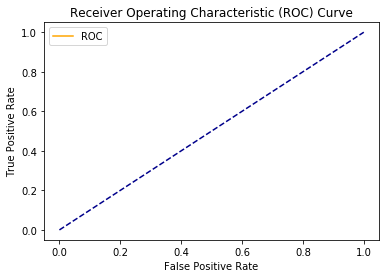

In [42]:
params = {
    'max_depth' : [3,5,10],
    'learning_rate' : [0.01,.05,.1],
    'n_estimators' :[100,150,200],
    'gamma' : [0,0.1],
    'reg_lambda' : [1,2]
}

clf = GridSearchCV(lgb.LGBMClassifier(), params, verbose=1)
clf.fit(X_train_bnd,y_train_bnd)
clf = clf.best_estimator_
print("Model Accuracy for {} is: {}".format("Binary with duplicates",clf.score(X_test_bnd,y_test_bnd)))
print("\n ------------------------------------\n")
y_pred = clf.predict(X_test_bnd)
target_names = ['normal','attack']
print(classification_report(y_test_bnd, y_pred, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_bnd, y_pred))
print("Log Loss Score is ..:",log_loss(y_test_bnd, y_pred, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_bnd, y_pred, pos_label=2)
plot_roc_curve(fpr,tpr)

In [43]:
params = {
    'max_depth' : [3,5,10],
    'learning_rate' : [0.01,.05,.1],
    'n_estimators' :[100,150,200],
    'gamma' : [0,0.1],
    'reg_lambda' : [1,2]
}

clf = GridSearchCV(lgb.LGBMClassifier(), params, verbose=1)
clf.fit(X_train_nd,y_train_nd)
clf = clf.best_estimator_
print("Model Accuracy for {} is: {}".format("Not Binary with duplicates",clf.score(X_test_nd,y_test_nd)))
print("\n ------------------------------------\n")
y_pred = clf.predict(X_test_nd)
target_names = ['normal','prop','dos','u2r','r2l']
print(classification_report(y_test_nd, y_pred, target_names=target_names, digits=4))
print("\n ------------------------------------\n")

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



Fitting 3 folds for each of 108 candidates, totalling 324 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 324 out of 324 | elapsed: 193.9min finished


Model Accuracy for Not Binary with duplicates is: 0.9998697656246366

 ------------------------------------

              precision    recall  f1-score   support

      normal     0.9999    0.9999    0.9999    162675
        prop     0.9978    0.9975    0.9977      2779
         dos     0.9999    1.0000    0.9999     49352
         u2r     0.7500    0.6667    0.7059         9
         r2l     0.9944    0.9780    0.9861       182

    accuracy                         0.9999    214997
   macro avg     0.9484    0.9284    0.9379    214997
weighted avg     0.9999    0.9999    0.9999    214997


 ------------------------------------



In [46]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
from scipy import stats
import tensorflow as tf
import seaborn as sns
from pylab import rcParams
from sklearn.model_selection import train_test_split
from keras.models import Model, load_model
from keras.layers import Input, Dense
from keras.callbacks import ModelCheckpoint, TensorBoard
from keras import regularizers
import pandas as pd
import lightgbm as lgb
from sklearn.metrics import confusion_matrix
from scipy.misc import derivative
from bayes_opt import BayesianOptimization

Using TensorFlow backend.


In [34]:
df_probe = df_no_duplicate[(df_no_duplicate.classes == 'normal') | (df_no_duplicate.classes == 'probe')]
df_probe['classes'] = np.where(df_probe['classes'] == 'normal', 0, 1)

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [35]:
df_nd_probe  = df_probe.copy()
y_nd_probe = df_nd_probe['classes']
df_nd_probe = df_nd_probe.drop('classes', 1)
X_train_probe, X_test_probe, y_train_probe, y_test_probe = train_test_split(df_nd_probe , y_nd_probe, test_size=0.2, random_state=42)

In [36]:
X_train_probe

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
4827263,0,1,20,9,1010,0,0,0,0,0,...,38,63,0.08,0.08,0.08,0.03,0.0,0.00,0.00,0.00
393455,0,1,54,9,1228,329,0,0,0,0,...,63,42,0.67,0.05,0.02,0.00,0.0,0.00,0.00,0.00
3420764,0,1,54,9,577,325,0,0,0,0,...,255,63,0.25,0.35,0.00,0.00,0.0,0.00,0.00,0.00
1410370,0,1,24,1,0,0,0,0,0,0,...,57,255,1.00,0.00,0.02,0.10,0.0,0.00,1.00,0.96
209759,0,1,24,9,144,9534,0,0,0,0,...,138,255,1.00,0.00,0.01,0.01,0.0,0.00,0.00,0.00
171666,0,1,24,9,288,5669,0,0,0,0,...,34,255,1.00,0.00,0.03,0.05,0.0,0.00,0.00,0.00
119352,0,1,24,9,150,9679,0,0,0,0,...,18,255,1.00,0.00,0.06,0.03,0.0,0.00,0.00,0.00
870700,0,1,24,9,300,711,0,0,0,0,...,255,255,1.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00
340462,0,1,24,9,329,261,0,0,0,0,...,255,255,1.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00
770239,0,1,24,9,216,674,0,0,0,0,...,68,234,1.00,0.00,0.01,0.05,0.0,0.00,0.00,0.00


In [37]:
df_probe.iloc[:,0:41].columns.to_list()

['duration',
 'protocol_type',
 'service',
 'flag',
 'src_bytes',
 'dst_bytes',
 'land',
 'wrong_fragment',
 'urgent',
 'hot',
 'num_failed_logins',
 'logged_in',
 'num_compromised',
 'root_shell',
 'su_attempted',
 'num_root',
 'num_file_creations',
 'num_shells',
 'num_access_files',
 'is_host_login',
 'is_guest_login',
 'count',
 'srv_count',
 'serror_rate',
 'srv_serror_rate',
 'rerror_rate',
 'srv_rerror_rate',
 'same_srv_rate',
 'diff_srv_rate',
 'srv_diff_host_rate',
 'dst_host_count',
 'dst_host_srv_count',
 'dst_host_same_srv_rate',
 'dst_host_diff_srv_rate',
 'dst_host_same_src_port_rate',
 'dst_host_srv_diff_host_rate',
 'dst_host_serror_rate',
 'dst_host_srv_serror_rate',
 'dst_host_rerror_rate',
 'dst_host_srv_rerror_rate',
 'classes']

In [93]:
df_probe.groupby('classes').count()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
classes,,,,,,,,,,,,,,,,,,,,,
0,812814,812814,812814,812814,812814,812814,812814,812814,812814,812814,...,812814,812814,812814,812814,812814,812814,812814,812814,812814,812814
1,13851,13851,13851,13851,13851,13851,13851,13851,13851,13851,...,13851,13851,13851,13851,13851,13851,13851,13851,13851,13851


In [94]:
a = (len(df_no_duplicate[(df_no_duplicate.classes == 'probe')]) / len(df_no_duplicate[(df_no_duplicate.classes == 'normal')]))
print("Ratio is ..: {}%".format(round(100*a,2)))

Ratio is ..: 1.7%


In [47]:
train_data = lgb.Dataset(X_train_probe, label=y_train_probe, feature_name=df_probe.iloc[:,0:40].columns.to_list())
test_data = lgb.Dataset(X_test_probe, label=y_test_probe)

In [48]:
parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'min_child_samples': 50,
    'boosting': 'gbdt',#dart,gbdt
    'num_leaves': 70,
    'feature_fraction': 0.5,
    'bagging_fraction': 0.8,
    'bagging_freq': 10,
    'learning_rate': 0.05,
    'verbose': 0,
    'max_depth': 6,
    'max bin' : 350
    
}

#lgb.cv(param, train_data, num_round, nfold=5)

evals_results = {}

model = lgb.train(parameters,
                       train_data,
                       valid_sets=test_data,
                       evals_result=evals_results,
                       #valid_sets=test_data,
                       num_boost_round=2000,
                       early_stopping_rounds=200)

[1]	valid_0's auc: 0.994419
Training until validation scores don't improve for 200 rounds.
[2]	valid_0's auc: 0.998171
[3]	valid_0's auc: 0.998489
[4]	valid_0's auc: 0.99856
[5]	valid_0's auc: 0.999141
[6]	valid_0's auc: 0.999229
[7]	valid_0's auc: 0.99937
[8]	valid_0's auc: 0.99948
[9]	valid_0's auc: 0.999592
[10]	valid_0's auc: 0.999607
[11]	valid_0's auc: 0.999676
[12]	valid_0's auc: 0.999723
[13]	valid_0's auc: 0.999756
[14]	valid_0's auc: 0.999799
[15]	valid_0's auc: 0.999839
[16]	valid_0's auc: 0.999841
[17]	valid_0's auc: 0.999844
[18]	valid_0's auc: 0.999873
[19]	valid_0's auc: 0.999883
[20]	valid_0's auc: 0.999901
[21]	valid_0's auc: 0.999905
[22]	valid_0's auc: 0.999913
[23]	valid_0's auc: 0.999919
[24]	valid_0's auc: 0.99992
[25]	valid_0's auc: 0.999924
[26]	valid_0's auc: 0.999938
[27]	valid_0's auc: 0.999942
[28]	valid_0's auc: 0.999945
[29]	valid_0's auc: 0.999946
[30]	valid_0's auc: 0.999948
[31]	valid_0's auc: 0.999949
[32]	valid_0's auc: 0.999951
[33]	valid_0's auc: 0.

[277]	valid_0's auc: 0.999994
[278]	valid_0's auc: 0.999994
[279]	valid_0's auc: 0.999994
[280]	valid_0's auc: 0.999994
[281]	valid_0's auc: 0.999994
[282]	valid_0's auc: 0.999994
[283]	valid_0's auc: 0.999994
[284]	valid_0's auc: 0.999994
[285]	valid_0's auc: 0.999994
[286]	valid_0's auc: 0.999994
[287]	valid_0's auc: 0.999993
[288]	valid_0's auc: 0.999994
[289]	valid_0's auc: 0.999994
[290]	valid_0's auc: 0.999994
[291]	valid_0's auc: 0.999994
[292]	valid_0's auc: 0.999994
[293]	valid_0's auc: 0.999994
[294]	valid_0's auc: 0.999994
[295]	valid_0's auc: 0.999994
[296]	valid_0's auc: 0.999994
[297]	valid_0's auc: 0.999994
[298]	valid_0's auc: 0.999994
[299]	valid_0's auc: 0.999994
[300]	valid_0's auc: 0.999994
[301]	valid_0's auc: 0.999994
[302]	valid_0's auc: 0.999994
[303]	valid_0's auc: 0.999994
[304]	valid_0's auc: 0.999994
[305]	valid_0's auc: 0.999994
[306]	valid_0's auc: 0.999994
[307]	valid_0's auc: 0.999994
[308]	valid_0's auc: 0.999994
[309]	valid_0's auc: 0.999994
[310]	vali

[551]	valid_0's auc: 0.999995
[552]	valid_0's auc: 0.999995
[553]	valid_0's auc: 0.999995
[554]	valid_0's auc: 0.999995
[555]	valid_0's auc: 0.999995
[556]	valid_0's auc: 0.999995
[557]	valid_0's auc: 0.999995
[558]	valid_0's auc: 0.999995
[559]	valid_0's auc: 0.999995
[560]	valid_0's auc: 0.999995
[561]	valid_0's auc: 0.999995
[562]	valid_0's auc: 0.999995
[563]	valid_0's auc: 0.999995
[564]	valid_0's auc: 0.999995
[565]	valid_0's auc: 0.999995
[566]	valid_0's auc: 0.999995
[567]	valid_0's auc: 0.999995
[568]	valid_0's auc: 0.999995
[569]	valid_0's auc: 0.999995
[570]	valid_0's auc: 0.999996
[571]	valid_0's auc: 0.999996
[572]	valid_0's auc: 0.999996
[573]	valid_0's auc: 0.999996
[574]	valid_0's auc: 0.999996
[575]	valid_0's auc: 0.999996
[576]	valid_0's auc: 0.999996
[577]	valid_0's auc: 0.999995
[578]	valid_0's auc: 0.999995
[579]	valid_0's auc: 0.999995
[580]	valid_0's auc: 0.999995
[581]	valid_0's auc: 0.999995
[582]	valid_0's auc: 0.999995
[583]	valid_0's auc: 0.999995
[584]	vali

[825]	valid_0's auc: 0.999995
[826]	valid_0's auc: 0.999995
[827]	valid_0's auc: 0.999995
[828]	valid_0's auc: 0.999995
[829]	valid_0's auc: 0.999995
[830]	valid_0's auc: 0.999995
[831]	valid_0's auc: 0.999995
[832]	valid_0's auc: 0.999995
[833]	valid_0's auc: 0.999995
[834]	valid_0's auc: 0.999995
[835]	valid_0's auc: 0.999995
[836]	valid_0's auc: 0.999995
[837]	valid_0's auc: 0.999995
[838]	valid_0's auc: 0.999995
[839]	valid_0's auc: 0.999995
[840]	valid_0's auc: 0.999995
[841]	valid_0's auc: 0.999995
[842]	valid_0's auc: 0.999995
[843]	valid_0's auc: 0.999995
[844]	valid_0's auc: 0.999995
[845]	valid_0's auc: 0.999995
[846]	valid_0's auc: 0.999995
[847]	valid_0's auc: 0.999995
[848]	valid_0's auc: 0.999995
[849]	valid_0's auc: 0.999995
[850]	valid_0's auc: 0.999995
[851]	valid_0's auc: 0.999995
[852]	valid_0's auc: 0.999995
[853]	valid_0's auc: 0.999995
[854]	valid_0's auc: 0.999995
[855]	valid_0's auc: 0.999995
[856]	valid_0's auc: 0.999995
[857]	valid_0's auc: 0.999995
[858]	vali

In [49]:
model.best_iteration

780

In [50]:
def lgbm_bay(
     min_child_samples,
     num_leaves,
     feature_fraction,
     bagging_fraction,
     bagging_freq,
     learning_rate,
     max_depth,
     max_bin) :
     
     num_leaves = int(num_leaves)
     max_depth = int(max_depth)
     min_child_samples= int(min_child_samples)
     bagging_freq= int(bagging_freq)

     parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'min_child_samples': min_child_samples,
    'boosting': 'gbdt',#dart,gbdt
    'num_leaves': num_leaves,
    'feature_fraction': feature_fraction,
    'bagging_fraction': bagging_fraction,
    'bagging_freq': bagging_freq,
    'learning_rate': learning_rate,
    'verbose': 0,
    'max_depth': max_depth,
    'max_bin' : 350
    }
     evals_results = {}
     model = lgb.train(parameters,
                       train_data,
                       valid_sets=[test_data],
                       evals_result=evals_results,
                       verbose_eval=False,
                       #valid_sets=test_data,
                       num_boost_round=1000,
                       early_stopping_rounds=100)
     return model.best_score['valid_0']['auc']

In [51]:
from bayes_opt import BayesianOptimization
from scipy.misc import derivative

In [60]:
from scipy.misc import derivative

In [52]:
params = {
    'min_child_samples': (60,70),
    'num_leaves': (50,60),
    'feature_fraction': (0.7,0.8),
    'bagging_fraction': (0.7,0.9),
    'bagging_freq': (20,25),
    'learning_rate': (0.04,0.07),
    'max_depth': (7,8),
    'max_bin' : (325,400)
    }

  
bo = BayesianOptimization(lgbm_bay, params)
bo.maximize(init_points = 5, n_iter = 10)

|   iter    |  target   | baggin... | baggin... | featur... | learni... |  max_bin  | max_depth | min_ch... | num_le... |
-------------------------------------------------------------------------------------------------------------------------
|  1        |  1.0      |  0.8913   |  20.18    |  0.7554   |  0.06731  |  397.1    |  7.6      |  64.93    |  55.64    |
|  2        |  1.0      |  0.7348   |  20.08    |  0.7799   |  0.06106  |  358.0    |  7.811    |  63.01    |  51.27    |
|  3        |  1.0      |  0.7352   |  20.26    |  0.79     |  0.06533  |  340.8    |  7.788    |  67.38    |  53.07    |
|  4        |  1.0      |  0.8054   |  21.41    |  0.7824   |  0.06064  |  375.2    |  7.292    |  68.66    |  50.34    |
|  5        |  1.0      |  0.8633   |  22.46    |  0.7133   |  0.05273  |  386.7    |  7.285    |  66.8     |  51.72    |
|  6        |  1.0      |  0.7412   |  24.64    |  0.7191   |  0.04522  |  325.1    |  7.645    |  60.19    |  59.48    |
|  7        |  1.0      

In [53]:
bo.max['params']

{'bagging_fraction': 0.7347835638458093,
 'bagging_freq': 20.08064762032449,
 'feature_fraction': 0.7798543357543501,
 'learning_rate': 0.06105957940404165,
 'max_bin': 357.97640696932865,
 'max_depth': 7.811096474647881,
 'min_child_samples': 63.00626813917343,
 'num_leaves': 51.26507917664135}

In [54]:
     parameterb = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'min_child_samples': 60,
    'boosting': 'gbdt',#dart,gbdt
    'num_leaves': 51,
    'feature_fraction': 0.749 ,
    'bagging_fraction': 0.849,
    'bagging_freq': 24,
    'learning_rate': 0.0531,
    'verbose': 0,
    'max_depth': 8,
    'max_bin' : 400
    }




evals_results = {}

model = lgb.train(parameterb,
                       train_data,
                       valid_sets=[test_data],
                       evals_result=evals_results,
                       #valid_sets=test_data,
                       num_boost_round=2000,
                       early_stopping_rounds=300)

[1]	valid_0's auc: 0.997848
Training until validation scores don't improve for 300 rounds.
[2]	valid_0's auc: 0.999026
[3]	valid_0's auc: 0.999425
[4]	valid_0's auc: 0.999447
[5]	valid_0's auc: 0.999451
[6]	valid_0's auc: 0.999794
[7]	valid_0's auc: 0.999809
[8]	valid_0's auc: 0.999816
[9]	valid_0's auc: 0.999818
[10]	valid_0's auc: 0.99982
[11]	valid_0's auc: 0.999847
[12]	valid_0's auc: 0.999855
[13]	valid_0's auc: 0.999883
[14]	valid_0's auc: 0.999902
[15]	valid_0's auc: 0.999912
[16]	valid_0's auc: 0.999906
[17]	valid_0's auc: 0.99991
[18]	valid_0's auc: 0.999918
[19]	valid_0's auc: 0.999921
[20]	valid_0's auc: 0.999924
[21]	valid_0's auc: 0.999921
[22]	valid_0's auc: 0.999924
[23]	valid_0's auc: 0.999928
[24]	valid_0's auc: 0.999926
[25]	valid_0's auc: 0.999934
[26]	valid_0's auc: 0.999934
[27]	valid_0's auc: 0.999937
[28]	valid_0's auc: 0.999939
[29]	valid_0's auc: 0.99994
[30]	valid_0's auc: 0.999942
[31]	valid_0's auc: 0.999944
[32]	valid_0's auc: 0.999951
[33]	valid_0's auc: 0

[278]	valid_0's auc: 0.999998
[279]	valid_0's auc: 0.999998
[280]	valid_0's auc: 0.999998
[281]	valid_0's auc: 0.999998
[282]	valid_0's auc: 0.999998
[283]	valid_0's auc: 0.999998
[284]	valid_0's auc: 0.999998
[285]	valid_0's auc: 0.999998
[286]	valid_0's auc: 0.999998
[287]	valid_0's auc: 0.999998
[288]	valid_0's auc: 0.999998
[289]	valid_0's auc: 0.999998
[290]	valid_0's auc: 0.999998
[291]	valid_0's auc: 0.999998
[292]	valid_0's auc: 0.999998
[293]	valid_0's auc: 0.999998
[294]	valid_0's auc: 0.999998
[295]	valid_0's auc: 0.999998
[296]	valid_0's auc: 0.999998
[297]	valid_0's auc: 0.999998
[298]	valid_0's auc: 0.999998
[299]	valid_0's auc: 0.999998
[300]	valid_0's auc: 0.999998
[301]	valid_0's auc: 0.999998
[302]	valid_0's auc: 0.999998
[303]	valid_0's auc: 0.999998
[304]	valid_0's auc: 0.999998
[305]	valid_0's auc: 0.999997
[306]	valid_0's auc: 0.999997
[307]	valid_0's auc: 0.999997
[308]	valid_0's auc: 0.999997
[309]	valid_0's auc: 0.999998
[310]	valid_0's auc: 0.999998
[311]	vali

[553]	valid_0's auc: 0.999998
[554]	valid_0's auc: 0.999998
[555]	valid_0's auc: 0.999998
[556]	valid_0's auc: 0.999998
[557]	valid_0's auc: 0.999998
[558]	valid_0's auc: 0.999998
[559]	valid_0's auc: 0.999998
[560]	valid_0's auc: 0.999998
[561]	valid_0's auc: 0.999998
[562]	valid_0's auc: 0.999998
[563]	valid_0's auc: 0.999998
[564]	valid_0's auc: 0.999998
[565]	valid_0's auc: 0.999998
[566]	valid_0's auc: 0.999998
[567]	valid_0's auc: 0.999998
[568]	valid_0's auc: 0.999998
[569]	valid_0's auc: 0.999998
[570]	valid_0's auc: 0.999998
[571]	valid_0's auc: 0.999998
[572]	valid_0's auc: 0.999998
[573]	valid_0's auc: 0.999998
[574]	valid_0's auc: 0.999998
[575]	valid_0's auc: 0.999998
[576]	valid_0's auc: 0.999998
[577]	valid_0's auc: 0.999998
[578]	valid_0's auc: 0.999998
[579]	valid_0's auc: 0.999998
[580]	valid_0's auc: 0.999998
[581]	valid_0's auc: 0.999998
[582]	valid_0's auc: 0.999998
[583]	valid_0's auc: 0.999998
[584]	valid_0's auc: 0.999998
[585]	valid_0's auc: 0.999998
[586]	vali

In [78]:
Y_pred=model.predict(X_test_probe, num_iteration=model.best_iteration)

for i in range(0,len(Y_pred)):
    if Y_pred[i]>=.7:       # setting threshold to .5
       Y_pred[i]=1
    else:  
       Y_pred[i]=0

              precision    recall  f1-score   support

      normal        1.0       1.0       1.0    162523
       probe        1.0       1.0       1.0      2810

    accuracy                            1.0    165333
   macro avg        1.0       1.0       1.0    165333
weighted avg        1.0       1.0       1.0    165333


 ------------------------------------

ROC-AUC Score is ..: 0.9980334751634278
Log Loss Score is ..: 0.0029246748581420842


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



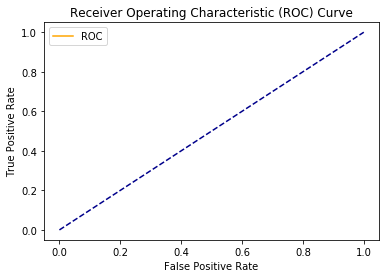

In [79]:
target_names = ['normal','probe']
print(classification_report(y_test_probe, Y_pred, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_probe, Y_pred))
print("Log Loss Score is ..:",log_loss(y_test_probe, Y_pred, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_probe, Y_pred, pos_label=2)
plot_roc_curve(fpr,tpr)

In [80]:
len(Y_pred[Y_pred == 1]), len(y_test_probe[y_test_probe == 1])

(2802, 2810)

In [81]:
cm = confusion_matrix(y_test_probe, Y_pred)
cm

array([[162520,      3],
       [    11,   2799]], dtype=int64)

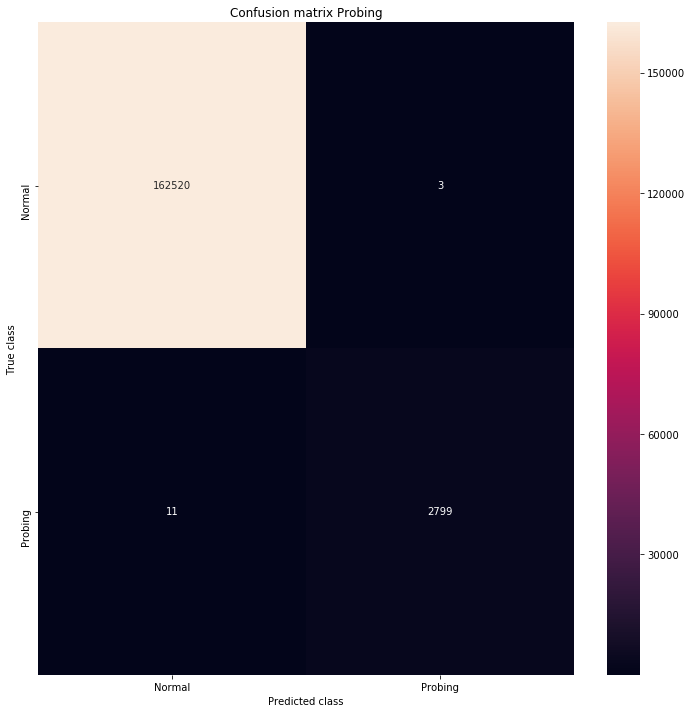

In [82]:
LABELS = ["Normal", "Probing"]
plt.figure(figsize=(12, 12))
sns.heatmap(cm, xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
plt.title("Confusion matrix Probing")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

In [60]:
from scipy.misc import derivative

In [61]:
## Focal Loss

def focal_loss_lgb(y_pred, dtrain, alpha, gamma):
	a,g = alpha, gamma
	y_true = dtrain.label
	def fl(x,t):
		p = 1/(1+np.exp(-x))
		return -( a*t + (1-a)*(1-t) ) * (( 1 - ( t*p + (1-t)*(1-p)) )**g) * ( t*np.log(p)+(1-t)*np.log(1-p) )
	partial_fl = lambda x: fl(x, y_true)
	grad = derivative(partial_fl, y_pred, n=1, dx=1e-6)
	hess = derivative(partial_fl, y_pred, n=2, dx=1e-6)
	return grad, hess

def focal_loss_lgb_eval_error(y_pred, dtrain, alpha, gamma):
	a,g = alpha, gamma
	y_true = dtrain.label
	p = 1/(1+np.exp(-y_pred))
	loss = -( a*y_true + (1-a)*(1-y_true) ) * (( 1 - ( y_true*p + (1-y_true)*(1-p)) )**g) * ( y_true*np.log(p)+(1-y_true)*np.log(1-p) )
	return 'focal_loss', np.mean(loss), False

focal_loss = lambda x,y: focal_loss_lgb(x, y, 0.25, 1.)
eval_error = lambda x,y: focal_loss_lgb_eval_error(x, y, 0.25, 1.)

def lgbm_bay_focal(
     min_child_samples,
     num_leaves,
     feature_fraction,
     bagging_fraction,
     bagging_freq,
     learning_rate,
     max_depth,
     max_bin) :
     
     num_leaves = int(num_leaves)
     max_depth = int(max_depth)
     min_child_samples= int(min_child_samples)
     bagging_freq= int(bagging_freq)

     parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'false',
    'min_child_samples': min_child_samples,
    'boosting': 'gbdt',#dart,gbdt
    'num_leaves': num_leaves,
    'feature_fraction': feature_fraction,
    'bagging_fraction': bagging_fraction,
    'bagging_freq': bagging_freq,
    'learning_rate': learning_rate,
    'verbose': 0,
    'max_depth': max_depth,
    'max_bin' : 350
    }
     evals_results = {}
     model_focal = lgb.train(parameters,
                       train_data,
                       valid_sets=[test_data],
                       evals_result=evals_results,
                       fobj=focal_loss,
                       feval=eval_error,
                       #valid_sets=test_data,
                       num_boost_round=1000,
											 verbose_eval=False,
                       early_stopping_rounds=100)
     return model_focal.best_score['valid_0']['auc']

In [62]:
## bayesian focal
 
bo_focal = BayesianOptimization(lgbm_bay_focal, params)
bo_focal.maximize(init_points = 5, n_iter = 5)

|   iter    |  target   | baggin... | baggin... | featur... | learni... |  max_bin  | max_depth | min_ch... | num_le... |
-------------------------------------------------------------------------------------------------------------------------
|  1        |  1.0      |  0.8049   |  22.14    |  0.7051   |  0.05861  |  366.0    |  7.872    |  67.62    |  50.06    |
|  2        |  1.0      |  0.7887   |  21.76    |  0.7449   |  0.0675   |  331.3    |  7.232    |  64.71    |  56.0     |
|  3        |  1.0      |  0.8287   |  24.56    |  0.7632   |  0.04484  |  375.4    |  7.921    |  61.09    |  52.73    |


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning:

divide by zero encountered in log

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning:

divide by zero encountered in log



|  4        |  1.0      |  0.7148   |  23.54    |  0.7086   |  0.05182  |  369.6    |  7.255    |  65.96    |  59.63    |
|  5        |  1.0      |  0.8034   |  20.24    |  0.7595   |  0.06219  |  335.8    |  7.558    |  60.17    |  59.01    |
|  6        |  1.0      |  0.8473   |  20.97    |  0.7729   |  0.04211  |  400.0    |  7.131    |  69.63    |  59.53    |
|  7        |  1.0      |  0.7407   |  24.96    |  0.7552   |  0.06674  |  325.1    |  7.093    |  69.41    |  50.01    |
|  8        |  1.0      |  0.7519   |  24.36    |  0.7624   |  0.0613   |  399.8    |  7.426    |  60.09    |  50.08    |
|  9        |  1.0      |  0.7923   |  24.88    |  0.7923   |  0.04801  |  325.0    |  7.91     |  60.2     |  59.99    |
|  10       |  1.0      |  0.7553   |  20.51    |  0.7138   |  0.05711  |  399.8    |  7.863    |  69.25    |  59.92    |


In [63]:
#'''
parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'min_child_samples': 50,
    'boosting': 'gbdt',#dart,gbdt
    'num_leaves': 70,
    'feature_fraction': 0.5,
    'bagging_fraction': 0.8,
    'bagging_freq': 10,
    'learning_rate': 0.05,
    'verbose': 0,
    'max_depth': 6,
    'max bin' : 350

    
}
#'''
#lgb.cv(param, train_data, num_round, nfold=5)

evals_results = {}

model_focal = lgb.train(parameters,
                       train_data,
                       valid_sets=[test_data],
                       evals_result=evals_results,
                       fobj=focal_loss,
                       feval=eval_error,
                       #valid_sets=test_data,
                       num_boost_round=1000,
                       early_stopping_rounds=100)



[1]	valid_0's auc: 0.828236	valid_0's focal_loss: 0.239875
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's auc: 0.963959	valid_0's focal_loss: 0.224071
[3]	valid_0's auc: 0.993469	valid_0's focal_loss: 0.209512
[4]	valid_0's auc: 0.993768	valid_0's focal_loss: 0.196145
[5]	valid_0's auc: 0.998523	valid_0's focal_loss: 0.183686
[6]	valid_0's auc: 0.999145	valid_0's focal_loss: 0.172265
[7]	valid_0's auc: 0.999418	valid_0's focal_loss: 0.161595
[8]	valid_0's auc: 0.999418	valid_0's focal_loss: 0.15171
[9]	valid_0's auc: 0.999503	valid_0's focal_loss: 0.142468
[10]	valid_0's auc: 0.99943	valid_0's focal_loss: 0.133968
[11]	valid_0's auc: 0.999442	valid_0's focal_loss: 0.125956
[12]	valid_0's auc: 0.999505	valid_0's focal_loss: 0.118496
[13]	valid_0's auc: 0.999479	valid_0's focal_loss: 0.111546
[14]	valid_0's auc: 0.999537	valid_0's focal_loss: 0.10502
[15]	valid_0's auc: 0.999863	valid_0's focal_loss: 0.0989168
[16]	valid_0's auc: 0.999853	valid_0's focal_los

[133]	valid_0's auc: 0.999996	valid_0's focal_loss: 0.00031289
[134]	valid_0's auc: 0.999996	valid_0's focal_loss: 0.00030188
[135]	valid_0's auc: 0.999996	valid_0's focal_loss: 0.000291823
[136]	valid_0's auc: 0.999996	valid_0's focal_loss: 0.000281841
[137]	valid_0's auc: 0.999996	valid_0's focal_loss: 0.000272302
[138]	valid_0's auc: 0.999996	valid_0's focal_loss: 0.000262663
[139]	valid_0's auc: 0.999996	valid_0's focal_loss: 0.000254145
[140]	valid_0's auc: 0.999996	valid_0's focal_loss: 0.000245784
[141]	valid_0's auc: 0.999996	valid_0's focal_loss: 0.000237961
[142]	valid_0's auc: 0.999996	valid_0's focal_loss: 0.000230599
[143]	valid_0's auc: 0.999996	valid_0's focal_loss: 0.000223554
[144]	valid_0's auc: 0.999996	valid_0's focal_loss: 0.000216308
[145]	valid_0's auc: 0.999996	valid_0's focal_loss: 0.000209537
[146]	valid_0's auc: 0.999996	valid_0's focal_loss: 0.000203274
[147]	valid_0's auc: 0.999996	valid_0's focal_loss: 0.000197253
[148]	valid_0's auc: 0.999996	valid_0's fo

[262]	valid_0's auc: 0.999997	valid_0's focal_loss: 7.38028e-05
[263]	valid_0's auc: 0.999996	valid_0's focal_loss: 7.39301e-05
[264]	valid_0's auc: 0.999996	valid_0's focal_loss: 7.38546e-05
[265]	valid_0's auc: 0.999996	valid_0's focal_loss: 7.38697e-05
[266]	valid_0's auc: 0.999996	valid_0's focal_loss: 7.38648e-05
[267]	valid_0's auc: 0.999996	valid_0's focal_loss: 7.37734e-05
[268]	valid_0's auc: 0.999996	valid_0's focal_loss: 7.3664e-05
[269]	valid_0's auc: 0.999996	valid_0's focal_loss: 7.38217e-05
[270]	valid_0's auc: 0.999996	valid_0's focal_loss: 7.38209e-05
[271]	valid_0's auc: 0.999996	valid_0's focal_loss: 7.36351e-05
[272]	valid_0's auc: 0.999996	valid_0's focal_loss: 7.38886e-05
[273]	valid_0's auc: 0.999996	valid_0's focal_loss: 7.37694e-05
[274]	valid_0's auc: 0.999996	valid_0's focal_loss: 7.41667e-05
[275]	valid_0's auc: 0.999996	valid_0's focal_loss: 7.41124e-05
[276]	valid_0's auc: 0.999996	valid_0's focal_loss: 7.42464e-05
[277]	valid_0's auc: 0.999996	valid_0's f

In [87]:
Y_pred_fc=model_focal.predict(X_test_probe, num_iteration=model_focal.best_iteration)

for i in range(0,len(Y_pred_fc)):
    if Y_pred_fc[i]>=.5:       # setting threshold to .5
       Y_pred_fc[i]=1
    else:  
       Y_pred_fc[i]=0

              precision    recall  f1-score   support

      normal        1.0       1.0       1.0    162523
       probe        1.0       1.0       1.0      2810

    accuracy                            1.0    165333
   macro avg        1.0       1.0       1.0    165333
weighted avg        1.0       1.0       1.0    165333


 ------------------------------------

ROC-AUC Score is ..: 0.9966161405942149
Log Loss Score is ..: 0.00417809104955338


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



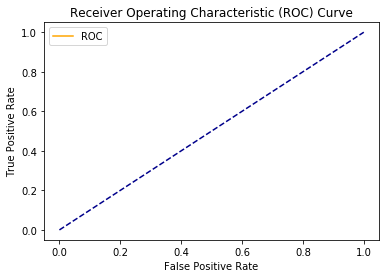

In [88]:
target_names = ['normal','probe']
print(classification_report(y_test_probe, Y_pred_fc, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_probe, Y_pred_fc))
print("Log Loss Score is ..:",log_loss(y_test_probe, Y_pred_fc, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_probe, Y_pred_fc, pos_label=2)
plot_roc_curve(fpr,tpr)

In [89]:
cm_fc = confusion_matrix(y_test_probe, Y_pred_fc)
cm_fc

array([[162522,      1],
       [    19,   2791]], dtype=int64)

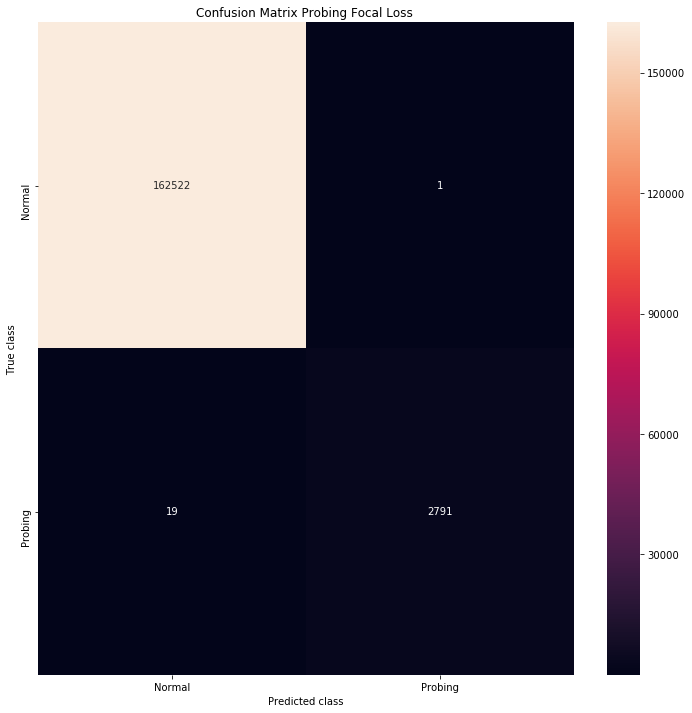

In [90]:
LABELS = ["Normal", "Probing"]
plt.figure(figsize=(12, 12))
sns.heatmap(cm_fc, xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
plt.title("Confusion Matrix Probing Focal Loss ")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

In [213]:
df_r2l = df_no_duplicate[(df_no_duplicate.classes == 'normal') | (df_no_duplicate.classes == 'R2L')]
df_r2l['classes'] = np.where(df_r2l['classes'] == 'normal', 0, 1)

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [214]:
df_nd_r2l  = df_r2l.copy()
y_nd_r2l = df_nd_r2l['classes']
df_nd_r2l = df_nd_r2l.drop('classes', 1)
X_train_r2l, X_test_r2l, y_train_r2l, y_test_r2l = train_test_split(df_nd_r2l , y_nd_r2l, test_size=0.2, random_state=42)

In [81]:
df_probe.iloc[:,0:40].columns.to_list()

['duration',
 'protocol_type',
 'service',
 'flag',
 'src_bytes',
 'dst_bytes',
 'land',
 'wrong_fragment',
 'urgent',
 'hot',
 'num_failed_logins',
 'logged_in',
 'num_compromised',
 'root_shell',
 'su_attempted',
 'num_root',
 'num_file_creations',
 'num_shells',
 'num_access_files',
 'is_host_login',
 'is_guest_login',
 'count',
 'srv_count',
 'serror_rate',
 'srv_serror_rate',
 'rerror_rate',
 'srv_rerror_rate',
 'same_srv_rate',
 'diff_srv_rate',
 'srv_diff_host_rate',
 'dst_host_count',
 'dst_host_srv_count',
 'dst_host_same_srv_rate',
 'dst_host_diff_srv_rate',
 'dst_host_same_src_port_rate',
 'dst_host_srv_diff_host_rate',
 'dst_host_serror_rate',
 'dst_host_srv_serror_rate',
 'dst_host_rerror_rate',
 'dst_host_srv_rerror_rate']

In [185]:
df_r2l.groupby('classes').count()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
classes,,,,,,,,,,,,,,,,,,,,,
0,812814,812814,812814,812814,812814,812814,812814,812814,812814,812814,...,812814,812814,812814,812814,812814,812814,812814,812814,812814,812814
1,13851,13851,13851,13851,13851,13851,13851,13851,13851,13851,...,13851,13851,13851,13851,13851,13851,13851,13851,13851,13851


In [194]:
a = (len(df_no_duplicate[(df_no_duplicate.classes == 'r2l')]) / len(df_no_duplicate[(df_no_duplicate.classes == 'normal')]))
print("Ratio is ..: {}%".format(round(100*a,2)))

Ratio is ..: 1.7%


In [218]:
train_data_r2l = lgb.Dataset(X_train_r2l, label=y_train_r2l, feature_name=df_r2l.iloc[:,0:40].columns.to_list())
test_data_r2l = lgb.Dataset(X_test_r2l, label=y_test_r2l)

In [219]:
parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'min_child_samples': 50,
    'boosting': 'gbdt',
    'num_leaves': 60,
    'feature_fraction': 0.5,
    'bagging_fraction': 0.5,
    'bagging_freq': 20,
    'learning_rate': 0.05,
    'verbose': 0,
    'max_depth': 6,
}

#lgb.cv(param, train_data, num_round, nfold=5)

evals_results_r2l = {}

model_r2l = lgb.train(parameters,
                       train_data,
                       valid_sets=[train_data_r2l, test_data_r2l],
                       evals_result=evals_results_r2l,
                       #valid_sets=test_data,
                       num_boost_round=1000,
                       early_stopping_rounds=100)

[1]	valid_0's auc: 0.99225	valid_1's auc: 0.99507
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's auc: 0.485435	valid_1's auc: 0.494
[3]	valid_0's auc: 0.964986	valid_1's auc: 0.959456
[4]	valid_0's auc: 0.706857	valid_1's auc: 0.690602
[5]	valid_0's auc: 0.969335	valid_1's auc: 0.965039
[6]	valid_0's auc: 0.970608	valid_1's auc: 0.965072
[7]	valid_0's auc: 0.979305	valid_1's auc: 0.96491
[8]	valid_0's auc: 0.986723	valid_1's auc: 0.974616
[9]	valid_0's auc: 0.985521	valid_1's auc: 0.97471
[10]	valid_0's auc: 0.985438	valid_1's auc: 0.974769
[11]	valid_0's auc: 0.986993	valid_1's auc: 0.973973
[12]	valid_0's auc: 0.961187	valid_1's auc: 0.960725
[13]	valid_0's auc: 0.975641	valid_1's auc: 0.970137
[14]	valid_0's auc: 0.989049	valid_1's auc: 0.979762
[15]	valid_0's auc: 0.989097	valid_1's auc: 0.979818
[16]	valid_0's auc: 0.994002	valid_1's auc: 0.984671
[17]	valid_0's auc: 0.994121	valid_1's auc: 0.984882
[18]	valid_0's auc: 0.991778	valid_1's auc: 0.985179

[155]	valid_0's auc: 0.998186	valid_1's auc: 0.9972
[156]	valid_0's auc: 0.998186	valid_1's auc: 0.9972
[157]	valid_0's auc: 0.998186	valid_1's auc: 0.9972
[158]	valid_0's auc: 0.998186	valid_1's auc: 0.9972
[159]	valid_0's auc: 0.998186	valid_1's auc: 0.9972
[160]	valid_0's auc: 0.998186	valid_1's auc: 0.9972
[161]	valid_0's auc: 0.998186	valid_1's auc: 0.9972
[162]	valid_0's auc: 0.998186	valid_1's auc: 0.9972
[163]	valid_0's auc: 0.998186	valid_1's auc: 0.9972
[164]	valid_0's auc: 0.998186	valid_1's auc: 0.9972
[165]	valid_0's auc: 0.998186	valid_1's auc: 0.9972
[166]	valid_0's auc: 0.998186	valid_1's auc: 0.9972
[167]	valid_0's auc: 0.998186	valid_1's auc: 0.9972
[168]	valid_0's auc: 0.998186	valid_1's auc: 0.9972
[169]	valid_0's auc: 0.998186	valid_1's auc: 0.9972
[170]	valid_0's auc: 0.998186	valid_1's auc: 0.9972
[171]	valid_0's auc: 0.998186	valid_1's auc: 0.9972
[172]	valid_0's auc: 0.998186	valid_1's auc: 0.9972
[173]	valid_0's auc: 0.998186	valid_1's auc: 0.9972
[174]	valid_

In [220]:
def lgbm_bay_r2l(
     min_child_samples,
     num_leaves,
     feature_fraction,
     bagging_fraction,
     bagging_freq,
     learning_rate,
     max_depth,
     max_bin) :
     
     num_leaves = int(num_leaves)
     max_depth = int(max_depth)
     min_child_samples= int(min_child_samples)
     bagging_freq= int(bagging_freq)

     parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'min_child_samples': min_child_samples,
    'boosting': 'dart',#dart,gbdt
    'num_leaves': num_leaves,
    'feature_fraction': feature_fraction,
    'bagging_fraction': bagging_fraction,
    'bagging_freq': bagging_freq,
    'learning_rate': learning_rate,
    'verbose': 0,
    'max_depth': max_depth,
    'max_bin' : 350
    }
     evals_results_r2l = {}
     model_r2l = lgb.train(parameters,
                       train_data,
                       valid_sets=[train_data_r2l, test_data_r2l],
                       evals_result=evals_results_r2l,
                       #valid_sets=test_data,
                       num_boost_round=1000,
                       early_stopping_rounds=100)
     return model.best_score['valid_0']['auc']

In [221]:
# opt r2l
bo_r2l = BayesianOptimization(lgbm_bay_r2l, params)
bo_r2l.maximize(init_points = 5, n_iter = 10)

|   iter    |  target   | baggin... | baggin... | featur... | learni... |  max_bin  | max_depth | min_ch... | num_le... |
-------------------------------------------------------------------------------------------------------------------------
[1]	valid_0's auc: 0.995178	valid_1's auc: 0.990362
[2]	valid_0's auc: 0.107323	valid_1's auc: 0.128114


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\lightgbm\callback.py:189: UserWarning:

Early stopping is not available in dart mode



[3]	valid_0's auc: 0.937032	valid_1's auc: 0.943476
[4]	valid_0's auc: 0.968735	valid_1's auc: 0.964293
[5]	valid_0's auc: 0.970423	valid_1's auc: 0.964316
[6]	valid_0's auc: 0.973996	valid_1's auc: 0.964502
[7]	valid_0's auc: 0.974069	valid_1's auc: 0.969008
[8]	valid_0's auc: 0.977488	valid_1's auc: 0.968986
[9]	valid_0's auc: 0.976378	valid_1's auc: 0.964484
[10]	valid_0's auc: 0.978623	valid_1's auc: 0.96899
[11]	valid_0's auc: 0.97651	valid_1's auc: 0.960166
[12]	valid_0's auc: 0.966973	valid_1's auc: 0.947378
[13]	valid_0's auc: 0.977639	valid_1's auc: 0.969201
[14]	valid_0's auc: 0.976681	valid_1's auc: 0.969397
[15]	valid_0's auc: 0.980017	valid_1's auc: 0.973675
[16]	valid_0's auc: 0.984485	valid_1's auc: 0.986754
[17]	valid_0's auc: 0.891599	valid_1's auc: 0.90178
[18]	valid_0's auc: 0.974816	valid_1's auc: 0.962859
[19]	valid_0's auc: 0.9762	valid_1's auc: 0.967594
[20]	valid_0's auc: 0.878153	valid_1's auc: 0.885678
[21]	valid_0's auc: 0.916138	valid_1's auc: 0.923882
[22]	

[158]	valid_0's auc: 0.93649	valid_1's auc: 0.939624
[159]	valid_0's auc: 0.93649	valid_1's auc: 0.939624
[160]	valid_0's auc: 0.93649	valid_1's auc: 0.939624
[161]	valid_0's auc: 0.93649	valid_1's auc: 0.939624
[162]	valid_0's auc: 0.93649	valid_1's auc: 0.939624
[163]	valid_0's auc: 0.93649	valid_1's auc: 0.939624
[164]	valid_0's auc: 0.93649	valid_1's auc: 0.939624
[165]	valid_0's auc: 0.93649	valid_1's auc: 0.939624
[166]	valid_0's auc: 0.93649	valid_1's auc: 0.939624
[167]	valid_0's auc: 0.93649	valid_1's auc: 0.939624
[168]	valid_0's auc: 0.93649	valid_1's auc: 0.939624
[169]	valid_0's auc: 0.935706	valid_1's auc: 0.938084
[170]	valid_0's auc: 0.935706	valid_1's auc: 0.938084
[171]	valid_0's auc: 0.935706	valid_1's auc: 0.938084
[172]	valid_0's auc: 0.935706	valid_1's auc: 0.938084
[173]	valid_0's auc: 0.935706	valid_1's auc: 0.938084
[174]	valid_0's auc: 0.935706	valid_1's auc: 0.938084
[175]	valid_0's auc: 0.935706	valid_1's auc: 0.938084
[176]	valid_0's auc: 0.935706	valid_1's

[312]	valid_0's auc: 0.91956	valid_1's auc: 0.909801
[313]	valid_0's auc: 0.91956	valid_1's auc: 0.909801
[314]	valid_0's auc: 0.91956	valid_1's auc: 0.909801
[315]	valid_0's auc: 0.91956	valid_1's auc: 0.909801
[316]	valid_0's auc: 0.91956	valid_1's auc: 0.909801
[317]	valid_0's auc: 0.953695	valid_1's auc: 0.951393
[318]	valid_0's auc: 0.953695	valid_1's auc: 0.951393
[319]	valid_0's auc: 0.953695	valid_1's auc: 0.951393
[320]	valid_0's auc: 0.953695	valid_1's auc: 0.951393
[321]	valid_0's auc: 0.953695	valid_1's auc: 0.951393
[322]	valid_0's auc: 0.953695	valid_1's auc: 0.951393
[323]	valid_0's auc: 0.953695	valid_1's auc: 0.951393
[324]	valid_0's auc: 0.953695	valid_1's auc: 0.951393
[325]	valid_0's auc: 0.953695	valid_1's auc: 0.951393
[326]	valid_0's auc: 0.953695	valid_1's auc: 0.951393
[327]	valid_0's auc: 0.953695	valid_1's auc: 0.951393
[328]	valid_0's auc: 0.953695	valid_1's auc: 0.951393
[329]	valid_0's auc: 0.953695	valid_1's auc: 0.951393
[330]	valid_0's auc: 0.953695	val

[465]	valid_0's auc: 0.989142	valid_1's auc: 0.98761
[466]	valid_0's auc: 0.989142	valid_1's auc: 0.98761
[467]	valid_0's auc: 0.989142	valid_1's auc: 0.98761
[468]	valid_0's auc: 0.989142	valid_1's auc: 0.98761
[469]	valid_0's auc: 0.989142	valid_1's auc: 0.98761
[470]	valid_0's auc: 0.989142	valid_1's auc: 0.98761
[471]	valid_0's auc: 0.989142	valid_1's auc: 0.98761
[472]	valid_0's auc: 0.989142	valid_1's auc: 0.98761
[473]	valid_0's auc: 0.989142	valid_1's auc: 0.98761
[474]	valid_0's auc: 0.989142	valid_1's auc: 0.98761
[475]	valid_0's auc: 0.989142	valid_1's auc: 0.98761
[476]	valid_0's auc: 0.989142	valid_1's auc: 0.98761
[477]	valid_0's auc: 0.989142	valid_1's auc: 0.98761
[478]	valid_0's auc: 0.989142	valid_1's auc: 0.98761
[479]	valid_0's auc: 0.989142	valid_1's auc: 0.98761
[480]	valid_0's auc: 0.989142	valid_1's auc: 0.98761
[481]	valid_0's auc: 0.989142	valid_1's auc: 0.98761
[482]	valid_0's auc: 0.989142	valid_1's auc: 0.98761
[483]	valid_0's auc: 0.989142	valid_1's auc: 0

[620]	valid_0's auc: 0.990224	valid_1's auc: 0.988362
[621]	valid_0's auc: 0.990224	valid_1's auc: 0.988362
[622]	valid_0's auc: 0.990224	valid_1's auc: 0.988362
[623]	valid_0's auc: 0.990224	valid_1's auc: 0.988362
[624]	valid_0's auc: 0.990224	valid_1's auc: 0.988362
[625]	valid_0's auc: 0.990224	valid_1's auc: 0.988362
[626]	valid_0's auc: 0.990224	valid_1's auc: 0.988362
[627]	valid_0's auc: 0.990224	valid_1's auc: 0.988362
[628]	valid_0's auc: 0.990224	valid_1's auc: 0.988362
[629]	valid_0's auc: 0.990224	valid_1's auc: 0.988362
[630]	valid_0's auc: 0.990224	valid_1's auc: 0.988362
[631]	valid_0's auc: 0.990224	valid_1's auc: 0.988362
[632]	valid_0's auc: 0.990224	valid_1's auc: 0.988362
[633]	valid_0's auc: 0.990224	valid_1's auc: 0.988362
[634]	valid_0's auc: 0.990224	valid_1's auc: 0.988362
[635]	valid_0's auc: 0.990224	valid_1's auc: 0.988362
[636]	valid_0's auc: 0.990224	valid_1's auc: 0.988362
[637]	valid_0's auc: 0.990224	valid_1's auc: 0.988362
[638]	valid_0's auc: 0.99022

[773]	valid_0's auc: 0.990858	valid_1's auc: 0.988691
[774]	valid_0's auc: 0.990858	valid_1's auc: 0.988691
[775]	valid_0's auc: 0.990858	valid_1's auc: 0.988691
[776]	valid_0's auc: 0.990858	valid_1's auc: 0.988691
[777]	valid_0's auc: 0.990858	valid_1's auc: 0.988691
[778]	valid_0's auc: 0.990858	valid_1's auc: 0.988691
[779]	valid_0's auc: 0.990858	valid_1's auc: 0.988691
[780]	valid_0's auc: 0.990858	valid_1's auc: 0.988691
[781]	valid_0's auc: 0.990858	valid_1's auc: 0.988691
[782]	valid_0's auc: 0.990858	valid_1's auc: 0.988691
[783]	valid_0's auc: 0.990858	valid_1's auc: 0.988691
[784]	valid_0's auc: 0.990858	valid_1's auc: 0.988691
[785]	valid_0's auc: 0.990858	valid_1's auc: 0.988691
[786]	valid_0's auc: 0.990858	valid_1's auc: 0.988691
[787]	valid_0's auc: 0.990858	valid_1's auc: 0.988691
[788]	valid_0's auc: 0.990858	valid_1's auc: 0.988691
[789]	valid_0's auc: 0.990858	valid_1's auc: 0.988691
[790]	valid_0's auc: 0.990858	valid_1's auc: 0.988691
[791]	valid_0's auc: 0.99085

[926]	valid_0's auc: 0.991205	valid_1's auc: 0.989009
[927]	valid_0's auc: 0.991205	valid_1's auc: 0.989009
[928]	valid_0's auc: 0.991205	valid_1's auc: 0.989009
[929]	valid_0's auc: 0.991205	valid_1's auc: 0.989009
[930]	valid_0's auc: 0.991205	valid_1's auc: 0.989009
[931]	valid_0's auc: 0.991205	valid_1's auc: 0.989009
[932]	valid_0's auc: 0.991205	valid_1's auc: 0.989009
[933]	valid_0's auc: 0.991205	valid_1's auc: 0.989009
[934]	valid_0's auc: 0.991205	valid_1's auc: 0.989009
[935]	valid_0's auc: 0.991205	valid_1's auc: 0.989009
[936]	valid_0's auc: 0.991205	valid_1's auc: 0.989009
[937]	valid_0's auc: 0.991205	valid_1's auc: 0.989009
[938]	valid_0's auc: 0.991205	valid_1's auc: 0.989009
[939]	valid_0's auc: 0.991205	valid_1's auc: 0.989009
[940]	valid_0's auc: 0.991205	valid_1's auc: 0.989009
[941]	valid_0's auc: 0.991205	valid_1's auc: 0.989009
[942]	valid_0's auc: 0.991205	valid_1's auc: 0.989009
[943]	valid_0's auc: 0.991205	valid_1's auc: 0.989009
[944]	valid_0's auc: 0.99120

[76]	valid_0's auc: 0.927197	valid_1's auc: 0.917745
[77]	valid_0's auc: 0.927197	valid_1's auc: 0.917745
[78]	valid_0's auc: 0.927197	valid_1's auc: 0.917745
[79]	valid_0's auc: 0.927197	valid_1's auc: 0.917745
[80]	valid_0's auc: 0.927197	valid_1's auc: 0.917745
[81]	valid_0's auc: 0.927197	valid_1's auc: 0.917745
[82]	valid_0's auc: 0.927197	valid_1's auc: 0.917745
[83]	valid_0's auc: 0.929439	valid_1's auc: 0.915213
[84]	valid_0's auc: 0.929439	valid_1's auc: 0.915213
[85]	valid_0's auc: 0.929439	valid_1's auc: 0.915213
[86]	valid_0's auc: 0.929439	valid_1's auc: 0.915213
[87]	valid_0's auc: 0.929439	valid_1's auc: 0.915213
[88]	valid_0's auc: 0.929439	valid_1's auc: 0.915213
[89]	valid_0's auc: 0.929439	valid_1's auc: 0.915213
[90]	valid_0's auc: 0.929439	valid_1's auc: 0.915213
[91]	valid_0's auc: 0.929439	valid_1's auc: 0.915213
[92]	valid_0's auc: 0.929439	valid_1's auc: 0.915213
[93]	valid_0's auc: 0.929439	valid_1's auc: 0.915213
[94]	valid_0's auc: 0.929439	valid_1's auc: 0.

[229]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[230]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[231]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[232]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[233]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[234]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[235]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[236]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[237]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[238]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[239]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[240]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[241]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[242]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[243]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[244]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[245]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[246]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[247]	valid_0's auc: 0.92080

[381]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[382]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[383]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[384]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[385]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[386]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[387]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[388]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[389]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[390]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[391]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[392]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[393]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[394]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[395]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[396]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[397]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[398]	valid_0's auc: 0.920803	valid_1's auc: 0.905277
[399]	valid_0's auc: 0.92080

[533]	valid_0's auc: 0.947627	valid_1's auc: 0.941278
[534]	valid_0's auc: 0.947627	valid_1's auc: 0.941278
[535]	valid_0's auc: 0.947627	valid_1's auc: 0.941278
[536]	valid_0's auc: 0.947627	valid_1's auc: 0.941278
[537]	valid_0's auc: 0.947627	valid_1's auc: 0.941278
[538]	valid_0's auc: 0.947627	valid_1's auc: 0.941278
[539]	valid_0's auc: 0.947627	valid_1's auc: 0.941278
[540]	valid_0's auc: 0.947627	valid_1's auc: 0.941278
[541]	valid_0's auc: 0.947627	valid_1's auc: 0.941278
[542]	valid_0's auc: 0.947627	valid_1's auc: 0.941278
[543]	valid_0's auc: 0.947627	valid_1's auc: 0.941278
[544]	valid_0's auc: 0.947627	valid_1's auc: 0.941278
[545]	valid_0's auc: 0.947627	valid_1's auc: 0.941278
[546]	valid_0's auc: 0.947627	valid_1's auc: 0.941278
[547]	valid_0's auc: 0.947627	valid_1's auc: 0.941278
[548]	valid_0's auc: 0.947627	valid_1's auc: 0.941278
[549]	valid_0's auc: 0.947627	valid_1's auc: 0.941278
[550]	valid_0's auc: 0.947627	valid_1's auc: 0.941278
[551]	valid_0's auc: 0.94762

[687]	valid_0's auc: 0.94754	valid_1's auc: 0.942547
[688]	valid_0's auc: 0.94754	valid_1's auc: 0.942547
[689]	valid_0's auc: 0.94754	valid_1's auc: 0.942547
[690]	valid_0's auc: 0.94754	valid_1's auc: 0.942547
[691]	valid_0's auc: 0.94754	valid_1's auc: 0.942547
[692]	valid_0's auc: 0.94754	valid_1's auc: 0.942547
[693]	valid_0's auc: 0.94754	valid_1's auc: 0.942547
[694]	valid_0's auc: 0.94754	valid_1's auc: 0.942547
[695]	valid_0's auc: 0.94754	valid_1's auc: 0.942547
[696]	valid_0's auc: 0.94754	valid_1's auc: 0.942547
[697]	valid_0's auc: 0.94754	valid_1's auc: 0.942547
[698]	valid_0's auc: 0.94754	valid_1's auc: 0.942547
[699]	valid_0's auc: 0.94754	valid_1's auc: 0.942547
[700]	valid_0's auc: 0.94754	valid_1's auc: 0.942547
[701]	valid_0's auc: 0.94754	valid_1's auc: 0.942547
[702]	valid_0's auc: 0.94754	valid_1's auc: 0.942547
[703]	valid_0's auc: 0.94754	valid_1's auc: 0.942547
[704]	valid_0's auc: 0.94754	valid_1's auc: 0.942547
[705]	valid_0's auc: 0.94754	valid_1's auc: 0.

[841]	valid_0's auc: 0.948841	valid_1's auc: 0.943647
[842]	valid_0's auc: 0.948841	valid_1's auc: 0.943647
[843]	valid_0's auc: 0.948841	valid_1's auc: 0.943647
[844]	valid_0's auc: 0.948841	valid_1's auc: 0.943647
[845]	valid_0's auc: 0.948841	valid_1's auc: 0.943647
[846]	valid_0's auc: 0.958523	valid_1's auc: 0.950252
[847]	valid_0's auc: 0.958523	valid_1's auc: 0.950252
[848]	valid_0's auc: 0.958523	valid_1's auc: 0.950252
[849]	valid_0's auc: 0.958523	valid_1's auc: 0.950252
[850]	valid_0's auc: 0.958523	valid_1's auc: 0.950252
[851]	valid_0's auc: 0.958523	valid_1's auc: 0.950252
[852]	valid_0's auc: 0.963516	valid_1's auc: 0.955028
[853]	valid_0's auc: 0.963516	valid_1's auc: 0.955028
[854]	valid_0's auc: 0.963516	valid_1's auc: 0.955028
[855]	valid_0's auc: 0.963516	valid_1's auc: 0.955028
[856]	valid_0's auc: 0.963516	valid_1's auc: 0.955028
[857]	valid_0's auc: 0.963516	valid_1's auc: 0.955028
[858]	valid_0's auc: 0.963516	valid_1's auc: 0.955028
[859]	valid_0's auc: 0.96351

[993]	valid_0's auc: 0.967414	valid_1's auc: 0.960123
[994]	valid_0's auc: 0.967414	valid_1's auc: 0.960123
[995]	valid_0's auc: 0.967414	valid_1's auc: 0.960123
[996]	valid_0's auc: 0.967414	valid_1's auc: 0.960123
[997]	valid_0's auc: 0.967414	valid_1's auc: 0.960123
[998]	valid_0's auc: 0.967414	valid_1's auc: 0.960123
[999]	valid_0's auc: 0.967414	valid_1's auc: 0.960123
[1000]	valid_0's auc: 0.967414	valid_1's auc: 0.960123
|  2        |  1.0      |  0.8047   |  21.28    |  0.7558   |  0.05944  |  379.3    |  7.003    |  63.58    |  57.31    |
[1]	valid_0's auc: 0.997768	valid_1's auc: 0.993357
[2]	valid_0's auc: 0.0583475	valid_1's auc: 0.0646434
[3]	valid_0's auc: 0.973382	valid_1's auc: 0.986
[4]	valid_0's auc: 0.977758	valid_1's auc: 0.99244
[5]	valid_0's auc: 0.982838	valid_1's auc: 0.990316
[6]	valid_0's auc: 0.986892	valid_1's auc: 0.986099
[7]	valid_0's auc: 0.991523	valid_1's auc: 0.990819
[8]	valid_0's auc: 0.984772	valid_1's auc: 0.986294
[9]	valid_0's auc: 0.983683	val

[144]	valid_0's auc: 0.986685	valid_1's auc: 0.990347
[145]	valid_0's auc: 0.986685	valid_1's auc: 0.990347
[146]	valid_0's auc: 0.986685	valid_1's auc: 0.990347
[147]	valid_0's auc: 0.986685	valid_1's auc: 0.990347
[148]	valid_0's auc: 0.986685	valid_1's auc: 0.990347
[149]	valid_0's auc: 0.986685	valid_1's auc: 0.990347
[150]	valid_0's auc: 0.986685	valid_1's auc: 0.990347
[151]	valid_0's auc: 0.986685	valid_1's auc: 0.990347
[152]	valid_0's auc: 0.986685	valid_1's auc: 0.990347
[153]	valid_0's auc: 0.986685	valid_1's auc: 0.990347
[154]	valid_0's auc: 0.986685	valid_1's auc: 0.990347
[155]	valid_0's auc: 0.986685	valid_1's auc: 0.990347
[156]	valid_0's auc: 0.986685	valid_1's auc: 0.990347
[157]	valid_0's auc: 0.986685	valid_1's auc: 0.990347
[158]	valid_0's auc: 0.986685	valid_1's auc: 0.990347
[159]	valid_0's auc: 0.986685	valid_1's auc: 0.990347
[160]	valid_0's auc: 0.986685	valid_1's auc: 0.990347
[161]	valid_0's auc: 0.986685	valid_1's auc: 0.990347
[162]	valid_0's auc: 0.98668

[298]	valid_0's auc: 0.977473	valid_1's auc: 0.981631
[299]	valid_0's auc: 0.977473	valid_1's auc: 0.981631
[300]	valid_0's auc: 0.977473	valid_1's auc: 0.981631
[301]	valid_0's auc: 0.977473	valid_1's auc: 0.981631
[302]	valid_0's auc: 0.977473	valid_1's auc: 0.981631
[303]	valid_0's auc: 0.977473	valid_1's auc: 0.981631
[304]	valid_0's auc: 0.977473	valid_1's auc: 0.981631
[305]	valid_0's auc: 0.977473	valid_1's auc: 0.981631
[306]	valid_0's auc: 0.977473	valid_1's auc: 0.981631
[307]	valid_0's auc: 0.977473	valid_1's auc: 0.981631
[308]	valid_0's auc: 0.977473	valid_1's auc: 0.981631
[309]	valid_0's auc: 0.977473	valid_1's auc: 0.981631
[310]	valid_0's auc: 0.977473	valid_1's auc: 0.981631
[311]	valid_0's auc: 0.977473	valid_1's auc: 0.981631
[312]	valid_0's auc: 0.977473	valid_1's auc: 0.981631
[313]	valid_0's auc: 0.977495	valid_1's auc: 0.981842
[314]	valid_0's auc: 0.977495	valid_1's auc: 0.981842
[315]	valid_0's auc: 0.977495	valid_1's auc: 0.981842
[316]	valid_0's auc: 0.97749

[451]	valid_0's auc: 0.975838	valid_1's auc: 0.979563
[452]	valid_0's auc: 0.975838	valid_1's auc: 0.979563
[453]	valid_0's auc: 0.975838	valid_1's auc: 0.979563
[454]	valid_0's auc: 0.975838	valid_1's auc: 0.979563
[455]	valid_0's auc: 0.975838	valid_1's auc: 0.979563
[456]	valid_0's auc: 0.975838	valid_1's auc: 0.979563
[457]	valid_0's auc: 0.975838	valid_1's auc: 0.979563
[458]	valid_0's auc: 0.975838	valid_1's auc: 0.979563
[459]	valid_0's auc: 0.975838	valid_1's auc: 0.979563
[460]	valid_0's auc: 0.975838	valid_1's auc: 0.979563
[461]	valid_0's auc: 0.975838	valid_1's auc: 0.979563
[462]	valid_0's auc: 0.975838	valid_1's auc: 0.979563
[463]	valid_0's auc: 0.975838	valid_1's auc: 0.979563
[464]	valid_0's auc: 0.975838	valid_1's auc: 0.979563
[465]	valid_0's auc: 0.975838	valid_1's auc: 0.979563
[466]	valid_0's auc: 0.975838	valid_1's auc: 0.979563
[467]	valid_0's auc: 0.975838	valid_1's auc: 0.979563
[468]	valid_0's auc: 0.975838	valid_1's auc: 0.979563
[469]	valid_0's auc: 0.97583

[603]	valid_0's auc: 0.980716	valid_1's auc: 0.983854
[604]	valid_0's auc: 0.980716	valid_1's auc: 0.983854
[605]	valid_0's auc: 0.980716	valid_1's auc: 0.983854
[606]	valid_0's auc: 0.980716	valid_1's auc: 0.983854
[607]	valid_0's auc: 0.980716	valid_1's auc: 0.983854
[608]	valid_0's auc: 0.980716	valid_1's auc: 0.983854
[609]	valid_0's auc: 0.980716	valid_1's auc: 0.983854
[610]	valid_0's auc: 0.980716	valid_1's auc: 0.983854
[611]	valid_0's auc: 0.980716	valid_1's auc: 0.983854
[612]	valid_0's auc: 0.980716	valid_1's auc: 0.983854
[613]	valid_0's auc: 0.980716	valid_1's auc: 0.983854
[614]	valid_0's auc: 0.980716	valid_1's auc: 0.983854
[615]	valid_0's auc: 0.980716	valid_1's auc: 0.983854
[616]	valid_0's auc: 0.980716	valid_1's auc: 0.983854
[617]	valid_0's auc: 0.980716	valid_1's auc: 0.983854
[618]	valid_0's auc: 0.980716	valid_1's auc: 0.983854
[619]	valid_0's auc: 0.980716	valid_1's auc: 0.983854
[620]	valid_0's auc: 0.980716	valid_1's auc: 0.983854
[621]	valid_0's auc: 0.98071

[756]	valid_0's auc: 0.979361	valid_1's auc: 0.982694
[757]	valid_0's auc: 0.979361	valid_1's auc: 0.982694
[758]	valid_0's auc: 0.979351	valid_1's auc: 0.982687
[759]	valid_0's auc: 0.979351	valid_1's auc: 0.982687
[760]	valid_0's auc: 0.979351	valid_1's auc: 0.982687
[761]	valid_0's auc: 0.979351	valid_1's auc: 0.982687
[762]	valid_0's auc: 0.978006	valid_1's auc: 0.981307
[763]	valid_0's auc: 0.978006	valid_1's auc: 0.981307
[764]	valid_0's auc: 0.978006	valid_1's auc: 0.981307
[765]	valid_0's auc: 0.978006	valid_1's auc: 0.981307
[766]	valid_0's auc: 0.978006	valid_1's auc: 0.981307
[767]	valid_0's auc: 0.978006	valid_1's auc: 0.981307
[768]	valid_0's auc: 0.978055	valid_1's auc: 0.981326
[769]	valid_0's auc: 0.978055	valid_1's auc: 0.981326
[770]	valid_0's auc: 0.978046	valid_1's auc: 0.981513
[771]	valid_0's auc: 0.978046	valid_1's auc: 0.981513
[772]	valid_0's auc: 0.978046	valid_1's auc: 0.981513
[773]	valid_0's auc: 0.978046	valid_1's auc: 0.981513
[774]	valid_0's auc: 0.97804

[909]	valid_0's auc: 0.978284	valid_1's auc: 0.981716
[910]	valid_0's auc: 0.978284	valid_1's auc: 0.981716
[911]	valid_0's auc: 0.978284	valid_1's auc: 0.981716
[912]	valid_0's auc: 0.978503	valid_1's auc: 0.981903
[913]	valid_0's auc: 0.978503	valid_1's auc: 0.981903
[914]	valid_0's auc: 0.978503	valid_1's auc: 0.981903
[915]	valid_0's auc: 0.978503	valid_1's auc: 0.981903
[916]	valid_0's auc: 0.978503	valid_1's auc: 0.981903
[917]	valid_0's auc: 0.978503	valid_1's auc: 0.981903
[918]	valid_0's auc: 0.978503	valid_1's auc: 0.981903
[919]	valid_0's auc: 0.978503	valid_1's auc: 0.981903
[920]	valid_0's auc: 0.978503	valid_1's auc: 0.981903
[921]	valid_0's auc: 0.978503	valid_1's auc: 0.981903
[922]	valid_0's auc: 0.978503	valid_1's auc: 0.981903
[923]	valid_0's auc: 0.978503	valid_1's auc: 0.981903
[924]	valid_0's auc: 0.978503	valid_1's auc: 0.981903
[925]	valid_0's auc: 0.978503	valid_1's auc: 0.981903
[926]	valid_0's auc: 0.978503	valid_1's auc: 0.981903
[927]	valid_0's auc: 0.97850

[59]	valid_0's auc: 0.949153	valid_1's auc: 0.911887
[60]	valid_0's auc: 0.853284	valid_1's auc: 0.84449
[61]	valid_0's auc: 0.853284	valid_1's auc: 0.84449
[62]	valid_0's auc: 0.853284	valid_1's auc: 0.84449
[63]	valid_0's auc: 0.853284	valid_1's auc: 0.84449
[64]	valid_0's auc: 0.853284	valid_1's auc: 0.84449
[65]	valid_0's auc: 0.853284	valid_1's auc: 0.84449
[66]	valid_0's auc: 0.853284	valid_1's auc: 0.84449
[67]	valid_0's auc: 0.847221	valid_1's auc: 0.842614
[68]	valid_0's auc: 0.847221	valid_1's auc: 0.842614
[69]	valid_0's auc: 0.846102	valid_1's auc: 0.840482
[70]	valid_0's auc: 0.846102	valid_1's auc: 0.840482
[71]	valid_0's auc: 0.846102	valid_1's auc: 0.840482
[72]	valid_0's auc: 0.846102	valid_1's auc: 0.840482
[73]	valid_0's auc: 0.846102	valid_1's auc: 0.840482
[74]	valid_0's auc: 0.846102	valid_1's auc: 0.840482
[75]	valid_0's auc: 0.846102	valid_1's auc: 0.840482
[76]	valid_0's auc: 0.846102	valid_1's auc: 0.840482
[77]	valid_0's auc: 0.846102	valid_1's auc: 0.840482


[213]	valid_0's auc: 0.869482	valid_1's auc: 0.855055
[214]	valid_0's auc: 0.838812	valid_1's auc: 0.828985
[215]	valid_0's auc: 0.838812	valid_1's auc: 0.828985
[216]	valid_0's auc: 0.838812	valid_1's auc: 0.828985
[217]	valid_0's auc: 0.763497	valid_1's auc: 0.76665
[218]	valid_0's auc: 0.763497	valid_1's auc: 0.76665
[219]	valid_0's auc: 0.763497	valid_1's auc: 0.76665
[220]	valid_0's auc: 0.763497	valid_1's auc: 0.76665
[221]	valid_0's auc: 0.763497	valid_1's auc: 0.76665
[222]	valid_0's auc: 0.763497	valid_1's auc: 0.76665
[223]	valid_0's auc: 0.763497	valid_1's auc: 0.76665
[224]	valid_0's auc: 0.763497	valid_1's auc: 0.76665
[225]	valid_0's auc: 0.763497	valid_1's auc: 0.76665
[226]	valid_0's auc: 0.763497	valid_1's auc: 0.76665
[227]	valid_0's auc: 0.763497	valid_1's auc: 0.76665
[228]	valid_0's auc: 0.763497	valid_1's auc: 0.76665
[229]	valid_0's auc: 0.763497	valid_1's auc: 0.76665
[230]	valid_0's auc: 0.763497	valid_1's auc: 0.76665
[231]	valid_0's auc: 0.763497	valid_1's au

[366]	valid_0's auc: 0.909747	valid_1's auc: 0.914857
[367]	valid_0's auc: 0.909747	valid_1's auc: 0.914857
[368]	valid_0's auc: 0.909747	valid_1's auc: 0.914857
[369]	valid_0's auc: 0.909747	valid_1's auc: 0.914857
[370]	valid_0's auc: 0.909747	valid_1's auc: 0.914857
[371]	valid_0's auc: 0.884942	valid_1's auc: 0.89849
[372]	valid_0's auc: 0.884942	valid_1's auc: 0.89849
[373]	valid_0's auc: 0.884942	valid_1's auc: 0.89849
[374]	valid_0's auc: 0.884942	valid_1's auc: 0.89849
[375]	valid_0's auc: 0.884942	valid_1's auc: 0.89849
[376]	valid_0's auc: 0.884942	valid_1's auc: 0.89849
[377]	valid_0's auc: 0.884942	valid_1's auc: 0.89849
[378]	valid_0's auc: 0.884942	valid_1's auc: 0.89849
[379]	valid_0's auc: 0.884942	valid_1's auc: 0.89849
[380]	valid_0's auc: 0.884942	valid_1's auc: 0.89849
[381]	valid_0's auc: 0.884942	valid_1's auc: 0.89849
[382]	valid_0's auc: 0.884942	valid_1's auc: 0.89849
[383]	valid_0's auc: 0.884942	valid_1's auc: 0.89849
[384]	valid_0's auc: 0.884942	valid_1's a

[519]	valid_0's auc: 0.957122	valid_1's auc: 0.939359
[520]	valid_0's auc: 0.957122	valid_1's auc: 0.939359
[521]	valid_0's auc: 0.957122	valid_1's auc: 0.939359
[522]	valid_0's auc: 0.957122	valid_1's auc: 0.939359
[523]	valid_0's auc: 0.957122	valid_1's auc: 0.939359
[524]	valid_0's auc: 0.957122	valid_1's auc: 0.939359
[525]	valid_0's auc: 0.957122	valid_1's auc: 0.939359
[526]	valid_0's auc: 0.957122	valid_1's auc: 0.939359
[527]	valid_0's auc: 0.957122	valid_1's auc: 0.939359
[528]	valid_0's auc: 0.957122	valid_1's auc: 0.939359
[529]	valid_0's auc: 0.957122	valid_1's auc: 0.939359
[530]	valid_0's auc: 0.957122	valid_1's auc: 0.939359
[531]	valid_0's auc: 0.957122	valid_1's auc: 0.939359
[532]	valid_0's auc: 0.957122	valid_1's auc: 0.939359
[533]	valid_0's auc: 0.957122	valid_1's auc: 0.939359
[534]	valid_0's auc: 0.957122	valid_1's auc: 0.939359
[535]	valid_0's auc: 0.957122	valid_1's auc: 0.939359
[536]	valid_0's auc: 0.957122	valid_1's auc: 0.939359
[537]	valid_0's auc: 0.95712

[671]	valid_0's auc: 0.95832	valid_1's auc: 0.941652
[672]	valid_0's auc: 0.95832	valid_1's auc: 0.941652
[673]	valid_0's auc: 0.95832	valid_1's auc: 0.941652
[674]	valid_0's auc: 0.95832	valid_1's auc: 0.941652
[675]	valid_0's auc: 0.95832	valid_1's auc: 0.941652
[676]	valid_0's auc: 0.95832	valid_1's auc: 0.941652
[677]	valid_0's auc: 0.95832	valid_1's auc: 0.941652
[678]	valid_0's auc: 0.95832	valid_1's auc: 0.941652
[679]	valid_0's auc: 0.95832	valid_1's auc: 0.941652
[680]	valid_0's auc: 0.95832	valid_1's auc: 0.941652
[681]	valid_0's auc: 0.95832	valid_1's auc: 0.941652
[682]	valid_0's auc: 0.95832	valid_1's auc: 0.941652
[683]	valid_0's auc: 0.95832	valid_1's auc: 0.941652
[684]	valid_0's auc: 0.95832	valid_1's auc: 0.941652
[685]	valid_0's auc: 0.95832	valid_1's auc: 0.941652
[686]	valid_0's auc: 0.95832	valid_1's auc: 0.941652
[687]	valid_0's auc: 0.95832	valid_1's auc: 0.941652
[688]	valid_0's auc: 0.95832	valid_1's auc: 0.941652
[689]	valid_0's auc: 0.95832	valid_1's auc: 0.

[824]	valid_0's auc: 0.960172	valid_1's auc: 0.944084
[825]	valid_0's auc: 0.960172	valid_1's auc: 0.944084
[826]	valid_0's auc: 0.960172	valid_1's auc: 0.944084
[827]	valid_0's auc: 0.960172	valid_1's auc: 0.944084
[828]	valid_0's auc: 0.960172	valid_1's auc: 0.944084
[829]	valid_0's auc: 0.960172	valid_1's auc: 0.944084
[830]	valid_0's auc: 0.960172	valid_1's auc: 0.944084
[831]	valid_0's auc: 0.960172	valid_1's auc: 0.944084
[832]	valid_0's auc: 0.960172	valid_1's auc: 0.944084
[833]	valid_0's auc: 0.960172	valid_1's auc: 0.944084
[834]	valid_0's auc: 0.960172	valid_1's auc: 0.944084
[835]	valid_0's auc: 0.960172	valid_1's auc: 0.944084
[836]	valid_0's auc: 0.960172	valid_1's auc: 0.944084
[837]	valid_0's auc: 0.960172	valid_1's auc: 0.944084
[838]	valid_0's auc: 0.960172	valid_1's auc: 0.944084
[839]	valid_0's auc: 0.960172	valid_1's auc: 0.944084
[840]	valid_0's auc: 0.960172	valid_1's auc: 0.944084
[841]	valid_0's auc: 0.960172	valid_1's auc: 0.944084
[842]	valid_0's auc: 0.96017

[976]	valid_0's auc: 0.959685	valid_1's auc: 0.94394
[977]	valid_0's auc: 0.959685	valid_1's auc: 0.94394
[978]	valid_0's auc: 0.959685	valid_1's auc: 0.94394
[979]	valid_0's auc: 0.959685	valid_1's auc: 0.94394
[980]	valid_0's auc: 0.959685	valid_1's auc: 0.94394
[981]	valid_0's auc: 0.959685	valid_1's auc: 0.94394
[982]	valid_0's auc: 0.959685	valid_1's auc: 0.94394
[983]	valid_0's auc: 0.959685	valid_1's auc: 0.94394
[984]	valid_0's auc: 0.959685	valid_1's auc: 0.94394
[985]	valid_0's auc: 0.959685	valid_1's auc: 0.94394
[986]	valid_0's auc: 0.959685	valid_1's auc: 0.94394
[987]	valid_0's auc: 0.959685	valid_1's auc: 0.94394
[988]	valid_0's auc: 0.959685	valid_1's auc: 0.94394
[989]	valid_0's auc: 0.959685	valid_1's auc: 0.94394
[990]	valid_0's auc: 0.959685	valid_1's auc: 0.94394
[991]	valid_0's auc: 0.959685	valid_1's auc: 0.94394
[992]	valid_0's auc: 0.959685	valid_1's auc: 0.94394
[993]	valid_0's auc: 0.959685	valid_1's auc: 0.94394
[994]	valid_0's auc: 0.959685	valid_1's auc: 0

[128]	valid_0's auc: 0.839831	valid_1's auc: 0.835119
[129]	valid_0's auc: 0.839831	valid_1's auc: 0.835119
[130]	valid_0's auc: 0.839831	valid_1's auc: 0.835119
[131]	valid_0's auc: 0.839831	valid_1's auc: 0.835119
[132]	valid_0's auc: 0.839831	valid_1's auc: 0.835119
[133]	valid_0's auc: 0.839831	valid_1's auc: 0.835119
[134]	valid_0's auc: 0.839831	valid_1's auc: 0.835119
[135]	valid_0's auc: 0.839831	valid_1's auc: 0.835119
[136]	valid_0's auc: 0.839831	valid_1's auc: 0.835119
[137]	valid_0's auc: 0.839831	valid_1's auc: 0.835119
[138]	valid_0's auc: 0.83843	valid_1's auc: 0.830378
[139]	valid_0's auc: 0.83843	valid_1's auc: 0.830378
[140]	valid_0's auc: 0.83843	valid_1's auc: 0.830378
[141]	valid_0's auc: 0.83843	valid_1's auc: 0.830378
[142]	valid_0's auc: 0.83843	valid_1's auc: 0.830378
[143]	valid_0's auc: 0.83843	valid_1's auc: 0.830378
[144]	valid_0's auc: 0.83843	valid_1's auc: 0.830378
[145]	valid_0's auc: 0.83843	valid_1's auc: 0.830378
[146]	valid_0's auc: 0.83843	valid_1

[281]	valid_0's auc: 0.926435	valid_1's auc: 0.929485
[282]	valid_0's auc: 0.926435	valid_1's auc: 0.929485
[283]	valid_0's auc: 0.926435	valid_1's auc: 0.929485
[284]	valid_0's auc: 0.923081	valid_1's auc: 0.925544
[285]	valid_0's auc: 0.923081	valid_1's auc: 0.925544
[286]	valid_0's auc: 0.923081	valid_1's auc: 0.925544
[287]	valid_0's auc: 0.923081	valid_1's auc: 0.925544
[288]	valid_0's auc: 0.923081	valid_1's auc: 0.925544
[289]	valid_0's auc: 0.923081	valid_1's auc: 0.925544
[290]	valid_0's auc: 0.923081	valid_1's auc: 0.925544
[291]	valid_0's auc: 0.923081	valid_1's auc: 0.925544
[292]	valid_0's auc: 0.923081	valid_1's auc: 0.925544
[293]	valid_0's auc: 0.923081	valid_1's auc: 0.925544
[294]	valid_0's auc: 0.923081	valid_1's auc: 0.925544
[295]	valid_0's auc: 0.923081	valid_1's auc: 0.925544
[296]	valid_0's auc: 0.923081	valid_1's auc: 0.925544
[297]	valid_0's auc: 0.923081	valid_1's auc: 0.925544
[298]	valid_0's auc: 0.923081	valid_1's auc: 0.925544
[299]	valid_0's auc: 0.92308

[434]	valid_0's auc: 0.840757	valid_1's auc: 0.848372
[435]	valid_0's auc: 0.840757	valid_1's auc: 0.848372
[436]	valid_0's auc: 0.840757	valid_1's auc: 0.848372
[437]	valid_0's auc: 0.840757	valid_1's auc: 0.848372
[438]	valid_0's auc: 0.840757	valid_1's auc: 0.848372
[439]	valid_0's auc: 0.840757	valid_1's auc: 0.848372
[440]	valid_0's auc: 0.840757	valid_1's auc: 0.848372
[441]	valid_0's auc: 0.840757	valid_1's auc: 0.848372
[442]	valid_0's auc: 0.840757	valid_1's auc: 0.848372
[443]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[444]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[445]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[446]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[447]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[448]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[449]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[450]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[451]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[452]	valid_0's auc: 0.81913

[587]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[588]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[589]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[590]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[591]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[592]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[593]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[594]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[595]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[596]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[597]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[598]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[599]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[600]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[601]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[602]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[603]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[604]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[605]	valid_0's auc: 0.81913

[740]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[741]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[742]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[743]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[744]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[745]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[746]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[747]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[748]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[749]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[750]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[751]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[752]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[753]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[754]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[755]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[756]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[757]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[758]	valid_0's auc: 0.81913

[892]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[893]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[894]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[895]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[896]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[897]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[898]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[899]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[900]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[901]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[902]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[903]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[904]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[905]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[906]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[907]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[908]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[909]	valid_0's auc: 0.819134	valid_1's auc: 0.825448
[910]	valid_0's auc: 0.81913

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\lightgbm\callback.py:189: UserWarning:

Early stopping is not available in dart mode



[3]	valid_0's auc: 0.946065	valid_1's auc: 0.957493
[4]	valid_0's auc: 0.951265	valid_1's auc: 0.962869
[5]	valid_0's auc: 0.973456	valid_1's auc: 0.962859
[6]	valid_0's auc: 0.963566	valid_1's auc: 0.948388
[7]	valid_0's auc: 0.977326	valid_1's auc: 0.958989
[8]	valid_0's auc: 0.976061	valid_1's auc: 0.958978
[9]	valid_0's auc: 0.982119	valid_1's auc: 0.973161
[10]	valid_0's auc: 0.984368	valid_1's auc: 0.973334
[11]	valid_0's auc: 0.983257	valid_1's auc: 0.982879
[12]	valid_0's auc: 0.984708	valid_1's auc: 0.983043
[13]	valid_0's auc: 0.987139	valid_1's auc: 0.987887
[14]	valid_0's auc: 0.988787	valid_1's auc: 0.988285
[15]	valid_0's auc: 0.987626	valid_1's auc: 0.988384
[16]	valid_0's auc: 0.988849	valid_1's auc: 0.988276
[17]	valid_0's auc: 0.987646	valid_1's auc: 0.989003
[18]	valid_0's auc: 0.985256	valid_1's auc: 0.99447
[19]	valid_0's auc: 0.991878	valid_1's auc: 0.988631
[20]	valid_0's auc: 0.992076	valid_1's auc: 0.985696
[21]	valid_0's auc: 0.992518	valid_1's auc: 0.987589
[

[158]	valid_0's auc: 0.989559	valid_1's auc: 0.987324
[159]	valid_0's auc: 0.989716	valid_1's auc: 0.987575
[160]	valid_0's auc: 0.990086	valid_1's auc: 0.987867
[161]	valid_0's auc: 0.992437	valid_1's auc: 0.989866
[162]	valid_0's auc: 0.993175	valid_1's auc: 0.990488
[163]	valid_0's auc: 0.989692	valid_1's auc: 0.987732
[164]	valid_0's auc: 0.989703	valid_1's auc: 0.987884
[165]	valid_0's auc: 0.989653	valid_1's auc: 0.987954
[166]	valid_0's auc: 0.987864	valid_1's auc: 0.984164
[167]	valid_0's auc: 0.987868	valid_1's auc: 0.984174
[168]	valid_0's auc: 0.987869	valid_1's auc: 0.984172
[169]	valid_0's auc: 0.98673	valid_1's auc: 0.983106
[170]	valid_0's auc: 0.986384	valid_1's auc: 0.982543
[171]	valid_0's auc: 0.989156	valid_1's auc: 0.9842
[172]	valid_0's auc: 0.989774	valid_1's auc: 0.984919
[173]	valid_0's auc: 0.989595	valid_1's auc: 0.985093
[174]	valid_0's auc: 0.989595	valid_1's auc: 0.985093
[175]	valid_0's auc: 0.989595	valid_1's auc: 0.985093
[176]	valid_0's auc: 0.989595	v

[311]	valid_0's auc: 0.988843	valid_1's auc: 0.989574
[312]	valid_0's auc: 0.988843	valid_1's auc: 0.989574
[313]	valid_0's auc: 0.988843	valid_1's auc: 0.989574
[314]	valid_0's auc: 0.988843	valid_1's auc: 0.989574
[315]	valid_0's auc: 0.988843	valid_1's auc: 0.989574
[316]	valid_0's auc: 0.988843	valid_1's auc: 0.989574
[317]	valid_0's auc: 0.988843	valid_1's auc: 0.989574
[318]	valid_0's auc: 0.988843	valid_1's auc: 0.989574
[319]	valid_0's auc: 0.988843	valid_1's auc: 0.989574
[320]	valid_0's auc: 0.988843	valid_1's auc: 0.989574
[321]	valid_0's auc: 0.98812	valid_1's auc: 0.988966
[322]	valid_0's auc: 0.986831	valid_1's auc: 0.988655
[323]	valid_0's auc: 0.986831	valid_1's auc: 0.988655
[324]	valid_0's auc: 0.986831	valid_1's auc: 0.988655
[325]	valid_0's auc: 0.986831	valid_1's auc: 0.988655
[326]	valid_0's auc: 0.986831	valid_1's auc: 0.988655
[327]	valid_0's auc: 0.986831	valid_1's auc: 0.988655
[328]	valid_0's auc: 0.986831	valid_1's auc: 0.988655
[329]	valid_0's auc: 0.986831

[464]	valid_0's auc: 0.853954	valid_1's auc: 0.854448
[465]	valid_0's auc: 0.853954	valid_1's auc: 0.854448
[466]	valid_0's auc: 0.853954	valid_1's auc: 0.854448
[467]	valid_0's auc: 0.853954	valid_1's auc: 0.854448
[468]	valid_0's auc: 0.853954	valid_1's auc: 0.854448
[469]	valid_0's auc: 0.853954	valid_1's auc: 0.854448
[470]	valid_0's auc: 0.853954	valid_1's auc: 0.854448
[471]	valid_0's auc: 0.853954	valid_1's auc: 0.854448
[472]	valid_0's auc: 0.853954	valid_1's auc: 0.854448
[473]	valid_0's auc: 0.853954	valid_1's auc: 0.854448
[474]	valid_0's auc: 0.853954	valid_1's auc: 0.854448
[475]	valid_0's auc: 0.853954	valid_1's auc: 0.854448
[476]	valid_0's auc: 0.853954	valid_1's auc: 0.854448
[477]	valid_0's auc: 0.853954	valid_1's auc: 0.854448
[478]	valid_0's auc: 0.853954	valid_1's auc: 0.854448
[479]	valid_0's auc: 0.853954	valid_1's auc: 0.854448
[480]	valid_0's auc: 0.853954	valid_1's auc: 0.854448
[481]	valid_0's auc: 0.853954	valid_1's auc: 0.854448
[482]	valid_0's auc: 0.85395

[617]	valid_0's auc: 0.916708	valid_1's auc: 0.916115
[618]	valid_0's auc: 0.916708	valid_1's auc: 0.916115
[619]	valid_0's auc: 0.916708	valid_1's auc: 0.916115
[620]	valid_0's auc: 0.916708	valid_1's auc: 0.916115
[621]	valid_0's auc: 0.916708	valid_1's auc: 0.916115
[622]	valid_0's auc: 0.916708	valid_1's auc: 0.916115
[623]	valid_0's auc: 0.916708	valid_1's auc: 0.916115
[624]	valid_0's auc: 0.916708	valid_1's auc: 0.916115
[625]	valid_0's auc: 0.916708	valid_1's auc: 0.916115
[626]	valid_0's auc: 0.916708	valid_1's auc: 0.916115
[627]	valid_0's auc: 0.916708	valid_1's auc: 0.916115
[628]	valid_0's auc: 0.916708	valid_1's auc: 0.916115
[629]	valid_0's auc: 0.916708	valid_1's auc: 0.916115
[630]	valid_0's auc: 0.916708	valid_1's auc: 0.916115
[631]	valid_0's auc: 0.916708	valid_1's auc: 0.916115
[632]	valid_0's auc: 0.916708	valid_1's auc: 0.916115
[633]	valid_0's auc: 0.916708	valid_1's auc: 0.916115
[634]	valid_0's auc: 0.916708	valid_1's auc: 0.916115
[635]	valid_0's auc: 0.91670

[769]	valid_0's auc: 0.926082	valid_1's auc: 0.929079
[770]	valid_0's auc: 0.926082	valid_1's auc: 0.929079
[771]	valid_0's auc: 0.926082	valid_1's auc: 0.929079
[772]	valid_0's auc: 0.926082	valid_1's auc: 0.929079
[773]	valid_0's auc: 0.926082	valid_1's auc: 0.929079
[774]	valid_0's auc: 0.926082	valid_1's auc: 0.929079
[775]	valid_0's auc: 0.926082	valid_1's auc: 0.929079
[776]	valid_0's auc: 0.926082	valid_1's auc: 0.929079
[777]	valid_0's auc: 0.926082	valid_1's auc: 0.929079
[778]	valid_0's auc: 0.926082	valid_1's auc: 0.929079
[779]	valid_0's auc: 0.926082	valid_1's auc: 0.929079
[780]	valid_0's auc: 0.926082	valid_1's auc: 0.929079
[781]	valid_0's auc: 0.926082	valid_1's auc: 0.929079
[782]	valid_0's auc: 0.926082	valid_1's auc: 0.929079
[783]	valid_0's auc: 0.926082	valid_1's auc: 0.929079
[784]	valid_0's auc: 0.926082	valid_1's auc: 0.929079
[785]	valid_0's auc: 0.926082	valid_1's auc: 0.929079
[786]	valid_0's auc: 0.926082	valid_1's auc: 0.929079
[787]	valid_0's auc: 0.92608

[923]	valid_0's auc: 0.94231	valid_1's auc: 0.943404
[924]	valid_0's auc: 0.94231	valid_1's auc: 0.943404
[925]	valid_0's auc: 0.94231	valid_1's auc: 0.943404
[926]	valid_0's auc: 0.94231	valid_1's auc: 0.943404
[927]	valid_0's auc: 0.94231	valid_1's auc: 0.943404
[928]	valid_0's auc: 0.94231	valid_1's auc: 0.943404
[929]	valid_0's auc: 0.94231	valid_1's auc: 0.943404
[930]	valid_0's auc: 0.94231	valid_1's auc: 0.943404
[931]	valid_0's auc: 0.94231	valid_1's auc: 0.943404
[932]	valid_0's auc: 0.94231	valid_1's auc: 0.943404
[933]	valid_0's auc: 0.94231	valid_1's auc: 0.943404
[934]	valid_0's auc: 0.94231	valid_1's auc: 0.943404
[935]	valid_0's auc: 0.94231	valid_1's auc: 0.943404
[936]	valid_0's auc: 0.94231	valid_1's auc: 0.943404
[937]	valid_0's auc: 0.94231	valid_1's auc: 0.943404
[938]	valid_0's auc: 0.937325	valid_1's auc: 0.937985
[939]	valid_0's auc: 0.937325	valid_1's auc: 0.937985
[940]	valid_0's auc: 0.937325	valid_1's auc: 0.937985
[941]	valid_0's auc: 0.937325	valid_1's auc

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\lightgbm\callback.py:189: UserWarning:

Early stopping is not available in dart mode



[3]	valid_0's auc: 0.964543	valid_1's auc: 0.973229
[4]	valid_0's auc: 0.966224	valid_1's auc: 0.968629
[5]	valid_0's auc: 0.973805	valid_1's auc: 0.969015
[6]	valid_0's auc: 0.925445	valid_1's auc: 0.891977
[7]	valid_0's auc: 0.982052	valid_1's auc: 0.979013
[8]	valid_0's auc: 0.97642	valid_1's auc: 0.975186
[9]	valid_0's auc: 0.959616	valid_1's auc: 0.964959
[10]	valid_0's auc: 0.917533	valid_1's auc: 0.901696
[11]	valid_0's auc: 0.985566	valid_1's auc: 0.966792
[12]	valid_0's auc: 0.987102	valid_1's auc: 0.97101
[13]	valid_0's auc: 0.941203	valid_1's auc: 0.942892
[14]	valid_0's auc: 0.937852	valid_1's auc: 0.925752
[15]	valid_0's auc: 0.936265	valid_1's auc: 0.924053
[16]	valid_0's auc: 0.936265	valid_1's auc: 0.924053
[17]	valid_0's auc: 0.936265	valid_1's auc: 0.924053
[18]	valid_0's auc: 0.936265	valid_1's auc: 0.924053
[19]	valid_0's auc: 0.936265	valid_1's auc: 0.924053
[20]	valid_0's auc: 0.936265	valid_1's auc: 0.924053
[21]	valid_0's auc: 0.936265	valid_1's auc: 0.924053
[2

[159]	valid_0's auc: 0.914397	valid_1's auc: 0.902596
[160]	valid_0's auc: 0.914397	valid_1's auc: 0.902596
[161]	valid_0's auc: 0.914397	valid_1's auc: 0.902596
[162]	valid_0's auc: 0.914397	valid_1's auc: 0.902596
[163]	valid_0's auc: 0.914397	valid_1's auc: 0.902596
[164]	valid_0's auc: 0.914397	valid_1's auc: 0.902596
[165]	valid_0's auc: 0.914397	valid_1's auc: 0.902596
[166]	valid_0's auc: 0.914397	valid_1's auc: 0.902596
[167]	valid_0's auc: 0.914397	valid_1's auc: 0.902596
[168]	valid_0's auc: 0.914397	valid_1's auc: 0.902596
[169]	valid_0's auc: 0.914397	valid_1's auc: 0.902596
[170]	valid_0's auc: 0.914397	valid_1's auc: 0.902596
[171]	valid_0's auc: 0.914397	valid_1's auc: 0.902596
[172]	valid_0's auc: 0.914397	valid_1's auc: 0.902596
[173]	valid_0's auc: 0.914397	valid_1's auc: 0.902596
[174]	valid_0's auc: 0.914397	valid_1's auc: 0.902596
[175]	valid_0's auc: 0.914397	valid_1's auc: 0.902596
[176]	valid_0's auc: 0.914397	valid_1's auc: 0.902596
[177]	valid_0's auc: 0.91439

[312]	valid_0's auc: 0.925442	valid_1's auc: 0.910921
[313]	valid_0's auc: 0.925442	valid_1's auc: 0.910921
[314]	valid_0's auc: 0.925442	valid_1's auc: 0.910921
[315]	valid_0's auc: 0.925442	valid_1's auc: 0.910921
[316]	valid_0's auc: 0.925442	valid_1's auc: 0.910921
[317]	valid_0's auc: 0.925442	valid_1's auc: 0.910921
[318]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[319]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[320]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[321]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[322]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[323]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[324]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[325]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[326]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[327]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[328]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[329]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[330]	valid_0's auc: 0.97482

[465]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[466]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[467]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[468]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[469]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[470]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[471]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[472]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[473]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[474]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[475]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[476]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[477]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[478]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[479]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[480]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[481]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[482]	valid_0's auc: 0.974823	valid_1's auc: 0.972455
[483]	valid_0's auc: 0.97482

[617]	valid_0's auc: 0.975437	valid_1's auc: 0.971476
[618]	valid_0's auc: 0.975437	valid_1's auc: 0.971476
[619]	valid_0's auc: 0.975437	valid_1's auc: 0.971476
[620]	valid_0's auc: 0.975437	valid_1's auc: 0.971476
[621]	valid_0's auc: 0.975437	valid_1's auc: 0.971476
[622]	valid_0's auc: 0.975437	valid_1's auc: 0.971476
[623]	valid_0's auc: 0.975437	valid_1's auc: 0.971476
[624]	valid_0's auc: 0.975437	valid_1's auc: 0.971476
[625]	valid_0's auc: 0.975437	valid_1's auc: 0.971476
[626]	valid_0's auc: 0.975437	valid_1's auc: 0.971476
[627]	valid_0's auc: 0.975437	valid_1's auc: 0.971476
[628]	valid_0's auc: 0.975437	valid_1's auc: 0.971476
[629]	valid_0's auc: 0.975437	valid_1's auc: 0.971476
[630]	valid_0's auc: 0.975437	valid_1's auc: 0.971476
[631]	valid_0's auc: 0.975437	valid_1's auc: 0.971476
[632]	valid_0's auc: 0.975437	valid_1's auc: 0.971476
[633]	valid_0's auc: 0.975437	valid_1's auc: 0.971476
[634]	valid_0's auc: 0.975437	valid_1's auc: 0.971476
[635]	valid_0's auc: 0.97543

[770]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[771]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[772]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[773]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[774]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[775]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[776]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[777]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[778]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[779]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[780]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[781]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[782]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[783]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[784]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[785]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[786]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[787]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[788]	valid_0's auc: 0.97514

[922]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[923]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[924]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[925]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[926]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[927]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[928]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[929]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[930]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[931]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[932]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[933]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[934]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[935]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[936]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[937]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[938]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[939]	valid_0's auc: 0.975144	valid_1's auc: 0.971719
[940]	valid_0's auc: 0.97514

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\lightgbm\callback.py:189: UserWarning:

Early stopping is not available in dart mode



[3]	valid_0's auc: 0.942346	valid_1's auc: 0.949819
[4]	valid_0's auc: 0.951712	valid_1's auc: 0.953076
[5]	valid_0's auc: 0.977828	valid_1's auc: 0.967716
[6]	valid_0's auc: 0.970764	valid_1's auc: 0.958556
[7]	valid_0's auc: 0.982038	valid_1's auc: 0.982415
[8]	valid_0's auc: 0.98199	valid_1's auc: 0.982423
[9]	valid_0's auc: 0.980984	valid_1's auc: 0.982406
[10]	valid_0's auc: 0.98215	valid_1's auc: 0.982424
[11]	valid_0's auc: 0.985838	valid_1's auc: 0.991998
[12]	valid_0's auc: 0.985843	valid_1's auc: 0.991978
[13]	valid_0's auc: 0.985991	valid_1's auc: 0.991997
[14]	valid_0's auc: 0.986213	valid_1's auc: 0.987675
[15]	valid_0's auc: 0.985782	valid_1's auc: 0.987246
[16]	valid_0's auc: 0.975091	valid_1's auc: 0.973034
[17]	valid_0's auc: 0.98433	valid_1's auc: 0.977925
[18]	valid_0's auc: 0.984337	valid_1's auc: 0.977835
[19]	valid_0's auc: 0.985581	valid_1's auc: 0.977341
[20]	valid_0's auc: 0.977953	valid_1's auc: 0.976294
[21]	valid_0's auc: 0.977513	valid_1's auc: 0.978169
[22

[158]	valid_0's auc: 0.980459	valid_1's auc: 0.97456
[159]	valid_0's auc: 0.980459	valid_1's auc: 0.97456
[160]	valid_0's auc: 0.980459	valid_1's auc: 0.97456
[161]	valid_0's auc: 0.980459	valid_1's auc: 0.97456
[162]	valid_0's auc: 0.980459	valid_1's auc: 0.97456
[163]	valid_0's auc: 0.980459	valid_1's auc: 0.97456
[164]	valid_0's auc: 0.980459	valid_1's auc: 0.97456
[165]	valid_0's auc: 0.980459	valid_1's auc: 0.97456
[166]	valid_0's auc: 0.980459	valid_1's auc: 0.97456
[167]	valid_0's auc: 0.980459	valid_1's auc: 0.97456
[168]	valid_0's auc: 0.980459	valid_1's auc: 0.97456
[169]	valid_0's auc: 0.980459	valid_1's auc: 0.97456
[170]	valid_0's auc: 0.980459	valid_1's auc: 0.97456
[171]	valid_0's auc: 0.980459	valid_1's auc: 0.97456
[172]	valid_0's auc: 0.980459	valid_1's auc: 0.97456
[173]	valid_0's auc: 0.980459	valid_1's auc: 0.97456
[174]	valid_0's auc: 0.980459	valid_1's auc: 0.97456
[175]	valid_0's auc: 0.980459	valid_1's auc: 0.97456
[176]	valid_0's auc: 0.980459	valid_1's auc: 0

[312]	valid_0's auc: 0.982503	valid_1's auc: 0.976325
[313]	valid_0's auc: 0.982503	valid_1's auc: 0.976325
[314]	valid_0's auc: 0.982503	valid_1's auc: 0.976325
[315]	valid_0's auc: 0.982503	valid_1's auc: 0.976325
[316]	valid_0's auc: 0.982503	valid_1's auc: 0.976325
[317]	valid_0's auc: 0.982503	valid_1's auc: 0.976325
[318]	valid_0's auc: 0.982503	valid_1's auc: 0.976325
[319]	valid_0's auc: 0.982503	valid_1's auc: 0.976325
[320]	valid_0's auc: 0.982503	valid_1's auc: 0.976325
[321]	valid_0's auc: 0.982503	valid_1's auc: 0.976325
[322]	valid_0's auc: 0.982503	valid_1's auc: 0.976325
[323]	valid_0's auc: 0.982503	valid_1's auc: 0.976325
[324]	valid_0's auc: 0.982503	valid_1's auc: 0.976325
[325]	valid_0's auc: 0.982503	valid_1's auc: 0.976325
[326]	valid_0's auc: 0.982503	valid_1's auc: 0.976325
[327]	valid_0's auc: 0.982503	valid_1's auc: 0.976325
[328]	valid_0's auc: 0.982503	valid_1's auc: 0.976325
[329]	valid_0's auc: 0.982503	valid_1's auc: 0.976325
[330]	valid_0's auc: 0.98250

[465]	valid_0's auc: 0.98031	valid_1's auc: 0.972393
[466]	valid_0's auc: 0.98031	valid_1's auc: 0.972393
[467]	valid_0's auc: 0.98031	valid_1's auc: 0.972393
[468]	valid_0's auc: 0.98031	valid_1's auc: 0.972393
[469]	valid_0's auc: 0.98031	valid_1's auc: 0.972393
[470]	valid_0's auc: 0.98031	valid_1's auc: 0.972393
[471]	valid_0's auc: 0.98031	valid_1's auc: 0.972393
[472]	valid_0's auc: 0.98031	valid_1's auc: 0.972393
[473]	valid_0's auc: 0.98031	valid_1's auc: 0.972393
[474]	valid_0's auc: 0.98031	valid_1's auc: 0.972393
[475]	valid_0's auc: 0.98031	valid_1's auc: 0.972393
[476]	valid_0's auc: 0.98031	valid_1's auc: 0.972393
[477]	valid_0's auc: 0.98034	valid_1's auc: 0.972744
[478]	valid_0's auc: 0.98034	valid_1's auc: 0.972744
[479]	valid_0's auc: 0.98034	valid_1's auc: 0.972744
[480]	valid_0's auc: 0.98034	valid_1's auc: 0.972744
[481]	valid_0's auc: 0.98034	valid_1's auc: 0.972744
[482]	valid_0's auc: 0.98034	valid_1's auc: 0.972744
[483]	valid_0's auc: 0.98034	valid_1's auc: 0.

[623]	valid_0's auc: 0.976809	valid_1's auc: 0.968532
[624]	valid_0's auc: 0.976809	valid_1's auc: 0.968532
[625]	valid_0's auc: 0.976809	valid_1's auc: 0.968532
[626]	valid_0's auc: 0.976809	valid_1's auc: 0.968532
[627]	valid_0's auc: 0.976809	valid_1's auc: 0.968532
[628]	valid_0's auc: 0.976809	valid_1's auc: 0.968532
[629]	valid_0's auc: 0.976809	valid_1's auc: 0.968532
[630]	valid_0's auc: 0.976809	valid_1's auc: 0.968532
[631]	valid_0's auc: 0.976809	valid_1's auc: 0.968532
[632]	valid_0's auc: 0.976809	valid_1's auc: 0.968532
[633]	valid_0's auc: 0.976809	valid_1's auc: 0.968532
[634]	valid_0's auc: 0.976809	valid_1's auc: 0.968532
[635]	valid_0's auc: 0.976809	valid_1's auc: 0.968532
[636]	valid_0's auc: 0.976809	valid_1's auc: 0.968532
[637]	valid_0's auc: 0.976809	valid_1's auc: 0.968532
[638]	valid_0's auc: 0.976809	valid_1's auc: 0.968532
[639]	valid_0's auc: 0.976809	valid_1's auc: 0.968532
[640]	valid_0's auc: 0.976809	valid_1's auc: 0.968532
[641]	valid_0's auc: 0.97680

[776]	valid_0's auc: 0.978769	valid_1's auc: 0.97064
[777]	valid_0's auc: 0.978769	valid_1's auc: 0.97064
[778]	valid_0's auc: 0.978769	valid_1's auc: 0.97064
[779]	valid_0's auc: 0.978769	valid_1's auc: 0.97064
[780]	valid_0's auc: 0.978769	valid_1's auc: 0.97064
[781]	valid_0's auc: 0.978769	valid_1's auc: 0.97064
[782]	valid_0's auc: 0.978769	valid_1's auc: 0.97064
[783]	valid_0's auc: 0.978769	valid_1's auc: 0.97064
[784]	valid_0's auc: 0.978769	valid_1's auc: 0.97064
[785]	valid_0's auc: 0.978769	valid_1's auc: 0.97064
[786]	valid_0's auc: 0.978769	valid_1's auc: 0.97064
[787]	valid_0's auc: 0.978769	valid_1's auc: 0.97064
[788]	valid_0's auc: 0.977715	valid_1's auc: 0.969492
[789]	valid_0's auc: 0.977715	valid_1's auc: 0.969492
[790]	valid_0's auc: 0.977715	valid_1's auc: 0.969492
[791]	valid_0's auc: 0.977715	valid_1's auc: 0.969492
[792]	valid_0's auc: 0.977715	valid_1's auc: 0.969492
[793]	valid_0's auc: 0.977715	valid_1's auc: 0.969492
[794]	valid_0's auc: 0.977715	valid_1's 

[930]	valid_0's auc: 0.97869	valid_1's auc: 0.972582
[931]	valid_0's auc: 0.97869	valid_1's auc: 0.972582
[932]	valid_0's auc: 0.97869	valid_1's auc: 0.972582
[933]	valid_0's auc: 0.97869	valid_1's auc: 0.972582
[934]	valid_0's auc: 0.97869	valid_1's auc: 0.972582
[935]	valid_0's auc: 0.97869	valid_1's auc: 0.972582
[936]	valid_0's auc: 0.97869	valid_1's auc: 0.972582
[937]	valid_0's auc: 0.97869	valid_1's auc: 0.972582
[938]	valid_0's auc: 0.97869	valid_1's auc: 0.972582
[939]	valid_0's auc: 0.97869	valid_1's auc: 0.972582
[940]	valid_0's auc: 0.97869	valid_1's auc: 0.972582
[941]	valid_0's auc: 0.97869	valid_1's auc: 0.972582
[942]	valid_0's auc: 0.97869	valid_1's auc: 0.972582
[943]	valid_0's auc: 0.97869	valid_1's auc: 0.972582
[944]	valid_0's auc: 0.97869	valid_1's auc: 0.972582
[945]	valid_0's auc: 0.97869	valid_1's auc: 0.972582
[946]	valid_0's auc: 0.97869	valid_1's auc: 0.972582
[947]	valid_0's auc: 0.97869	valid_1's auc: 0.972582
[948]	valid_0's auc: 0.97869	valid_1's auc: 0.

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\lightgbm\callback.py:189: UserWarning:

Early stopping is not available in dart mode



[3]	valid_0's auc: 0.943342	valid_1's auc: 0.932756
[4]	valid_0's auc: 0.955283	valid_1's auc: 0.938467
[5]	valid_0's auc: 0.966885	valid_1's auc: 0.948551
[6]	valid_0's auc: 0.916497	valid_1's auc: 0.920321
[7]	valid_0's auc: 0.971106	valid_1's auc: 0.947717
[8]	valid_0's auc: 0.867953	valid_1's auc: 0.819402
[9]	valid_0's auc: 0.927052	valid_1's auc: 0.884811
[10]	valid_0's auc: 0.764951	valid_1's auc: 0.74933
[11]	valid_0's auc: 0.952407	valid_1's auc: 0.905757
[12]	valid_0's auc: 0.951158	valid_1's auc: 0.909465
[13]	valid_0's auc: 0.958852	valid_1's auc: 0.915096
[14]	valid_0's auc: 0.959341	valid_1's auc: 0.917732
[15]	valid_0's auc: 0.968509	valid_1's auc: 0.942914
[16]	valid_0's auc: 0.954025	valid_1's auc: 0.929605
[17]	valid_0's auc: 0.974062	valid_1's auc: 0.953482
[18]	valid_0's auc: 0.96822	valid_1's auc: 0.954152
[19]	valid_0's auc: 0.964732	valid_1's auc: 0.94882
[20]	valid_0's auc: 0.971973	valid_1's auc: 0.962107
[21]	valid_0's auc: 0.971799	valid_1's auc: 0.961823
[22

[159]	valid_0's auc: 0.975622	valid_1's auc: 0.975067
[160]	valid_0's auc: 0.975622	valid_1's auc: 0.975067
[161]	valid_0's auc: 0.975622	valid_1's auc: 0.975067
[162]	valid_0's auc: 0.975622	valid_1's auc: 0.975067
[163]	valid_0's auc: 0.975622	valid_1's auc: 0.975067
[164]	valid_0's auc: 0.975622	valid_1's auc: 0.975067
[165]	valid_0's auc: 0.975622	valid_1's auc: 0.975067
[166]	valid_0's auc: 0.975622	valid_1's auc: 0.975067
[167]	valid_0's auc: 0.975622	valid_1's auc: 0.975067
[168]	valid_0's auc: 0.975622	valid_1's auc: 0.975067
[169]	valid_0's auc: 0.975622	valid_1's auc: 0.975067
[170]	valid_0's auc: 0.975622	valid_1's auc: 0.975067
[171]	valid_0's auc: 0.975622	valid_1's auc: 0.975067
[172]	valid_0's auc: 0.975622	valid_1's auc: 0.975067
[173]	valid_0's auc: 0.975622	valid_1's auc: 0.975067
[174]	valid_0's auc: 0.975622	valid_1's auc: 0.975067
[175]	valid_0's auc: 0.975622	valid_1's auc: 0.975067
[176]	valid_0's auc: 0.975622	valid_1's auc: 0.975067
[177]	valid_0's auc: 0.97594

[312]	valid_0's auc: 0.982167	valid_1's auc: 0.981623
[313]	valid_0's auc: 0.982167	valid_1's auc: 0.981623
[314]	valid_0's auc: 0.982167	valid_1's auc: 0.981623
[315]	valid_0's auc: 0.982167	valid_1's auc: 0.981623
[316]	valid_0's auc: 0.982167	valid_1's auc: 0.981623
[317]	valid_0's auc: 0.982167	valid_1's auc: 0.981623
[318]	valid_0's auc: 0.982167	valid_1's auc: 0.981623
[319]	valid_0's auc: 0.982167	valid_1's auc: 0.981623
[320]	valid_0's auc: 0.982167	valid_1's auc: 0.981623
[321]	valid_0's auc: 0.982167	valid_1's auc: 0.981623
[322]	valid_0's auc: 0.982167	valid_1's auc: 0.981623
[323]	valid_0's auc: 0.982167	valid_1's auc: 0.981623
[324]	valid_0's auc: 0.982167	valid_1's auc: 0.981623
[325]	valid_0's auc: 0.982167	valid_1's auc: 0.981623
[326]	valid_0's auc: 0.982167	valid_1's auc: 0.981623
[327]	valid_0's auc: 0.982167	valid_1's auc: 0.981623
[328]	valid_0's auc: 0.982167	valid_1's auc: 0.981623
[329]	valid_0's auc: 0.982167	valid_1's auc: 0.981623
[330]	valid_0's auc: 0.98216

[464]	valid_0's auc: 0.982456	valid_1's auc: 0.979719
[465]	valid_0's auc: 0.982456	valid_1's auc: 0.979719
[466]	valid_0's auc: 0.982456	valid_1's auc: 0.979719
[467]	valid_0's auc: 0.982456	valid_1's auc: 0.979719
[468]	valid_0's auc: 0.982456	valid_1's auc: 0.979719
[469]	valid_0's auc: 0.982456	valid_1's auc: 0.979719
[470]	valid_0's auc: 0.982456	valid_1's auc: 0.979719
[471]	valid_0's auc: 0.982456	valid_1's auc: 0.979719
[472]	valid_0's auc: 0.982456	valid_1's auc: 0.979719
[473]	valid_0's auc: 0.982456	valid_1's auc: 0.979719
[474]	valid_0's auc: 0.982456	valid_1's auc: 0.979719
[475]	valid_0's auc: 0.982456	valid_1's auc: 0.979719
[476]	valid_0's auc: 0.982456	valid_1's auc: 0.979719
[477]	valid_0's auc: 0.982456	valid_1's auc: 0.979719
[478]	valid_0's auc: 0.982456	valid_1's auc: 0.979719
[479]	valid_0's auc: 0.98303	valid_1's auc: 0.98199
[480]	valid_0's auc: 0.98303	valid_1's auc: 0.98199
[481]	valid_0's auc: 0.98303	valid_1's auc: 0.98199
[482]	valid_0's auc: 0.98303	valid

[620]	valid_0's auc: 0.9852	valid_1's auc: 0.98348
[621]	valid_0's auc: 0.9852	valid_1's auc: 0.98348
[622]	valid_0's auc: 0.9852	valid_1's auc: 0.98348
[623]	valid_0's auc: 0.9852	valid_1's auc: 0.98348
[624]	valid_0's auc: 0.9852	valid_1's auc: 0.98348
[625]	valid_0's auc: 0.9852	valid_1's auc: 0.98348
[626]	valid_0's auc: 0.9852	valid_1's auc: 0.98348
[627]	valid_0's auc: 0.9852	valid_1's auc: 0.98348
[628]	valid_0's auc: 0.9852	valid_1's auc: 0.98348
[629]	valid_0's auc: 0.9852	valid_1's auc: 0.98348
[630]	valid_0's auc: 0.9852	valid_1's auc: 0.98348
[631]	valid_0's auc: 0.9852	valid_1's auc: 0.98348
[632]	valid_0's auc: 0.9852	valid_1's auc: 0.98348
[633]	valid_0's auc: 0.9852	valid_1's auc: 0.98348
[634]	valid_0's auc: 0.9852	valid_1's auc: 0.98348
[635]	valid_0's auc: 0.9852	valid_1's auc: 0.98348
[636]	valid_0's auc: 0.9852	valid_1's auc: 0.98348
[637]	valid_0's auc: 0.9852	valid_1's auc: 0.98348
[638]	valid_0's auc: 0.9852	valid_1's auc: 0.98348
[639]	valid_0's auc: 0.9852	val

[776]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[777]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[778]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[779]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[780]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[781]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[782]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[783]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[784]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[785]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[786]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[787]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[788]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[789]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[790]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[791]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[792]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[793]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[794]	valid_0's auc: 0.98509

[929]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[930]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[931]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[932]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[933]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[934]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[935]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[936]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[937]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[938]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[939]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[940]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[941]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[942]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[943]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[944]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[945]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[946]	valid_0's auc: 0.985097	valid_1's auc: 0.983605
[947]	valid_0's auc: 0.98509

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\lightgbm\callback.py:189: UserWarning:

Early stopping is not available in dart mode



[3]	valid_0's auc: 0.936129	valid_1's auc: 0.936343
[4]	valid_0's auc: 0.932899	valid_1's auc: 0.916179
[5]	valid_0's auc: 0.970481	valid_1's auc: 0.938112
[6]	valid_0's auc: 0.955747	valid_1's auc: 0.920264
[7]	valid_0's auc: 0.972758	valid_1's auc: 0.934916
[8]	valid_0's auc: 0.965017	valid_1's auc: 0.935546
[9]	valid_0's auc: 0.965175	valid_1's auc: 0.950874
[10]	valid_0's auc: 0.961408	valid_1's auc: 0.962128
[11]	valid_0's auc: 0.954171	valid_1's auc: 0.93793
[12]	valid_0's auc: 0.968113	valid_1's auc: 0.960296
[13]	valid_0's auc: 0.95555	valid_1's auc: 0.933227
[14]	valid_0's auc: 0.930475	valid_1's auc: 0.927912
[15]	valid_0's auc: 0.968745	valid_1's auc: 0.967322
[16]	valid_0's auc: 0.97039	valid_1's auc: 0.971724
[17]	valid_0's auc: 0.853657	valid_1's auc: 0.847501
[18]	valid_0's auc: 0.855839	valid_1's auc: 0.850311
[19]	valid_0's auc: 0.978893	valid_1's auc: 0.977068
[20]	valid_0's auc: 0.978979	valid_1's auc: 0.977161
[21]	valid_0's auc: 0.978767	valid_1's auc: 0.976932
[22

[157]	valid_0's auc: 0.985918	valid_1's auc: 0.984002
[158]	valid_0's auc: 0.985953	valid_1's auc: 0.984101
[159]	valid_0's auc: 0.985733	valid_1's auc: 0.984041
[160]	valid_0's auc: 0.985733	valid_1's auc: 0.984041
[161]	valid_0's auc: 0.985733	valid_1's auc: 0.984041
[162]	valid_0's auc: 0.985733	valid_1's auc: 0.984041
[163]	valid_0's auc: 0.985733	valid_1's auc: 0.984041
[164]	valid_0's auc: 0.985733	valid_1's auc: 0.984041
[165]	valid_0's auc: 0.985733	valid_1's auc: 0.984041
[166]	valid_0's auc: 0.985733	valid_1's auc: 0.984041
[167]	valid_0's auc: 0.985733	valid_1's auc: 0.984041
[168]	valid_0's auc: 0.985733	valid_1's auc: 0.984041
[169]	valid_0's auc: 0.985733	valid_1's auc: 0.984041
[170]	valid_0's auc: 0.985733	valid_1's auc: 0.984041
[171]	valid_0's auc: 0.985733	valid_1's auc: 0.984041
[172]	valid_0's auc: 0.985733	valid_1's auc: 0.984041
[173]	valid_0's auc: 0.985733	valid_1's auc: 0.984041
[174]	valid_0's auc: 0.985732	valid_1's auc: 0.984112
[175]	valid_0's auc: 0.98577

[309]	valid_0's auc: 0.986279	valid_1's auc: 0.984424
[310]	valid_0's auc: 0.986279	valid_1's auc: 0.984424
[311]	valid_0's auc: 0.986279	valid_1's auc: 0.984424
[312]	valid_0's auc: 0.986355	valid_1's auc: 0.984571
[313]	valid_0's auc: 0.986355	valid_1's auc: 0.984571
[314]	valid_0's auc: 0.986355	valid_1's auc: 0.984571
[315]	valid_0's auc: 0.986355	valid_1's auc: 0.984571
[316]	valid_0's auc: 0.986355	valid_1's auc: 0.984571
[317]	valid_0's auc: 0.986355	valid_1's auc: 0.984571
[318]	valid_0's auc: 0.986355	valid_1's auc: 0.984571
[319]	valid_0's auc: 0.986355	valid_1's auc: 0.984571
[320]	valid_0's auc: 0.986355	valid_1's auc: 0.984571
[321]	valid_0's auc: 0.986355	valid_1's auc: 0.984571
[322]	valid_0's auc: 0.986355	valid_1's auc: 0.984571
[323]	valid_0's auc: 0.986355	valid_1's auc: 0.984571
[324]	valid_0's auc: 0.986355	valid_1's auc: 0.984571
[325]	valid_0's auc: 0.986355	valid_1's auc: 0.984571
[326]	valid_0's auc: 0.986913	valid_1's auc: 0.984967
[327]	valid_0's auc: 0.98691

[462]	valid_0's auc: 0.986739	valid_1's auc: 0.985121
[463]	valid_0's auc: 0.986739	valid_1's auc: 0.985121
[464]	valid_0's auc: 0.986739	valid_1's auc: 0.985121
[465]	valid_0's auc: 0.986739	valid_1's auc: 0.985121
[466]	valid_0's auc: 0.986739	valid_1's auc: 0.985121
[467]	valid_0's auc: 0.986739	valid_1's auc: 0.985121
[468]	valid_0's auc: 0.986739	valid_1's auc: 0.985121
[469]	valid_0's auc: 0.986739	valid_1's auc: 0.985121
[470]	valid_0's auc: 0.986739	valid_1's auc: 0.985121
[471]	valid_0's auc: 0.986739	valid_1's auc: 0.985121
[472]	valid_0's auc: 0.986739	valid_1's auc: 0.985121
[473]	valid_0's auc: 0.986739	valid_1's auc: 0.985121
[474]	valid_0's auc: 0.986739	valid_1's auc: 0.985121
[475]	valid_0's auc: 0.986739	valid_1's auc: 0.985121
[476]	valid_0's auc: 0.986739	valid_1's auc: 0.985121
[477]	valid_0's auc: 0.9868	valid_1's auc: 0.985252
[478]	valid_0's auc: 0.9868	valid_1's auc: 0.985252
[479]	valid_0's auc: 0.9868	valid_1's auc: 0.985252
[480]	valid_0's auc: 0.9868	valid_

[614]	valid_0's auc: 0.986969	valid_1's auc: 0.986244
[615]	valid_0's auc: 0.986969	valid_1's auc: 0.986244
[616]	valid_0's auc: 0.986969	valid_1's auc: 0.986244
[617]	valid_0's auc: 0.986969	valid_1's auc: 0.986244
[618]	valid_0's auc: 0.986969	valid_1's auc: 0.986244
[619]	valid_0's auc: 0.986969	valid_1's auc: 0.986244
[620]	valid_0's auc: 0.986969	valid_1's auc: 0.986244
[621]	valid_0's auc: 0.986981	valid_1's auc: 0.986212
[622]	valid_0's auc: 0.986981	valid_1's auc: 0.986212
[623]	valid_0's auc: 0.986981	valid_1's auc: 0.986212
[624]	valid_0's auc: 0.986981	valid_1's auc: 0.986212
[625]	valid_0's auc: 0.986981	valid_1's auc: 0.986212
[626]	valid_0's auc: 0.986981	valid_1's auc: 0.986212
[627]	valid_0's auc: 0.986981	valid_1's auc: 0.986212
[628]	valid_0's auc: 0.986981	valid_1's auc: 0.986212
[629]	valid_0's auc: 0.986981	valid_1's auc: 0.986212
[630]	valid_0's auc: 0.986981	valid_1's auc: 0.986212
[631]	valid_0's auc: 0.986981	valid_1's auc: 0.986212
[632]	valid_0's auc: 0.98698

[766]	valid_0's auc: 0.987093	valid_1's auc: 0.986287
[767]	valid_0's auc: 0.987093	valid_1's auc: 0.986287
[768]	valid_0's auc: 0.987093	valid_1's auc: 0.986287
[769]	valid_0's auc: 0.987093	valid_1's auc: 0.986287
[770]	valid_0's auc: 0.987093	valid_1's auc: 0.986287
[771]	valid_0's auc: 0.987093	valid_1's auc: 0.986287
[772]	valid_0's auc: 0.987093	valid_1's auc: 0.986287
[773]	valid_0's auc: 0.987093	valid_1's auc: 0.986287
[774]	valid_0's auc: 0.987093	valid_1's auc: 0.986287
[775]	valid_0's auc: 0.987093	valid_1's auc: 0.986287
[776]	valid_0's auc: 0.987093	valid_1's auc: 0.986287
[777]	valid_0's auc: 0.987093	valid_1's auc: 0.986287
[778]	valid_0's auc: 0.987093	valid_1's auc: 0.986287
[779]	valid_0's auc: 0.987093	valid_1's auc: 0.986287
[780]	valid_0's auc: 0.987093	valid_1's auc: 0.986287
[781]	valid_0's auc: 0.987093	valid_1's auc: 0.986287
[782]	valid_0's auc: 0.987093	valid_1's auc: 0.986287
[783]	valid_0's auc: 0.987093	valid_1's auc: 0.986287
[784]	valid_0's auc: 0.98709

[918]	valid_0's auc: 0.987183	valid_1's auc: 0.986301
[919]	valid_0's auc: 0.987183	valid_1's auc: 0.986301
[920]	valid_0's auc: 0.987183	valid_1's auc: 0.986301
[921]	valid_0's auc: 0.987183	valid_1's auc: 0.986301
[922]	valid_0's auc: 0.987183	valid_1's auc: 0.986301
[923]	valid_0's auc: 0.987183	valid_1's auc: 0.986301
[924]	valid_0's auc: 0.987183	valid_1's auc: 0.986301
[925]	valid_0's auc: 0.987183	valid_1's auc: 0.986301
[926]	valid_0's auc: 0.987183	valid_1's auc: 0.986301
[927]	valid_0's auc: 0.987183	valid_1's auc: 0.986301
[928]	valid_0's auc: 0.987183	valid_1's auc: 0.986301
[929]	valid_0's auc: 0.987183	valid_1's auc: 0.986301
[930]	valid_0's auc: 0.987183	valid_1's auc: 0.986301
[931]	valid_0's auc: 0.987183	valid_1's auc: 0.986301
[932]	valid_0's auc: 0.987183	valid_1's auc: 0.986301
[933]	valid_0's auc: 0.987183	valid_1's auc: 0.986301
[934]	valid_0's auc: 0.987183	valid_1's auc: 0.986301
[935]	valid_0's auc: 0.987183	valid_1's auc: 0.986301
[936]	valid_0's auc: 0.98718

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\lightgbm\callback.py:189: UserWarning:

Early stopping is not available in dart mode



[3]	valid_0's auc: 0.951287	valid_1's auc: 0.948565
[4]	valid_0's auc: 0.969483	valid_1's auc: 0.953736
[5]	valid_0's auc: 0.98134	valid_1's auc: 0.972245
[6]	valid_0's auc: 0.982534	valid_1's auc: 0.9767
[7]	valid_0's auc: 0.982549	valid_1's auc: 0.972105
[8]	valid_0's auc: 0.968329	valid_1's auc: 0.962845
[9]	valid_0's auc: 0.971881	valid_1's auc: 0.96471
[10]	valid_0's auc: 0.989215	valid_1's auc: 0.98145
[11]	valid_0's auc: 0.879171	valid_1's auc: 0.859313
[12]	valid_0's auc: 0.901306	valid_1's auc: 0.873834
[13]	valid_0's auc: 0.939765	valid_1's auc: 0.906149
[14]	valid_0's auc: 0.986922	valid_1's auc: 0.967283
[15]	valid_0's auc: 0.923681	valid_1's auc: 0.907303
[16]	valid_0's auc: 0.981603	valid_1's auc: 0.976805
[17]	valid_0's auc: 0.946964	valid_1's auc: 0.931071
[18]	valid_0's auc: 0.993676	valid_1's auc: 0.986209
[19]	valid_0's auc: 0.98801	valid_1's auc: 0.983386
[20]	valid_0's auc: 0.991701	valid_1's auc: 0.986957
[21]	valid_0's auc: 0.99087	valid_1's auc: 0.986542
[22]	va

[164]	valid_0's auc: 0.9539	valid_1's auc: 0.95386
[165]	valid_0's auc: 0.9539	valid_1's auc: 0.95386
[166]	valid_0's auc: 0.9539	valid_1's auc: 0.95386
[167]	valid_0's auc: 0.9539	valid_1's auc: 0.95386
[168]	valid_0's auc: 0.9539	valid_1's auc: 0.95386
[169]	valid_0's auc: 0.9539	valid_1's auc: 0.95386
[170]	valid_0's auc: 0.9539	valid_1's auc: 0.95386
[171]	valid_0's auc: 0.9539	valid_1's auc: 0.95386
[172]	valid_0's auc: 0.9539	valid_1's auc: 0.95386
[173]	valid_0's auc: 0.9539	valid_1's auc: 0.95386
[174]	valid_0's auc: 0.9539	valid_1's auc: 0.95386
[175]	valid_0's auc: 0.9539	valid_1's auc: 0.95386
[176]	valid_0's auc: 0.9539	valid_1's auc: 0.95386
[177]	valid_0's auc: 0.954802	valid_1's auc: 0.954735
[178]	valid_0's auc: 0.954802	valid_1's auc: 0.954735
[179]	valid_0's auc: 0.954802	valid_1's auc: 0.954735
[180]	valid_0's auc: 0.954802	valid_1's auc: 0.954735
[181]	valid_0's auc: 0.954802	valid_1's auc: 0.954735
[182]	valid_0's auc: 0.954802	valid_1's auc: 0.954735
[183]	valid_0

[318]	valid_0's auc: 0.948703	valid_1's auc: 0.944122
[319]	valid_0's auc: 0.948703	valid_1's auc: 0.944122
[320]	valid_0's auc: 0.948703	valid_1's auc: 0.944122
[321]	valid_0's auc: 0.948703	valid_1's auc: 0.944122
[322]	valid_0's auc: 0.948703	valid_1's auc: 0.944122
[323]	valid_0's auc: 0.948703	valid_1's auc: 0.944122
[324]	valid_0's auc: 0.948703	valid_1's auc: 0.944122
[325]	valid_0's auc: 0.948703	valid_1's auc: 0.944122
[326]	valid_0's auc: 0.948703	valid_1's auc: 0.944122
[327]	valid_0's auc: 0.948703	valid_1's auc: 0.944122
[328]	valid_0's auc: 0.948703	valid_1's auc: 0.944122
[329]	valid_0's auc: 0.948703	valid_1's auc: 0.944122
[330]	valid_0's auc: 0.948703	valid_1's auc: 0.944122
[331]	valid_0's auc: 0.948703	valid_1's auc: 0.944122
[332]	valid_0's auc: 0.948703	valid_1's auc: 0.944122
[333]	valid_0's auc: 0.948703	valid_1's auc: 0.944122
[334]	valid_0's auc: 0.948703	valid_1's auc: 0.944122
[335]	valid_0's auc: 0.948703	valid_1's auc: 0.944122
[336]	valid_0's auc: 0.94870

[470]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[471]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[472]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[473]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[474]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[475]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[476]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[477]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[478]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[479]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[480]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[481]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[482]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[483]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[484]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[485]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[486]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[487]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[488]	valid_0's auc: 0.93981

[623]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[624]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[625]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[626]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[627]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[628]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[629]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[630]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[631]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[632]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[633]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[634]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[635]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[636]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[637]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[638]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[639]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[640]	valid_0's auc: 0.939817	valid_1's auc: 0.937424
[641]	valid_0's auc: 0.93981

[777]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[778]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[779]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[780]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[781]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[782]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[783]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[784]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[785]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[786]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[787]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[788]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[789]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[790]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[791]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[792]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[793]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[794]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[795]	valid_0's auc: 0.937609	valid_1's auc: 0

[933]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[934]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[935]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[936]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[937]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[938]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[939]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[940]	valid_0's auc: 0.937609	valid_1's auc: 0.93246
[941]	valid_0's auc: 0.940259	valid_1's auc: 0.935398
[942]	valid_0's auc: 0.940259	valid_1's auc: 0.935398
[943]	valid_0's auc: 0.940259	valid_1's auc: 0.935398
[944]	valid_0's auc: 0.940259	valid_1's auc: 0.935398
[945]	valid_0's auc: 0.940259	valid_1's auc: 0.935398
[946]	valid_0's auc: 0.940259	valid_1's auc: 0.935398
[947]	valid_0's auc: 0.940259	valid_1's auc: 0.935398
[948]	valid_0's auc: 0.940259	valid_1's auc: 0.935398
[949]	valid_0's auc: 0.940259	valid_1's auc: 0.935398
[950]	valid_0's auc: 0.940259	valid_1's auc: 0.935398
[951]	valid_0's auc: 0.940259	valid_

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\lightgbm\callback.py:189: UserWarning:

Early stopping is not available in dart mode



[3]	valid_0's auc: 0.925359	valid_1's auc: 0.918701
[4]	valid_0's auc: 0.959583	valid_1's auc: 0.948395
[5]	valid_0's auc: 0.967061	valid_1's auc: 0.962834
[6]	valid_0's auc: 0.983095	valid_1's auc: 0.972162
[7]	valid_0's auc: 0.988143	valid_1's auc: 0.972251
[8]	valid_0's auc: 0.785838	valid_1's auc: 0.770677
[9]	valid_0's auc: 0.993943	valid_1's auc: 0.979652
[10]	valid_0's auc: 0.993535	valid_1's auc: 0.975078
[11]	valid_0's auc: 0.980188	valid_1's auc: 0.965714
[12]	valid_0's auc: 0.980473	valid_1's auc: 0.969492
[13]	valid_0's auc: 0.986742	valid_1's auc: 0.962193
[14]	valid_0's auc: 0.989832	valid_1's auc: 0.96955
[15]	valid_0's auc: 0.957923	valid_1's auc: 0.903058
[16]	valid_0's auc: 0.975661	valid_1's auc: 0.961386
[17]	valid_0's auc: 0.98258	valid_1's auc: 0.961472
[18]	valid_0's auc: 0.957088	valid_1's auc: 0.911554
[19]	valid_0's auc: 0.982516	valid_1's auc: 0.962823
[20]	valid_0's auc: 0.986983	valid_1's auc: 0.971505
[21]	valid_0's auc: 0.988923	valid_1's auc: 0.971363
[2

[158]	valid_0's auc: 0.994815	valid_1's auc: 0.992967
[159]	valid_0's auc: 0.994815	valid_1's auc: 0.992967
[160]	valid_0's auc: 0.994815	valid_1's auc: 0.992967
[161]	valid_0's auc: 0.994815	valid_1's auc: 0.992967
[162]	valid_0's auc: 0.994815	valid_1's auc: 0.992967
[163]	valid_0's auc: 0.994815	valid_1's auc: 0.992967
[164]	valid_0's auc: 0.994815	valid_1's auc: 0.992967
[165]	valid_0's auc: 0.994815	valid_1's auc: 0.992967
[166]	valid_0's auc: 0.994815	valid_1's auc: 0.992967
[167]	valid_0's auc: 0.994815	valid_1's auc: 0.992967
[168]	valid_0's auc: 0.994815	valid_1's auc: 0.992967
[169]	valid_0's auc: 0.994815	valid_1's auc: 0.992967
[170]	valid_0's auc: 0.994922	valid_1's auc: 0.99328
[171]	valid_0's auc: 0.994922	valid_1's auc: 0.99328
[172]	valid_0's auc: 0.994922	valid_1's auc: 0.99328
[173]	valid_0's auc: 0.994922	valid_1's auc: 0.99328
[174]	valid_0's auc: 0.994922	valid_1's auc: 0.99328
[175]	valid_0's auc: 0.994922	valid_1's auc: 0.99328
[176]	valid_0's auc: 0.994922	vali

[312]	valid_0's auc: 0.993095	valid_1's auc: 0.990315
[313]	valid_0's auc: 0.993095	valid_1's auc: 0.990315
[314]	valid_0's auc: 0.993095	valid_1's auc: 0.990315
[315]	valid_0's auc: 0.993095	valid_1's auc: 0.990315
[316]	valid_0's auc: 0.993095	valid_1's auc: 0.990315
[317]	valid_0's auc: 0.993095	valid_1's auc: 0.990315
[318]	valid_0's auc: 0.993095	valid_1's auc: 0.990315
[319]	valid_0's auc: 0.993095	valid_1's auc: 0.990315
[320]	valid_0's auc: 0.993095	valid_1's auc: 0.990315
[321]	valid_0's auc: 0.993095	valid_1's auc: 0.990315
[322]	valid_0's auc: 0.993095	valid_1's auc: 0.990315
[323]	valid_0's auc: 0.993095	valid_1's auc: 0.990315
[324]	valid_0's auc: 0.993095	valid_1's auc: 0.990315
[325]	valid_0's auc: 0.993494	valid_1's auc: 0.990643
[326]	valid_0's auc: 0.993494	valid_1's auc: 0.990643
[327]	valid_0's auc: 0.993494	valid_1's auc: 0.990643
[328]	valid_0's auc: 0.993494	valid_1's auc: 0.990643
[329]	valid_0's auc: 0.993494	valid_1's auc: 0.990643
[330]	valid_0's auc: 0.99349

[464]	valid_0's auc: 0.971992	valid_1's auc: 0.963953
[465]	valid_0's auc: 0.971992	valid_1's auc: 0.963953
[466]	valid_0's auc: 0.971992	valid_1's auc: 0.963953
[467]	valid_0's auc: 0.971992	valid_1's auc: 0.963953
[468]	valid_0's auc: 0.971992	valid_1's auc: 0.963953
[469]	valid_0's auc: 0.971992	valid_1's auc: 0.963953
[470]	valid_0's auc: 0.971992	valid_1's auc: 0.963953
[471]	valid_0's auc: 0.971992	valid_1's auc: 0.963953
[472]	valid_0's auc: 0.971992	valid_1's auc: 0.963953
[473]	valid_0's auc: 0.971992	valid_1's auc: 0.963953
[474]	valid_0's auc: 0.971992	valid_1's auc: 0.963953
[475]	valid_0's auc: 0.971992	valid_1's auc: 0.963953
[476]	valid_0's auc: 0.971992	valid_1's auc: 0.963953
[477]	valid_0's auc: 0.971992	valid_1's auc: 0.963953
[478]	valid_0's auc: 0.971992	valid_1's auc: 0.963953
[479]	valid_0's auc: 0.971992	valid_1's auc: 0.963953
[480]	valid_0's auc: 0.971992	valid_1's auc: 0.963953
[481]	valid_0's auc: 0.971992	valid_1's auc: 0.963953
[482]	valid_0's auc: 0.97199

[618]	valid_0's auc: 0.978213	valid_1's auc: 0.97304
[619]	valid_0's auc: 0.978213	valid_1's auc: 0.97304
[620]	valid_0's auc: 0.978213	valid_1's auc: 0.97304
[621]	valid_0's auc: 0.978213	valid_1's auc: 0.97304
[622]	valid_0's auc: 0.978213	valid_1's auc: 0.97304
[623]	valid_0's auc: 0.978213	valid_1's auc: 0.97304
[624]	valid_0's auc: 0.978213	valid_1's auc: 0.97304
[625]	valid_0's auc: 0.978213	valid_1's auc: 0.97304
[626]	valid_0's auc: 0.978213	valid_1's auc: 0.97304
[627]	valid_0's auc: 0.978213	valid_1's auc: 0.97304
[628]	valid_0's auc: 0.978455	valid_1's auc: 0.973426
[629]	valid_0's auc: 0.977235	valid_1's auc: 0.970959
[630]	valid_0's auc: 0.977235	valid_1's auc: 0.970959
[631]	valid_0's auc: 0.977235	valid_1's auc: 0.970959
[632]	valid_0's auc: 0.977235	valid_1's auc: 0.970959
[633]	valid_0's auc: 0.977235	valid_1's auc: 0.970959
[634]	valid_0's auc: 0.977235	valid_1's auc: 0.970959
[635]	valid_0's auc: 0.977235	valid_1's auc: 0.970959
[636]	valid_0's auc: 0.977235	valid_1'

[772]	valid_0's auc: 0.969764	valid_1's auc: 0.964085
[773]	valid_0's auc: 0.969215	valid_1's auc: 0.964146
[774]	valid_0's auc: 0.970242	valid_1's auc: 0.95139
[775]	valid_0's auc: 0.970242	valid_1's auc: 0.95139
[776]	valid_0's auc: 0.970242	valid_1's auc: 0.95139
[777]	valid_0's auc: 0.970242	valid_1's auc: 0.95139
[778]	valid_0's auc: 0.97237	valid_1's auc: 0.954284
[779]	valid_0's auc: 0.979309	valid_1's auc: 0.966171
[780]	valid_0's auc: 0.979309	valid_1's auc: 0.966171
[781]	valid_0's auc: 0.981709	valid_1's auc: 0.970104
[782]	valid_0's auc: 0.981709	valid_1's auc: 0.970104
[783]	valid_0's auc: 0.981709	valid_1's auc: 0.970104
[784]	valid_0's auc: 0.981709	valid_1's auc: 0.970104
[785]	valid_0's auc: 0.981709	valid_1's auc: 0.970104
[786]	valid_0's auc: 0.981709	valid_1's auc: 0.970104
[787]	valid_0's auc: 0.981709	valid_1's auc: 0.970104
[788]	valid_0's auc: 0.981709	valid_1's auc: 0.970104
[789]	valid_0's auc: 0.981709	valid_1's auc: 0.970104
[790]	valid_0's auc: 0.981709	val

[925]	valid_0's auc: 0.983919	valid_1's auc: 0.975323
[926]	valid_0's auc: 0.983919	valid_1's auc: 0.975323
[927]	valid_0's auc: 0.983919	valid_1's auc: 0.975323
[928]	valid_0's auc: 0.983919	valid_1's auc: 0.975323
[929]	valid_0's auc: 0.983919	valid_1's auc: 0.975323
[930]	valid_0's auc: 0.983919	valid_1's auc: 0.975323
[931]	valid_0's auc: 0.983919	valid_1's auc: 0.975323
[932]	valid_0's auc: 0.983919	valid_1's auc: 0.975323
[933]	valid_0's auc: 0.983919	valid_1's auc: 0.975323
[934]	valid_0's auc: 0.983919	valid_1's auc: 0.975323
[935]	valid_0's auc: 0.983919	valid_1's auc: 0.975323
[936]	valid_0's auc: 0.983919	valid_1's auc: 0.975323
[937]	valid_0's auc: 0.983919	valid_1's auc: 0.975323
[938]	valid_0's auc: 0.983919	valid_1's auc: 0.975323
[939]	valid_0's auc: 0.983919	valid_1's auc: 0.975323
[940]	valid_0's auc: 0.983919	valid_1's auc: 0.975323
[941]	valid_0's auc: 0.983919	valid_1's auc: 0.975323
[942]	valid_0's auc: 0.983919	valid_1's auc: 0.975323
[943]	valid_0's auc: 0.98391

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\lightgbm\callback.py:189: UserWarning:

Early stopping is not available in dart mode



[3]	valid_0's auc: 0.675039	valid_1's auc: 0.64915
[4]	valid_0's auc: 0.954487	valid_1's auc: 0.947969
[5]	valid_0's auc: 0.985618	valid_1's auc: 0.967778
[6]	valid_0's auc: 0.988968	valid_1's auc: 0.979032
[7]	valid_0's auc: 0.674965	valid_1's auc: 0.667034
[8]	valid_0's auc: 0.955155	valid_1's auc: 0.950572
[9]	valid_0's auc: 0.984593	valid_1's auc: 0.975586
[10]	valid_0's auc: 0.98682	valid_1's auc: 0.971939
[11]	valid_0's auc: 0.987678	valid_1's auc: 0.972292
[12]	valid_0's auc: 0.987292	valid_1's auc: 0.97167
[13]	valid_0's auc: 0.986303	valid_1's auc: 0.971294
[14]	valid_0's auc: 0.981581	valid_1's auc: 0.965994
[15]	valid_0's auc: 0.98377	valid_1's auc: 0.971584
[16]	valid_0's auc: 0.973535	valid_1's auc: 0.963196
[17]	valid_0's auc: 0.989534	valid_1's auc: 0.985408
[18]	valid_0's auc: 0.988033	valid_1's auc: 0.985227
[19]	valid_0's auc: 0.988709	valid_1's auc: 0.9855
[20]	valid_0's auc: 0.978524	valid_1's auc: 0.970894
[21]	valid_0's auc: 0.980766	valid_1's auc: 0.971965
[22]	v

[158]	valid_0's auc: 0.959459	valid_1's auc: 0.948167
[159]	valid_0's auc: 0.959459	valid_1's auc: 0.948167
[160]	valid_0's auc: 0.959459	valid_1's auc: 0.948167
[161]	valid_0's auc: 0.959459	valid_1's auc: 0.948167
[162]	valid_0's auc: 0.959459	valid_1's auc: 0.948167
[163]	valid_0's auc: 0.956726	valid_1's auc: 0.945338
[164]	valid_0's auc: 0.957881	valid_1's auc: 0.94649
[165]	valid_0's auc: 0.957881	valid_1's auc: 0.94649
[166]	valid_0's auc: 0.957881	valid_1's auc: 0.94649
[167]	valid_0's auc: 0.957881	valid_1's auc: 0.94649
[168]	valid_0's auc: 0.957881	valid_1's auc: 0.94649
[169]	valid_0's auc: 0.957881	valid_1's auc: 0.94649
[170]	valid_0's auc: 0.957881	valid_1's auc: 0.94649
[171]	valid_0's auc: 0.957881	valid_1's auc: 0.94649
[172]	valid_0's auc: 0.957881	valid_1's auc: 0.94649
[173]	valid_0's auc: 0.957881	valid_1's auc: 0.94649
[174]	valid_0's auc: 0.957881	valid_1's auc: 0.94649
[175]	valid_0's auc: 0.957881	valid_1's auc: 0.94649
[176]	valid_0's auc: 0.957881	valid_1's 

[313]	valid_0's auc: 0.951808	valid_1's auc: 0.939767
[314]	valid_0's auc: 0.951808	valid_1's auc: 0.939767
[315]	valid_0's auc: 0.951808	valid_1's auc: 0.939767
[316]	valid_0's auc: 0.951808	valid_1's auc: 0.939767
[317]	valid_0's auc: 0.951808	valid_1's auc: 0.939767
[318]	valid_0's auc: 0.951808	valid_1's auc: 0.939767
[319]	valid_0's auc: 0.951808	valid_1's auc: 0.939767
[320]	valid_0's auc: 0.951808	valid_1's auc: 0.939767
[321]	valid_0's auc: 0.951808	valid_1's auc: 0.939767
[322]	valid_0's auc: 0.951808	valid_1's auc: 0.939767
[323]	valid_0's auc: 0.951808	valid_1's auc: 0.939767
[324]	valid_0's auc: 0.951808	valid_1's auc: 0.939767
[325]	valid_0's auc: 0.951808	valid_1's auc: 0.939767
[326]	valid_0's auc: 0.951808	valid_1's auc: 0.939767
[327]	valid_0's auc: 0.951808	valid_1's auc: 0.939767
[328]	valid_0's auc: 0.951808	valid_1's auc: 0.939767
[329]	valid_0's auc: 0.951808	valid_1's auc: 0.939767
[330]	valid_0's auc: 0.951808	valid_1's auc: 0.939767
[331]	valid_0's auc: 0.95180

[465]	valid_0's auc: 0.949641	valid_1's auc: 0.936883
[466]	valid_0's auc: 0.949641	valid_1's auc: 0.936883
[467]	valid_0's auc: 0.949641	valid_1's auc: 0.936883
[468]	valid_0's auc: 0.949641	valid_1's auc: 0.936883
[469]	valid_0's auc: 0.949641	valid_1's auc: 0.936883
[470]	valid_0's auc: 0.949641	valid_1's auc: 0.936883
[471]	valid_0's auc: 0.949641	valid_1's auc: 0.936883
[472]	valid_0's auc: 0.949641	valid_1's auc: 0.936883
[473]	valid_0's auc: 0.949641	valid_1's auc: 0.936883
[474]	valid_0's auc: 0.949641	valid_1's auc: 0.936883
[475]	valid_0's auc: 0.949641	valid_1's auc: 0.936883
[476]	valid_0's auc: 0.949641	valid_1's auc: 0.936883
[477]	valid_0's auc: 0.949641	valid_1's auc: 0.936883
[478]	valid_0's auc: 0.949641	valid_1's auc: 0.936883
[479]	valid_0's auc: 0.949641	valid_1's auc: 0.936883
[480]	valid_0's auc: 0.949641	valid_1's auc: 0.936883
[481]	valid_0's auc: 0.949641	valid_1's auc: 0.936883
[482]	valid_0's auc: 0.949641	valid_1's auc: 0.936883
[483]	valid_0's auc: 0.94964

[617]	valid_0's auc: 0.950171	valid_1's auc: 0.937487
[618]	valid_0's auc: 0.950171	valid_1's auc: 0.937487
[619]	valid_0's auc: 0.950171	valid_1's auc: 0.937487
[620]	valid_0's auc: 0.950171	valid_1's auc: 0.937487
[621]	valid_0's auc: 0.950171	valid_1's auc: 0.937487
[622]	valid_0's auc: 0.950171	valid_1's auc: 0.937487
[623]	valid_0's auc: 0.950171	valid_1's auc: 0.937487
[624]	valid_0's auc: 0.950171	valid_1's auc: 0.937487
[625]	valid_0's auc: 0.950171	valid_1's auc: 0.937487
[626]	valid_0's auc: 0.950171	valid_1's auc: 0.937487
[627]	valid_0's auc: 0.950171	valid_1's auc: 0.937487
[628]	valid_0's auc: 0.950171	valid_1's auc: 0.937487
[629]	valid_0's auc: 0.950171	valid_1's auc: 0.937487
[630]	valid_0's auc: 0.950171	valid_1's auc: 0.937487
[631]	valid_0's auc: 0.950171	valid_1's auc: 0.937487
[632]	valid_0's auc: 0.950171	valid_1's auc: 0.937487
[633]	valid_0's auc: 0.950171	valid_1's auc: 0.937487
[634]	valid_0's auc: 0.950171	valid_1's auc: 0.937487
[635]	valid_0's auc: 0.95017

[771]	valid_0's auc: 0.953636	valid_1's auc: 0.940973
[772]	valid_0's auc: 0.953636	valid_1's auc: 0.940973
[773]	valid_0's auc: 0.953636	valid_1's auc: 0.940973
[774]	valid_0's auc: 0.953636	valid_1's auc: 0.940973
[775]	valid_0's auc: 0.953636	valid_1's auc: 0.940973
[776]	valid_0's auc: 0.953636	valid_1's auc: 0.940973
[777]	valid_0's auc: 0.953636	valid_1's auc: 0.940973
[778]	valid_0's auc: 0.953636	valid_1's auc: 0.940973
[779]	valid_0's auc: 0.953636	valid_1's auc: 0.940973
[780]	valid_0's auc: 0.953636	valid_1's auc: 0.940973
[781]	valid_0's auc: 0.953636	valid_1's auc: 0.940973
[782]	valid_0's auc: 0.953636	valid_1's auc: 0.940973
[783]	valid_0's auc: 0.953636	valid_1's auc: 0.940973
[784]	valid_0's auc: 0.953636	valid_1's auc: 0.940973
[785]	valid_0's auc: 0.953636	valid_1's auc: 0.940973
[786]	valid_0's auc: 0.953636	valid_1's auc: 0.940973
[787]	valid_0's auc: 0.953397	valid_1's auc: 0.940882
[788]	valid_0's auc: 0.953397	valid_1's auc: 0.940882
[789]	valid_0's auc: 0.95339

[924]	valid_0's auc: 0.961399	valid_1's auc: 0.948991
[925]	valid_0's auc: 0.961399	valid_1's auc: 0.948991
[926]	valid_0's auc: 0.961399	valid_1's auc: 0.948991
[927]	valid_0's auc: 0.961399	valid_1's auc: 0.948991
[928]	valid_0's auc: 0.961399	valid_1's auc: 0.948991
[929]	valid_0's auc: 0.961399	valid_1's auc: 0.948991
[930]	valid_0's auc: 0.961399	valid_1's auc: 0.948991
[931]	valid_0's auc: 0.961399	valid_1's auc: 0.948991
[932]	valid_0's auc: 0.961399	valid_1's auc: 0.948991
[933]	valid_0's auc: 0.961399	valid_1's auc: 0.948991
[934]	valid_0's auc: 0.961399	valid_1's auc: 0.948991
[935]	valid_0's auc: 0.961399	valid_1's auc: 0.948991
[936]	valid_0's auc: 0.961399	valid_1's auc: 0.948991
[937]	valid_0's auc: 0.961399	valid_1's auc: 0.948991
[938]	valid_0's auc: 0.961399	valid_1's auc: 0.948991
[939]	valid_0's auc: 0.961399	valid_1's auc: 0.948991
[940]	valid_0's auc: 0.961399	valid_1's auc: 0.948991
[941]	valid_0's auc: 0.961399	valid_1's auc: 0.948991
[942]	valid_0's auc: 0.96139

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\lightgbm\callback.py:189: UserWarning:

Early stopping is not available in dart mode



[3]	valid_0's auc: 0.947837	valid_1's auc: 0.957616
[4]	valid_0's auc: 0.968468	valid_1's auc: 0.961716
[5]	valid_0's auc: 0.944971	valid_1's auc: 0.914309
[6]	valid_0's auc: 0.990022	valid_1's auc: 0.971541
[7]	valid_0's auc: 0.970584	valid_1's auc: 0.973099
[8]	valid_0's auc: 0.818379	valid_1's auc: 0.80446
[9]	valid_0's auc: 0.922085	valid_1's auc: 0.917643
[10]	valid_0's auc: 0.925898	valid_1's auc: 0.920816
[11]	valid_0's auc: 0.93304	valid_1's auc: 0.934672
[12]	valid_0's auc: 0.929207	valid_1's auc: 0.906546
[13]	valid_0's auc: 0.904807	valid_1's auc: 0.887734
[14]	valid_0's auc: 0.917489	valid_1's auc: 0.905543
[15]	valid_0's auc: 0.941364	valid_1's auc: 0.931605
[16]	valid_0's auc: 0.971481	valid_1's auc: 0.968017
[17]	valid_0's auc: 0.941472	valid_1's auc: 0.927789
[18]	valid_0's auc: 0.945643	valid_1's auc: 0.928522
[19]	valid_0's auc: 0.946254	valid_1's auc: 0.930106
[20]	valid_0's auc: 0.963113	valid_1's auc: 0.950726
[21]	valid_0's auc: 0.967731	valid_1's auc: 0.962459
[2

[157]	valid_0's auc: 0.986138	valid_1's auc: 0.983021
[158]	valid_0's auc: 0.986138	valid_1's auc: 0.983021
[159]	valid_0's auc: 0.986138	valid_1's auc: 0.983021
[160]	valid_0's auc: 0.986138	valid_1's auc: 0.983021
[161]	valid_0's auc: 0.986138	valid_1's auc: 0.983021
[162]	valid_0's auc: 0.986138	valid_1's auc: 0.983021
[163]	valid_0's auc: 0.986138	valid_1's auc: 0.983021
[164]	valid_0's auc: 0.986138	valid_1's auc: 0.983021
[165]	valid_0's auc: 0.986138	valid_1's auc: 0.983021
[166]	valid_0's auc: 0.986138	valid_1's auc: 0.983021
[167]	valid_0's auc: 0.986138	valid_1's auc: 0.983021
[168]	valid_0's auc: 0.986138	valid_1's auc: 0.983021
[169]	valid_0's auc: 0.986138	valid_1's auc: 0.983021
[170]	valid_0's auc: 0.986138	valid_1's auc: 0.983021
[171]	valid_0's auc: 0.986138	valid_1's auc: 0.983021
[172]	valid_0's auc: 0.986138	valid_1's auc: 0.983021
[173]	valid_0's auc: 0.986138	valid_1's auc: 0.983021
[174]	valid_0's auc: 0.986138	valid_1's auc: 0.983021
[175]	valid_0's auc: 0.98613

[310]	valid_0's auc: 0.988174	valid_1's auc: 0.986508
[311]	valid_0's auc: 0.988174	valid_1's auc: 0.986508
[312]	valid_0's auc: 0.988174	valid_1's auc: 0.986508
[313]	valid_0's auc: 0.988174	valid_1's auc: 0.986508
[314]	valid_0's auc: 0.988174	valid_1's auc: 0.986508
[315]	valid_0's auc: 0.988174	valid_1's auc: 0.986508
[316]	valid_0's auc: 0.988174	valid_1's auc: 0.986508
[317]	valid_0's auc: 0.988174	valid_1's auc: 0.986508
[318]	valid_0's auc: 0.988174	valid_1's auc: 0.986508
[319]	valid_0's auc: 0.988174	valid_1's auc: 0.986508
[320]	valid_0's auc: 0.988174	valid_1's auc: 0.986508
[321]	valid_0's auc: 0.988174	valid_1's auc: 0.986508
[322]	valid_0's auc: 0.988174	valid_1's auc: 0.986508
[323]	valid_0's auc: 0.988174	valid_1's auc: 0.986508
[324]	valid_0's auc: 0.988174	valid_1's auc: 0.986508
[325]	valid_0's auc: 0.988174	valid_1's auc: 0.986508
[326]	valid_0's auc: 0.988174	valid_1's auc: 0.986508
[327]	valid_0's auc: 0.988174	valid_1's auc: 0.986508
[328]	valid_0's auc: 0.98817

[462]	valid_0's auc: 0.988597	valid_1's auc: 0.986795
[463]	valid_0's auc: 0.988597	valid_1's auc: 0.986795
[464]	valid_0's auc: 0.988597	valid_1's auc: 0.986795
[465]	valid_0's auc: 0.988597	valid_1's auc: 0.986795
[466]	valid_0's auc: 0.988597	valid_1's auc: 0.986795
[467]	valid_0's auc: 0.988597	valid_1's auc: 0.986795
[468]	valid_0's auc: 0.988597	valid_1's auc: 0.986795
[469]	valid_0's auc: 0.988597	valid_1's auc: 0.986795
[470]	valid_0's auc: 0.988597	valid_1's auc: 0.986795
[471]	valid_0's auc: 0.988597	valid_1's auc: 0.986795
[472]	valid_0's auc: 0.988597	valid_1's auc: 0.986795
[473]	valid_0's auc: 0.988597	valid_1's auc: 0.986795
[474]	valid_0's auc: 0.988597	valid_1's auc: 0.986795
[475]	valid_0's auc: 0.988597	valid_1's auc: 0.986795
[476]	valid_0's auc: 0.988597	valid_1's auc: 0.986795
[477]	valid_0's auc: 0.988597	valid_1's auc: 0.986795
[478]	valid_0's auc: 0.988597	valid_1's auc: 0.986795
[479]	valid_0's auc: 0.988597	valid_1's auc: 0.986795
[480]	valid_0's auc: 0.98859

[615]	valid_0's auc: 0.98894	valid_1's auc: 0.987107
[616]	valid_0's auc: 0.98894	valid_1's auc: 0.987107
[617]	valid_0's auc: 0.98894	valid_1's auc: 0.987107
[618]	valid_0's auc: 0.98894	valid_1's auc: 0.987107
[619]	valid_0's auc: 0.98894	valid_1's auc: 0.987107
[620]	valid_0's auc: 0.98894	valid_1's auc: 0.987107
[621]	valid_0's auc: 0.98894	valid_1's auc: 0.987107
[622]	valid_0's auc: 0.98894	valid_1's auc: 0.987107
[623]	valid_0's auc: 0.98894	valid_1's auc: 0.987107
[624]	valid_0's auc: 0.98894	valid_1's auc: 0.987107
[625]	valid_0's auc: 0.98894	valid_1's auc: 0.987107
[626]	valid_0's auc: 0.98894	valid_1's auc: 0.987107
[627]	valid_0's auc: 0.98894	valid_1's auc: 0.987107
[628]	valid_0's auc: 0.98894	valid_1's auc: 0.987107
[629]	valid_0's auc: 0.98894	valid_1's auc: 0.987107
[630]	valid_0's auc: 0.98894	valid_1's auc: 0.987107
[631]	valid_0's auc: 0.98894	valid_1's auc: 0.987107
[632]	valid_0's auc: 0.98894	valid_1's auc: 0.987107
[633]	valid_0's auc: 0.98894	valid_1's auc: 0.

[770]	valid_0's auc: 0.989006	valid_1's auc: 0.987182
[771]	valid_0's auc: 0.989006	valid_1's auc: 0.987182
[772]	valid_0's auc: 0.989006	valid_1's auc: 0.987182
[773]	valid_0's auc: 0.989006	valid_1's auc: 0.987182
[774]	valid_0's auc: 0.989006	valid_1's auc: 0.987182
[775]	valid_0's auc: 0.989006	valid_1's auc: 0.987182
[776]	valid_0's auc: 0.98855	valid_1's auc: 0.986316
[777]	valid_0's auc: 0.98855	valid_1's auc: 0.986316
[778]	valid_0's auc: 0.98855	valid_1's auc: 0.986316
[779]	valid_0's auc: 0.98855	valid_1's auc: 0.986316
[780]	valid_0's auc: 0.98855	valid_1's auc: 0.986316
[781]	valid_0's auc: 0.98855	valid_1's auc: 0.986316
[782]	valid_0's auc: 0.98855	valid_1's auc: 0.986316
[783]	valid_0's auc: 0.98855	valid_1's auc: 0.986316
[784]	valid_0's auc: 0.98855	valid_1's auc: 0.986316
[785]	valid_0's auc: 0.98855	valid_1's auc: 0.986316
[786]	valid_0's auc: 0.98855	valid_1's auc: 0.986316
[787]	valid_0's auc: 0.98855	valid_1's auc: 0.986316
[788]	valid_0's auc: 0.98855	valid_1's a

[925]	valid_0's auc: 0.99062	valid_1's auc: 0.988433
[926]	valid_0's auc: 0.99062	valid_1's auc: 0.988433
[927]	valid_0's auc: 0.99062	valid_1's auc: 0.988433
[928]	valid_0's auc: 0.99062	valid_1's auc: 0.988433
[929]	valid_0's auc: 0.99062	valid_1's auc: 0.988433
[930]	valid_0's auc: 0.99062	valid_1's auc: 0.988433
[931]	valid_0's auc: 0.99062	valid_1's auc: 0.988433
[932]	valid_0's auc: 0.99062	valid_1's auc: 0.988433
[933]	valid_0's auc: 0.99062	valid_1's auc: 0.988433
[934]	valid_0's auc: 0.99062	valid_1's auc: 0.988433
[935]	valid_0's auc: 0.99062	valid_1's auc: 0.988433
[936]	valid_0's auc: 0.99062	valid_1's auc: 0.988433
[937]	valid_0's auc: 0.99062	valid_1's auc: 0.988433
[938]	valid_0's auc: 0.99062	valid_1's auc: 0.988433
[939]	valid_0's auc: 0.99062	valid_1's auc: 0.988433
[940]	valid_0's auc: 0.99062	valid_1's auc: 0.988433
[941]	valid_0's auc: 0.99062	valid_1's auc: 0.988433
[942]	valid_0's auc: 0.99062	valid_1's auc: 0.988433
[943]	valid_0's auc: 0.99062	valid_1's auc: 0.

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\lightgbm\callback.py:189: UserWarning:

Early stopping is not available in dart mode



[3]	valid_0's auc: 0.944526	valid_1's auc: 0.947577
[4]	valid_0's auc: 0.953827	valid_1's auc: 0.957673
[5]	valid_0's auc: 0.966854	valid_1's auc: 0.948907
[6]	valid_0's auc: 0.970612	valid_1's auc: 0.953661
[7]	valid_0's auc: 0.975104	valid_1's auc: 0.953689
[8]	valid_0's auc: 0.973172	valid_1's auc: 0.94981
[9]	valid_0's auc: 0.963435	valid_1's auc: 0.94974
[10]	valid_0's auc: 0.975917	valid_1's auc: 0.961779
[11]	valid_0's auc: 0.976991	valid_1's auc: 0.961631
[12]	valid_0's auc: 0.982672	valid_1's auc: 0.966004
[13]	valid_0's auc: 0.986168	valid_1's auc: 0.970429
[14]	valid_0's auc: 0.98618	valid_1's auc: 0.970433
[15]	valid_0's auc: 0.983963	valid_1's auc: 0.970452
[16]	valid_0's auc: 0.983926	valid_1's auc: 0.966114
[17]	valid_0's auc: 0.983957	valid_1's auc: 0.96615
[18]	valid_0's auc: 0.983996	valid_1's auc: 0.96625
[19]	valid_0's auc: 0.989615	valid_1's auc: 0.972349
[20]	valid_0's auc: 0.988816	valid_1's auc: 0.970083
[21]	valid_0's auc: 0.988939	valid_1's auc: 0.96472
[22]	v

[158]	valid_0's auc: 0.971569	valid_1's auc: 0.964332
[159]	valid_0's auc: 0.971569	valid_1's auc: 0.964332
[160]	valid_0's auc: 0.971569	valid_1's auc: 0.964332
[161]	valid_0's auc: 0.971569	valid_1's auc: 0.964332
[162]	valid_0's auc: 0.971569	valid_1's auc: 0.964332
[163]	valid_0's auc: 0.971569	valid_1's auc: 0.964332
[164]	valid_0's auc: 0.971569	valid_1's auc: 0.964332
[165]	valid_0's auc: 0.971569	valid_1's auc: 0.964332
[166]	valid_0's auc: 0.971569	valid_1's auc: 0.964332
[167]	valid_0's auc: 0.971569	valid_1's auc: 0.964332
[168]	valid_0's auc: 0.971569	valid_1's auc: 0.964332
[169]	valid_0's auc: 0.971569	valid_1's auc: 0.964332
[170]	valid_0's auc: 0.971569	valid_1's auc: 0.964332
[171]	valid_0's auc: 0.971569	valid_1's auc: 0.964332
[172]	valid_0's auc: 0.971569	valid_1's auc: 0.964332
[173]	valid_0's auc: 0.971569	valid_1's auc: 0.964332
[174]	valid_0's auc: 0.971569	valid_1's auc: 0.964332
[175]	valid_0's auc: 0.971569	valid_1's auc: 0.964332
[176]	valid_0's auc: 0.97156

[310]	valid_0's auc: 0.975477	valid_1's auc: 0.970263
[311]	valid_0's auc: 0.975664	valid_1's auc: 0.970449
[312]	valid_0's auc: 0.975664	valid_1's auc: 0.970449
[313]	valid_0's auc: 0.975664	valid_1's auc: 0.970449
[314]	valid_0's auc: 0.975664	valid_1's auc: 0.970449
[315]	valid_0's auc: 0.975664	valid_1's auc: 0.970449
[316]	valid_0's auc: 0.973442	valid_1's auc: 0.968362
[317]	valid_0's auc: 0.973442	valid_1's auc: 0.968362
[318]	valid_0's auc: 0.973442	valid_1's auc: 0.968362
[319]	valid_0's auc: 0.973442	valid_1's auc: 0.968362
[320]	valid_0's auc: 0.973442	valid_1's auc: 0.968362
[321]	valid_0's auc: 0.973442	valid_1's auc: 0.968362
[322]	valid_0's auc: 0.973442	valid_1's auc: 0.968362
[323]	valid_0's auc: 0.973442	valid_1's auc: 0.968362
[324]	valid_0's auc: 0.973442	valid_1's auc: 0.968362
[325]	valid_0's auc: 0.973442	valid_1's auc: 0.968362
[326]	valid_0's auc: 0.973442	valid_1's auc: 0.968362
[327]	valid_0's auc: 0.973442	valid_1's auc: 0.968362
[328]	valid_0's auc: 0.97344

[462]	valid_0's auc: 0.978269	valid_1's auc: 0.973841
[463]	valid_0's auc: 0.978269	valid_1's auc: 0.973841
[464]	valid_0's auc: 0.978269	valid_1's auc: 0.973841
[465]	valid_0's auc: 0.978269	valid_1's auc: 0.973841
[466]	valid_0's auc: 0.978269	valid_1's auc: 0.973841
[467]	valid_0's auc: 0.978269	valid_1's auc: 0.973841
[468]	valid_0's auc: 0.978269	valid_1's auc: 0.973841
[469]	valid_0's auc: 0.978269	valid_1's auc: 0.973841
[470]	valid_0's auc: 0.978269	valid_1's auc: 0.973841
[471]	valid_0's auc: 0.978269	valid_1's auc: 0.973841
[472]	valid_0's auc: 0.978269	valid_1's auc: 0.973841
[473]	valid_0's auc: 0.978269	valid_1's auc: 0.973841
[474]	valid_0's auc: 0.978269	valid_1's auc: 0.973841
[475]	valid_0's auc: 0.978269	valid_1's auc: 0.973841
[476]	valid_0's auc: 0.978269	valid_1's auc: 0.973841
[477]	valid_0's auc: 0.978269	valid_1's auc: 0.973841
[478]	valid_0's auc: 0.978269	valid_1's auc: 0.973841
[479]	valid_0's auc: 0.978269	valid_1's auc: 0.973841
[480]	valid_0's auc: 0.97826

[616]	valid_0's auc: 0.979273	valid_1's auc: 0.975233
[617]	valid_0's auc: 0.979273	valid_1's auc: 0.975233
[618]	valid_0's auc: 0.979273	valid_1's auc: 0.975233
[619]	valid_0's auc: 0.979273	valid_1's auc: 0.975233
[620]	valid_0's auc: 0.979273	valid_1's auc: 0.975233
[621]	valid_0's auc: 0.979273	valid_1's auc: 0.975233
[622]	valid_0's auc: 0.979273	valid_1's auc: 0.975233
[623]	valid_0's auc: 0.979273	valid_1's auc: 0.975233
[624]	valid_0's auc: 0.979273	valid_1's auc: 0.975233
[625]	valid_0's auc: 0.979273	valid_1's auc: 0.975233
[626]	valid_0's auc: 0.979273	valid_1's auc: 0.975233
[627]	valid_0's auc: 0.979273	valid_1's auc: 0.975233
[628]	valid_0's auc: 0.979273	valid_1's auc: 0.975233
[629]	valid_0's auc: 0.979273	valid_1's auc: 0.975233
[630]	valid_0's auc: 0.979273	valid_1's auc: 0.975233
[631]	valid_0's auc: 0.979273	valid_1's auc: 0.975233
[632]	valid_0's auc: 0.979273	valid_1's auc: 0.975233
[633]	valid_0's auc: 0.979273	valid_1's auc: 0.975233
[634]	valid_0's auc: 0.97927

[769]	valid_0's auc: 0.980685	valid_1's auc: 0.976666
[770]	valid_0's auc: 0.980685	valid_1's auc: 0.976666
[771]	valid_0's auc: 0.980685	valid_1's auc: 0.976666
[772]	valid_0's auc: 0.980685	valid_1's auc: 0.976666
[773]	valid_0's auc: 0.980685	valid_1's auc: 0.976666
[774]	valid_0's auc: 0.980685	valid_1's auc: 0.976666
[775]	valid_0's auc: 0.980685	valid_1's auc: 0.976666
[776]	valid_0's auc: 0.980685	valid_1's auc: 0.976666
[777]	valid_0's auc: 0.980685	valid_1's auc: 0.976666
[778]	valid_0's auc: 0.980685	valid_1's auc: 0.976666
[779]	valid_0's auc: 0.980685	valid_1's auc: 0.976666
[780]	valid_0's auc: 0.980685	valid_1's auc: 0.976666
[781]	valid_0's auc: 0.980685	valid_1's auc: 0.976666
[782]	valid_0's auc: 0.980685	valid_1's auc: 0.976666
[783]	valid_0's auc: 0.980685	valid_1's auc: 0.976666
[784]	valid_0's auc: 0.980685	valid_1's auc: 0.976666
[785]	valid_0's auc: 0.979784	valid_1's auc: 0.97597
[786]	valid_0's auc: 0.979784	valid_1's auc: 0.97597
[787]	valid_0's auc: 0.979784	

[923]	valid_0's auc: 0.980287	valid_1's auc: 0.976969
[924]	valid_0's auc: 0.980287	valid_1's auc: 0.976969
[925]	valid_0's auc: 0.980287	valid_1's auc: 0.976969
[926]	valid_0's auc: 0.980287	valid_1's auc: 0.976969
[927]	valid_0's auc: 0.980287	valid_1's auc: 0.976969
[928]	valid_0's auc: 0.980287	valid_1's auc: 0.976969
[929]	valid_0's auc: 0.980287	valid_1's auc: 0.976969
[930]	valid_0's auc: 0.979862	valid_1's auc: 0.976538
[931]	valid_0's auc: 0.979862	valid_1's auc: 0.976538
[932]	valid_0's auc: 0.979862	valid_1's auc: 0.976538
[933]	valid_0's auc: 0.979862	valid_1's auc: 0.976538
[934]	valid_0's auc: 0.979862	valid_1's auc: 0.976538
[935]	valid_0's auc: 0.979862	valid_1's auc: 0.976538
[936]	valid_0's auc: 0.979862	valid_1's auc: 0.976538
[937]	valid_0's auc: 0.979862	valid_1's auc: 0.976538
[938]	valid_0's auc: 0.979862	valid_1's auc: 0.976538
[939]	valid_0's auc: 0.979862	valid_1's auc: 0.976538
[940]	valid_0's auc: 0.979862	valid_1's auc: 0.976538
[941]	valid_0's auc: 0.97986

In [222]:
Y_pred_r2l=model_r2l.predict(X_test_r2l, num_iteration=model_r2l.best_iteration)

for i in range(0,len(Y_pred_r2l)):
    if Y_pred_r2l[i]>=.5:       # setting threshold to .5
       Y_pred_r2l[i]=1
    else:  
       Y_pred_r2l[i]=0
        
cm_r2l = confusion_matrix(y_test_r2l, Y_pred_r2l)
cm_r2l


array([[159039,   3521],
       [     4,    199]], dtype=int64)

              precision    recall  f1-score   support

      normal        1.0       1.0       1.0    162560
         r2l        0.1       1.0       0.1       203

    accuracy                            1.0    162763
   macro avg        0.5       1.0       0.5    162763
weighted avg        1.0       1.0       1.0    162763


 ------------------------------------

ROC-AUC Score is ..: 0.9793179358102866
Log Loss Score is ..: 0.7480324285901095


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



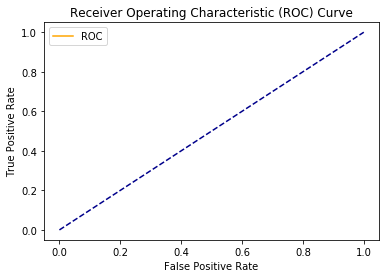

In [223]:
target_names = ['normal','r2l']
print(classification_report(y_test_r2l, Y_pred_r2l, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_r2l, Y_pred_r2l))
print("Log Loss Score is ..:",log_loss(y_test_r2l, Y_pred_r2l, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_r2l, Y_pred_r2l, pos_label=2)
plot_roc_curve(fpr,tpr)

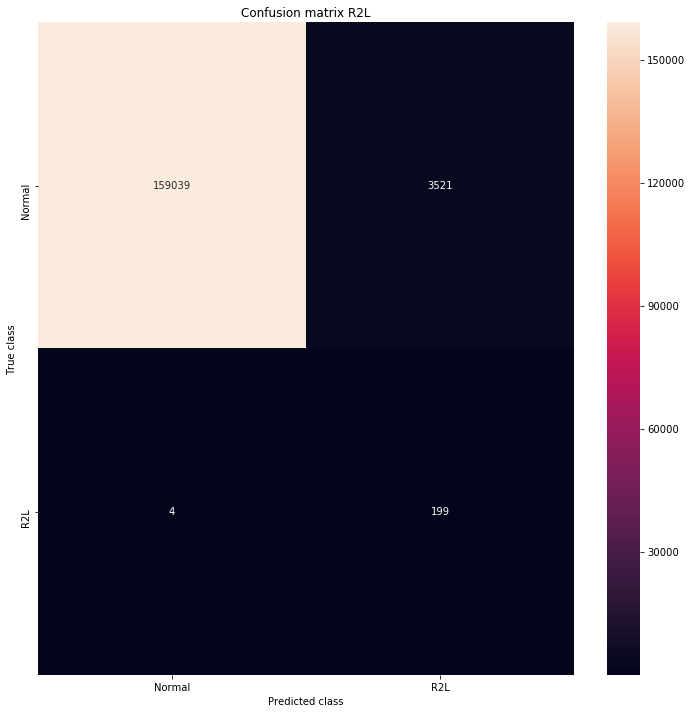

In [224]:
LABELS = ["Normal", "R2L"]
plt.figure(figsize=(12, 12))
sns.heatmap(cm_r2l, xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
plt.title("Confusion matrix R2L")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

In [225]:
parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'min_child_samples': 50,
    'boosting': 'gbdt',
    'num_leaves': 100,
    'feature_fraction': 0.5,
    'bagging_fraction': 0.5,
    'bagging_freq': 20,
    'learning_rate': 0.05,
    'verbose': 0,
    'max_depth': 6,
}
#lgb.cv(param, train_data, num_round, nfold=5)

evals_results_r2lfc = {}

model_r2lfc = lgb.train(parameters,
                       train_data_r2l,
                       valid_sets=[test_data_r2l],
                       evals_result=evals_results_r2lfc,
                       fobj=focal_loss,
                       feval=eval_error,
                       #valid_sets=test_data,
                       num_boost_round=5000,
                       early_stopping_rounds=500)


[1]	valid_0's auc: 0.972942	valid_0's focal_loss: 0.242269
Training until validation scores don't improve for 500 rounds.
[2]	valid_0's auc: 0.996498	valid_0's focal_loss: 0.22624
[3]	valid_0's auc: 0.997377	valid_0's focal_loss: 0.211496
[4]	valid_0's auc: 0.989428	valid_0's focal_loss: 0.197901
[5]	valid_0's auc: 0.997177	valid_0's focal_loss: 0.185319
[6]	valid_0's auc: 0.997056	valid_0's focal_loss: 0.173689
[7]	valid_0's auc: 0.997154	valid_0's focal_loss: 0.162909
[8]	valid_0's auc: 0.989782	valid_0's focal_loss: 0.152893
[9]	valid_0's auc: 0.989532	valid_0's focal_loss: 0.143582
[10]	valid_0's auc: 0.989415	valid_0's focal_loss: 0.134919
[11]	valid_0's auc: 0.989472	valid_0's focal_loss: 0.126841
[12]	valid_0's auc: 0.996034	valid_0's focal_loss: 0.119309
[13]	valid_0's auc: 0.996878	valid_0's focal_loss: 0.112282
[14]	valid_0's auc: 0.997032	valid_0's focal_loss: 0.105715
[15]	valid_0's auc: 0.996953	valid_0's focal_loss: 0.0995759
[16]	valid_0's auc: 0.996981	valid_0's focal_l

[133]	valid_0's auc: 0.999823	valid_0's focal_loss: 0.000284591
[134]	valid_0's auc: 0.99982	valid_0's focal_loss: 0.000274106
[135]	valid_0's auc: 0.99982	valid_0's focal_loss: 0.000263889
[136]	valid_0's auc: 0.999823	valid_0's focal_loss: 0.000253821
[137]	valid_0's auc: 0.99982	valid_0's focal_loss: 0.000244318
[138]	valid_0's auc: 0.999839	valid_0's focal_loss: 0.000233162
[139]	valid_0's auc: 0.999833	valid_0's focal_loss: 0.000224848
[140]	valid_0's auc: 0.999893	valid_0's focal_loss: 0.000216916
[141]	valid_0's auc: 0.999891	valid_0's focal_loss: 0.00020964
[142]	valid_0's auc: 0.999889	valid_0's focal_loss: 0.000202316
[143]	valid_0's auc: 0.999899	valid_0's focal_loss: 0.000194005
[144]	valid_0's auc: 0.999906	valid_0's focal_loss: 0.000187428
[145]	valid_0's auc: 0.999907	valid_0's focal_loss: 0.000179295
[146]	valid_0's auc: 0.999911	valid_0's focal_loss: 0.000171901
[147]	valid_0's auc: 0.99991	valid_0's focal_loss: 0.000166244
[148]	valid_0's auc: 0.999908	valid_0's focal

[262]	valid_0's auc: 0.999924	valid_0's focal_loss: 4.35757e-05
[263]	valid_0's auc: 0.999924	valid_0's focal_loss: 4.35043e-05
[264]	valid_0's auc: 0.999923	valid_0's focal_loss: 4.36397e-05
[265]	valid_0's auc: 0.999926	valid_0's focal_loss: 4.35828e-05
[266]	valid_0's auc: 0.999925	valid_0's focal_loss: 4.36046e-05
[267]	valid_0's auc: 0.999926	valid_0's focal_loss: 4.36746e-05
[268]	valid_0's auc: 0.999925	valid_0's focal_loss: 4.37238e-05
[269]	valid_0's auc: 0.999924	valid_0's focal_loss: 4.37244e-05
[270]	valid_0's auc: 0.999925	valid_0's focal_loss: 4.3687e-05
[271]	valid_0's auc: 0.999929	valid_0's focal_loss: 4.35378e-05
[272]	valid_0's auc: 0.999927	valid_0's focal_loss: 4.35654e-05
[273]	valid_0's auc: 0.999926	valid_0's focal_loss: 4.34811e-05
[274]	valid_0's auc: 0.999929	valid_0's focal_loss: 4.34205e-05
[275]	valid_0's auc: 0.999932	valid_0's focal_loss: 4.34415e-05
[276]	valid_0's auc: 0.999932	valid_0's focal_loss: 4.35538e-05
[277]	valid_0's auc: 0.999931	valid_0's f

[391]	valid_0's auc: 0.999896	valid_0's focal_loss: 4.73096e-05
[392]	valid_0's auc: 0.999899	valid_0's focal_loss: 4.71269e-05
[393]	valid_0's auc: 0.999897	valid_0's focal_loss: 4.71226e-05
[394]	valid_0's auc: 0.999896	valid_0's focal_loss: 4.72477e-05
[395]	valid_0's auc: 0.999894	valid_0's focal_loss: 4.73091e-05
[396]	valid_0's auc: 0.999897	valid_0's focal_loss: 4.74274e-05
[397]	valid_0's auc: 0.999895	valid_0's focal_loss: 4.74665e-05
[398]	valid_0's auc: 0.999897	valid_0's focal_loss: 4.76541e-05
[399]	valid_0's auc: 0.999896	valid_0's focal_loss: 4.77421e-05
[400]	valid_0's auc: 0.999899	valid_0's focal_loss: 4.76199e-05
[401]	valid_0's auc: 0.999897	valid_0's focal_loss: 4.7613e-05
[402]	valid_0's auc: 0.999896	valid_0's focal_loss: 4.75871e-05
[403]	valid_0's auc: 0.999901	valid_0's focal_loss: 4.73668e-05
[404]	valid_0's auc: 0.999899	valid_0's focal_loss: 4.75586e-05
[405]	valid_0's auc: 0.999898	valid_0's focal_loss: 4.77751e-05
[406]	valid_0's auc: 0.999902	valid_0's f

[520]	valid_0's auc: 0.999914	valid_0's focal_loss: 5.08856e-05
[521]	valid_0's auc: 0.999917	valid_0's focal_loss: 5.07682e-05
[522]	valid_0's auc: 0.99992	valid_0's focal_loss: 5.05118e-05
[523]	valid_0's auc: 0.999923	valid_0's focal_loss: 5.02995e-05
[524]	valid_0's auc: 0.999926	valid_0's focal_loss: 5.02759e-05
[525]	valid_0's auc: 0.999928	valid_0's focal_loss: 5.0249e-05
[526]	valid_0's auc: 0.999927	valid_0's focal_loss: 5.02229e-05
[527]	valid_0's auc: 0.99993	valid_0's focal_loss: 5.00372e-05
[528]	valid_0's auc: 0.999929	valid_0's focal_loss: 4.99139e-05
[529]	valid_0's auc: 0.999929	valid_0's focal_loss: 4.98473e-05
[530]	valid_0's auc: 0.999931	valid_0's focal_loss: 4.99242e-05
[531]	valid_0's auc: 0.999933	valid_0's focal_loss: 4.9932e-05
[532]	valid_0's auc: 0.999931	valid_0's focal_loss: 5.01202e-05
[533]	valid_0's auc: 0.999931	valid_0's focal_loss: 5.00511e-05
[534]	valid_0's auc: 0.999931	valid_0's focal_loss: 5.019e-05
[535]	valid_0's auc: 0.99993	valid_0's focal_l

[649]	valid_0's auc: 0.999893	valid_0's focal_loss: 5.65312e-05
[650]	valid_0's auc: 0.999893	valid_0's focal_loss: 5.6745e-05
[651]	valid_0's auc: 0.999892	valid_0's focal_loss: 5.69356e-05
[652]	valid_0's auc: 0.999893	valid_0's focal_loss: 5.7047e-05
[653]	valid_0's auc: 0.999891	valid_0's focal_loss: 5.71515e-05
[654]	valid_0's auc: 0.999888	valid_0's focal_loss: 5.71848e-05
[655]	valid_0's auc: 0.999886	valid_0's focal_loss: 5.74116e-05
[656]	valid_0's auc: 0.999885	valid_0's focal_loss: 5.74916e-05
[657]	valid_0's auc: 0.999884	valid_0's focal_loss: 5.76153e-05
[658]	valid_0's auc: 0.999881	valid_0's focal_loss: 5.76806e-05
[659]	valid_0's auc: 0.999881	valid_0's focal_loss: 5.77343e-05
[660]	valid_0's auc: 0.99988	valid_0's focal_loss: 5.76808e-05
[661]	valid_0's auc: 0.999882	valid_0's focal_loss: 5.77222e-05
[662]	valid_0's auc: 0.999883	valid_0's focal_loss: 5.76672e-05
[663]	valid_0's auc: 0.999884	valid_0's focal_loss: 5.76893e-05
[664]	valid_0's auc: 0.999887	valid_0's foc

In [226]:
Y_pred_r2lfc=model_r2lfc.predict(X_test_r2l, num_iteration=model_r2lfc.best_iteration)

for i in range(0,len(Y_pred_r2lfc)):
    if Y_pred_r2lfc[i]>=.5:       # setting threshold to .5
       Y_pred_r2lfc[i]=1
    else:  
       Y_pred_r2lfc[i]=0
        
cm_r2lfc = confusion_matrix(y_test_r2l, Y_pred_r2lfc)
cm_r2lfc

array([[162559,      1],
       [     9,    194]], dtype=int64)

              precision    recall  f1-score   support

      normal        1.0       1.0       1.0    162560
         r2l        1.0       1.0       1.0       203

    accuracy                            1.0    162763
   macro avg        1.0       1.0       1.0    162763
weighted avg        1.0       1.0       1.0    162763


 ------------------------------------

ROC-AUC Score is ..: 0.9778294365278694
Log Loss Score is ..: 0.002122033653512774


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



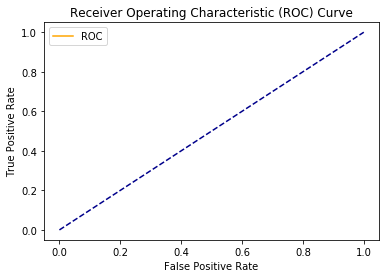

In [227]:
target_names = ['normal','r2l']
print(classification_report(y_test_r2l, Y_pred_r2lfc, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_r2l, Y_pred_r2lfc))
print("Log Loss Score is ..:",log_loss(y_test_r2l, Y_pred_r2lfc, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_r2l, Y_pred_r2lfc, pos_label=2)
plot_roc_curve(fpr,tpr)

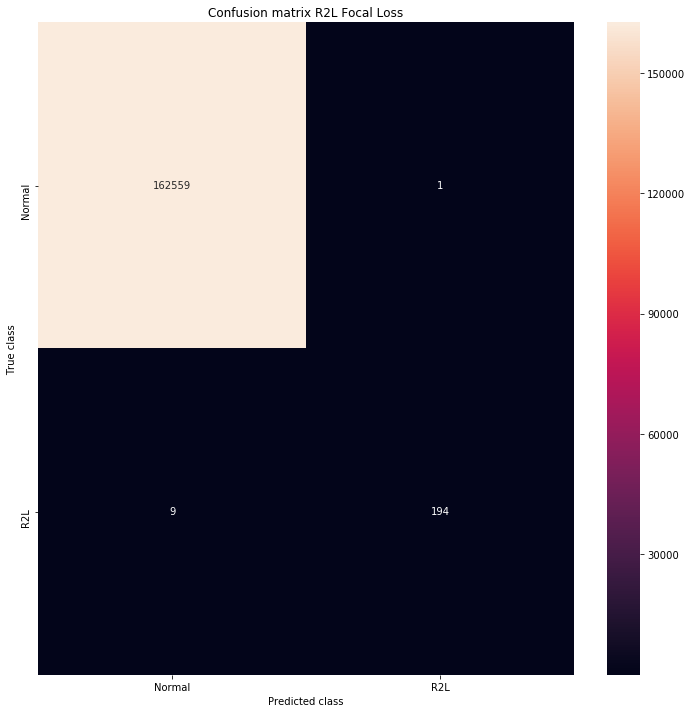

In [228]:
LABELS = ["Normal", "R2L"]
plt.figure(figsize=(12, 12))
sns.heatmap(cm_r2lfc, xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
plt.title("Confusion matrix R2L Focal Loss")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

In [229]:
df_u2r = df_no_duplicate[(df_no_duplicate.classes == 'normal') | (df_no_duplicate.classes == 'u2r')]
df_u2r['classes'] = np.where(df_u2r['classes'] == 'normal', 0, 1)

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [230]:
df_nd_u2r  = df_u2r.copy()
y_nd_u2r = df_nd_u2r['classes']
df_nd_u2r = df_nd_u2r.drop('classes', 1)
X_train_u2r, X_test_u2r, y_train_u2r, y_test_u2r = train_test_split(df_nd_u2r , y_nd_u2r, test_size=0.2, random_state=42)

In [231]:
df_u2r.iloc[:,0:40].columns.to_list()

['duration',
 'protocol_type',
 'service',
 'flag',
 'src_bytes',
 'dst_bytes',
 'land',
 'wrong_fragment',
 'urgent',
 'hot',
 'num_failed_logins',
 'logged_in',
 'num_compromised',
 'root_shell',
 'su_attempted',
 'num_root',
 'num_file_creations',
 'num_shells',
 'num_access_files',
 'is_host_login',
 'is_guest_login',
 'count',
 'srv_count',
 'serror_rate',
 'srv_serror_rate',
 'rerror_rate',
 'srv_rerror_rate',
 'same_srv_rate',
 'diff_srv_rate',
 'srv_diff_host_rate',
 'dst_host_count',
 'dst_host_srv_count',
 'dst_host_same_srv_rate',
 'dst_host_diff_srv_rate',
 'dst_host_same_src_port_rate',
 'dst_host_srv_diff_host_rate',
 'dst_host_serror_rate',
 'dst_host_srv_serror_rate',
 'dst_host_rerror_rate',
 'dst_host_srv_rerror_rate']

In [232]:
df_u2r.groupby('classes').count()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
classes,,,,,,,,,,,,,,,,,,,,,
0,812814,812814,812814,812814,812814,812814,812814,812814,812814,812814,...,812814,812814,812814,812814,812814,812814,812814,812814,812814,812814
1,52,52,52,52,52,52,52,52,52,52,...,52,52,52,52,52,52,52,52,52,52


In [233]:
a = (len(df_no_duplicate[(df_no_duplicate.classes == 'u2r')]) / len(df_no_duplicate[(df_no_duplicate.classes == 'normal')]))
print("Ratio is ..: {}%".format(round(100*a,2)))

Ratio is ..: 0.01%


In [257]:
train_data_u2r = lgb.Dataset(X_train_u2r, label=y_train_u2r, free_raw_data=False, feature_name=df_u2r.iloc[:,0:40].columns.to_list())
test_data_u2r = lgb.Dataset(X_test_u2r, label=y_test_u2r, free_raw_data=False)

In [235]:
parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'min_child_samples': 50,
    'boosting': 'gbdt',#dart,gbdt
    'num_leaves': 70,
    'feature_fraction': 0.5,
    'bagging_fraction': 0.8,
    'bagging_freq': 10,
    'learning_rate': 0.05,
    'verbose': 0,
    'max_depth': 6,
    'max bin' : 350

    
}

#lgb.cv(param, train_data, num_round, nfold=5)

evals_results_u2r = {}

model_u2r = lgb.train(parameters,
                       train_data,
                       valid_sets=[test_data_u2r],
                       evals_result=evals_results_u2r,
                       #valid_sets=test_data,
                       num_boost_round=1000,
                       early_stopping_rounds=200)

[1]	valid_0's auc: 0.848611
Training until validation scores don't improve for 200 rounds.
[2]	valid_0's auc: 0.805339
[3]	valid_0's auc: 0.50067
[4]	valid_0's auc: 0.24983
[5]	valid_0's auc: 0.375031
[6]	valid_0's auc: 0.390878
[7]	valid_0's auc: 0.391802
[8]	valid_0's auc: 0.883496
[9]	valid_0's auc: 0.885639
[10]	valid_0's auc: 0.886212
[11]	valid_0's auc: 0.88307
[12]	valid_0's auc: 0.883193
[13]	valid_0's auc: 0.883357
[14]	valid_0's auc: 0.883436
[15]	valid_0's auc: 0.884082
[16]	valid_0's auc: 0.885563
[17]	valid_0's auc: 0.523423
[18]	valid_0's auc: 0.855186
[19]	valid_0's auc: 0.871333
[20]	valid_0's auc: 0.892279
[21]	valid_0's auc: 0.901878
[22]	valid_0's auc: 0.787875
[23]	valid_0's auc: 0.790683
[24]	valid_0's auc: 0.830278
[25]	valid_0's auc: 0.858654
[26]	valid_0's auc: 0.882735
[27]	valid_0's auc: 0.882088
[28]	valid_0's auc: 0.768609
[29]	valid_0's auc: 0.912792
[30]	valid_0's auc: 0.912128
[31]	valid_0's auc: 0.919227
[32]	valid_0's auc: 0.919683
[33]	valid_0's auc: 0

In [236]:
# bay u2r
def lgbm_bay_u2r(
     min_child_samples,
     num_leaves,
     feature_fraction,
     bagging_fraction,
     bagging_freq,
     learning_rate,
     max_depth,
     max_bin) :
     
     num_leaves = int(num_leaves)
     max_depth = int(max_depth)
     min_child_samples= int(min_child_samples)
     bagging_freq= int(bagging_freq)

     parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'min_child_samples': min_child_samples,
    'boosting': 'gbdt',#dart,gbdt
    'num_leaves': num_leaves,
    'feature_fraction': feature_fraction,
    'bagging_fraction': bagging_fraction,
    'bagging_freq': bagging_freq,
    'learning_rate': learning_rate,
    'verbose': 0,
    'max_depth': max_depth,
    'max_bin' : 350
    }
     evals_results_u2r = {}
     model_u2r = lgb.train(parameters,
                       train_data,
                       valid_sets=[test_data_u2r],
                       evals_result=evals_results_u2r,
                       #valid_sets=test_data,
                       num_boost_round=1000,
                       verbose_eval=False,
                       early_stopping_rounds=200)
     
     return model_u2r.best_score['valid_0']['auc']


In [237]:
bo_u2r = BayesianOptimization(lgbm_bay_u2r, params)
bo_u2r.maximize(init_points = 5, n_iter = 5)

|   iter    |  target   | baggin... | baggin... | featur... | learni... |  max_bin  | max_depth | min_ch... | num_le... |
-------------------------------------------------------------------------------------------------------------------------
|  1        |  0.8757   |  0.8171   |  22.89    |  0.7371   |  0.06145  |  394.0    |  7.344    |  61.83    |  58.39    |
|  2        |  0.9894   |  0.826    |  24.25    |  0.7668   |  0.05202  |  359.9    |  7.669    |  64.8     |  56.53    |
|  3        |  0.9952   |  0.8675   |  23.75    |  0.7963   |  0.05717  |  350.2    |  7.641    |  66.21    |  58.47    |
|  4        |  0.9522   |  0.7039   |  22.11    |  0.7628   |  0.04257  |  340.8    |  7.438    |  67.82    |  59.27    |
|  5        |  0.9903   |  0.7388   |  21.57    |  0.7912   |  0.06076  |  356.6    |  7.065    |  69.44    |  50.83    |
|  6        |  0.9246   |  0.9      |  25.0     |  0.8      |  0.07     |  335.5    |  8.0      |  60.0     |  50.0     |
|  7        |  0.9343   

In [238]:
## bayes
bo_u2r.max['params']

{'bagging_fraction': 0.8691784729815655,
 'bagging_freq': 20.31574385141399,
 'feature_fraction': 0.7986967181857078,
 'learning_rate': 0.052462857773429586,
 'max_bin': 358.4691617624585,
 'max_depth': 7.982085606883642,
 'min_child_samples': 69.92750853596608,
 'num_leaves': 58.28019633366808}

In [239]:
parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'min_child_samples': 60,
    'boosting': 'gbdt',#dart,gbdt
    'num_leaves': 60,
    'feature_fraction': 0.71,
    'bagging_fraction': 0.88,
    'bagging_freq': 20,
    'learning_rate': 0.047 ,
    'verbose': 0,
    'max_depth': 7,
    'max_bin' : 350
  }

evals_results_u2r = {}

model_u2r = lgb.train(parameters,
                       train_data,
                       valid_sets=[test_data_u2r],
                       evals_result=evals_results_u2r,
                       #valid_sets=test_data,
                       num_boost_round=1000,
                       early_stopping_rounds=200)




[1]	valid_0's auc: 0.857877
Training until validation scores don't improve for 200 rounds.
[2]	valid_0's auc: 0.379317
[3]	valid_0's auc: 0.879196
[4]	valid_0's auc: 0.886441
[5]	valid_0's auc: 0.870969
[6]	valid_0's auc: 0.870594
[7]	valid_0's auc: 0.872095
[8]	valid_0's auc: 0.873238
[9]	valid_0's auc: 0.962271
[10]	valid_0's auc: 0.872223
[11]	valid_0's auc: 0.8724
[12]	valid_0's auc: 0.87389
[13]	valid_0's auc: 0.873313
[14]	valid_0's auc: 0.874326
[15]	valid_0's auc: 0.874141
[16]	valid_0's auc: 0.868729
[17]	valid_0's auc: 0.868932
[18]	valid_0's auc: 0.868916
[19]	valid_0's auc: 0.867431
[20]	valid_0's auc: 0.868095
[21]	valid_0's auc: 0.867814
[22]	valid_0's auc: 0.866214
[23]	valid_0's auc: 0.776855
[24]	valid_0's auc: 0.778328
[25]	valid_0's auc: 0.777969
[26]	valid_0's auc: 0.767916
[27]	valid_0's auc: 0.773038
[28]	valid_0's auc: 0.830131
[29]	valid_0's auc: 0.867435
[30]	valid_0's auc: 0.862836
[31]	valid_0's auc: 0.874972
[32]	valid_0's auc: 0.872338
[33]	valid_0's auc: 0

[279]	valid_0's auc: 0.984284
[280]	valid_0's auc: 0.984284
[281]	valid_0's auc: 0.984284
[282]	valid_0's auc: 0.984284
[283]	valid_0's auc: 0.984284
[284]	valid_0's auc: 0.984284
[285]	valid_0's auc: 0.984284
[286]	valid_0's auc: 0.984284
[287]	valid_0's auc: 0.984284
[288]	valid_0's auc: 0.984284
[289]	valid_0's auc: 0.984284
[290]	valid_0's auc: 0.984284
[291]	valid_0's auc: 0.984284
[292]	valid_0's auc: 0.984284
[293]	valid_0's auc: 0.984284
[294]	valid_0's auc: 0.984284
[295]	valid_0's auc: 0.984284
[296]	valid_0's auc: 0.984284
[297]	valid_0's auc: 0.984284
[298]	valid_0's auc: 0.984284
[299]	valid_0's auc: 0.984284
[300]	valid_0's auc: 0.984284
[301]	valid_0's auc: 0.984284
[302]	valid_0's auc: 0.984284
[303]	valid_0's auc: 0.984284
[304]	valid_0's auc: 0.984284
[305]	valid_0's auc: 0.984284
[306]	valid_0's auc: 0.984284
[307]	valid_0's auc: 0.984284
[308]	valid_0's auc: 0.984284
[309]	valid_0's auc: 0.984284
[310]	valid_0's auc: 0.984284
[311]	valid_0's auc: 0.984284
[312]	vali

In [240]:
Y_pred_u2r=model_u2r.predict(X_test_u2r, num_iteration=model_u2r.best_iteration)

for i in range(0,len(Y_pred_u2r)):
    if Y_pred_u2r[i]>=.5:       # setting threshold to .5
       Y_pred_u2r[i]=1
    else:  
       Y_pred_u2r[i]=0
        
cm_u2r = confusion_matrix(y_test_u2r, Y_pred_u2r)
cm_u2r

array([[159331,   3235],
       [     2,      6]], dtype=int64)

              precision    recall  f1-score   support

      normal        1.0       1.0       1.0    162566
         u2r        0.0       0.8       0.0         8

    accuracy                            1.0    162574
   macro avg        0.5       0.9       0.5    162574
weighted avg        1.0       1.0       1.0    162574


 ------------------------------------

ROC-AUC Score is ..: 0.8650501949977241
Log Loss Score is ..: 0.6877151690184944


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



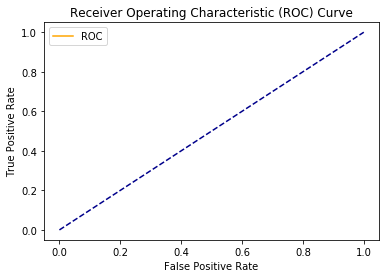

In [241]:
target_names = ['normal','u2r']
print(classification_report(y_test_u2r, Y_pred_u2r, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_u2r, Y_pred_u2r))
print("Log Loss Score is ..:",log_loss(y_test_u2r, Y_pred_u2r, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_u2r, Y_pred_u2r, pos_label=2)
plot_roc_curve(fpr,tpr)

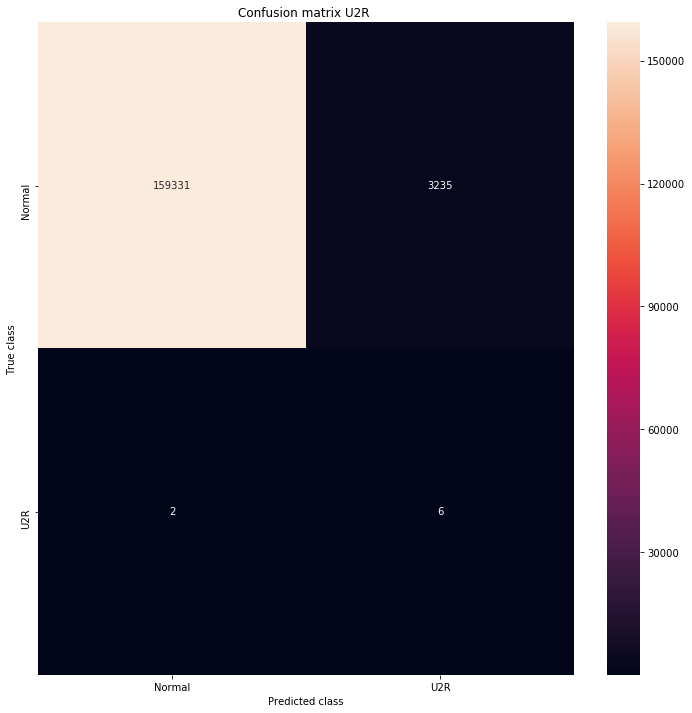

In [242]:
LABELS = ["Normal", "U2R"]
plt.figure(figsize=(12, 12))
sns.heatmap(cm_u2r, xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
plt.title("Confusion matrix U2R ")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

In [250]:
train_data_u2r

False

In [259]:
parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'boosting': 'gbdt',
    'num_leaves': 31,
    'feature_fraction': 0.5,
    'bagging_fraction': 0.5,
    'bagging_freq': 20,
    'learning_rate': 0.05,
    'verbose': 0
}

#lgb.cv(param, train_data, num_round, nfold=5)

evals_results_u2rfc = {}

model_u2rfc = lgb.train(parameters,
                       train_data_u2r,
                       valid_sets=[test_data_u2r],
                       evals_result=evals_results_u2rfc,
                       fobj=focal_loss,
                       feval=eval_error,
                       #valid_sets=test_data,
                       num_boost_round=1000,
                       early_stopping_rounds=100)

[1]	valid_0's auc: 0.749752	valid_0's focal_loss: 0.242453
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's auc: 0.820031	valid_0's focal_loss: 0.22639
[3]	valid_0's auc: 0.999686	valid_0's focal_loss: 0.211609
[4]	valid_0's auc: 0.999856	valid_0's focal_loss: 0.197992
[5]	valid_0's auc: 0.999883	valid_0's focal_loss: 0.185399
[6]	valid_0's auc: 0.999874	valid_0's focal_loss: 0.17375
[7]	valid_0's auc: 0.999913	valid_0's focal_loss: 0.162945
[8]	valid_0's auc: 0.999913	valid_0's focal_loss: 0.152916
[9]	valid_0's auc: 0.999943	valid_0's focal_loss: 0.143593
[10]	valid_0's auc: 0.999943	valid_0's focal_loss: 0.134918
[11]	valid_0's auc: 0.999952	valid_0's focal_loss: 0.126837
[12]	valid_0's auc: 0.999939	valid_0's focal_loss: 0.119299
[13]	valid_0's auc: 0.999935	valid_0's focal_loss: 0.112263
[14]	valid_0's auc: 0.999952	valid_0's focal_loss: 0.105687
[15]	valid_0's auc: 0.999955	valid_0's focal_loss: 0.09954
[16]	valid_0's auc: 0.999952	valid_0's focal_loss

[133]	valid_0's auc: 0.999988	valid_0's focal_loss: 0.000219195
[134]	valid_0's auc: 0.999987	valid_0's focal_loss: 0.000209107
[135]	valid_0's auc: 0.999987	valid_0's focal_loss: 0.000199695
[136]	valid_0's auc: 0.999986	valid_0's focal_loss: 0.000190875
[137]	valid_0's auc: 0.999987	valid_0's focal_loss: 0.000182254
[138]	valid_0's auc: 0.999988	valid_0's focal_loss: 0.000173887
[139]	valid_0's auc: 0.999987	valid_0's focal_loss: 0.000166209
[140]	valid_0's auc: 0.999988	valid_0's focal_loss: 0.000158789
[141]	valid_0's auc: 0.999987	valid_0's focal_loss: 0.00015187
[142]	valid_0's auc: 0.999987	valid_0's focal_loss: 0.00014531
[143]	valid_0's auc: 0.999985	valid_0's focal_loss: 0.000138888
[144]	valid_0's auc: 0.999986	valid_0's focal_loss: 0.000132794
[145]	valid_0's auc: 0.999985	valid_0's focal_loss: 0.000127169
[146]	valid_0's auc: 0.999986	valid_0's focal_loss: 0.00012153
[147]	valid_0's auc: 0.999986	valid_0's focal_loss: 0.00011631
[148]	valid_0's auc: 0.999985	valid_0's foca

In [260]:
##
def lgbm_bay_u2rfc(
     min_child_samples,
     num_leaves,
     feature_fraction,
     bagging_fraction,
     bagging_freq,
     learning_rate,
     max_depth,
     max_bin) :
     
     num_leaves = int(num_leaves)
     max_depth = int(max_depth)
     min_child_samples= int(min_child_samples)
     bagging_freq= int(bagging_freq)

     parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'min_child_samples': min_child_samples,
    'boosting': 'gbdt',#dart,gbdt
    'num_leaves': num_leaves,
    'feature_fraction': feature_fraction,
    'bagging_fraction': bagging_fraction,
    'bagging_freq': bagging_freq,
    'learning_rate': learning_rate,
    'verbose': 0,
    'max_depth': max_depth,
    'max_bin' : 350
    }

     evals_results_u2rfc = {}

     model_u2rfc = lgb.train(parameters,
                       train_data_u2r,
                       valid_sets=[test_data_u2r],
                       evals_result=evals_results_u2rfc,
                       fobj=focal_loss,
                       feval=eval_error,
                       #valid_sets=test_data,
                       num_boost_round=1000,
                       verbose_eval=False,
                       early_stopping_rounds=100)
     
     return model_u2rfc.best_score['valid_0']['auc']

In [261]:
bo_u2rfc = BayesianOptimization(lgbm_bay_u2rfc, params)
bo_u2rfc.maximize(init_points = 5, n_iter = 5)

|   iter    |  target   | baggin... | baggin... | featur... | learni... |  max_bin  | max_depth | min_ch... | num_le... |
-------------------------------------------------------------------------------------------------------------------------
|  1        |  0.9999   |  0.724    |  22.75    |  0.7144   |  0.04912  |  393.8    |  7.119    |  66.34    |  58.34    |
|  2        |  0.9999   |  0.7452   |  23.53    |  0.7869   |  0.05419  |  374.4    |  7.245    |  61.21    |  56.08    |
|  3        |  1.0      |  0.7733   |  23.41    |  0.7208   |  0.06842  |  371.9    |  7.325    |  60.84    |  56.48    |
|  4        |  1.0      |  0.8573   |  20.97    |  0.7274   |  0.05468  |  355.3    |  7.241    |  64.1     |  52.16    |
|  5        |  1.0      |  0.8133   |  21.08    |  0.7859   |  0.05581  |  356.1    |  7.458    |  63.96    |  57.68    |
|  6        |  1.0      |  0.7389   |  23.58    |  0.7919   |  0.06637  |  325.0    |  7.3      |  69.47    |  51.03    |
|  7        |  1.0      

In [262]:
#bay

bo_u2r.max['params']



{'bagging_fraction': 0.8691784729815655,
 'bagging_freq': 20.31574385141399,
 'feature_fraction': 0.7986967181857078,
 'learning_rate': 0.052462857773429586,
 'max_bin': 358.4691617624585,
 'max_depth': 7.982085606883642,
 'min_child_samples': 69.92750853596608,
 'num_leaves': 58.28019633366808}

In [268]:
parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'min_child_samples': 70,
    'boosting': 'gbdt',#dart,gbdt
    'num_leaves': 58,
    'feature_fraction': 0.8,
    'bagging_fraction': 0.87,
    'bagging_freq': 20,
    'learning_rate': 0.052,
    'verbose': 0,
    'max_depth': 8,
    'max_bin' : 358
  }

evals_results_u2rfc = {}

model_u2rfc = lgb.train(parameters,
                       train_data_u2r,
                       valid_sets=[test_data_u2r],
                       evals_result=evals_results_u2rfc,
                       fobj=focal_loss,
                       feval=eval_error,
                       #valid_sets=test_data,
                       num_boost_round=1000,
                       early_stopping_rounds=100)

[1]	valid_0's auc: 0.874741	valid_0's focal_loss: 0.241773
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's auc: 0.859542	valid_0's focal_loss: 0.225157
[3]	valid_0's auc: 0.854979	valid_0's focal_loss: 0.209904
[4]	valid_0's auc: 0.894243	valid_0's focal_loss: 0.195897
[5]	valid_0's auc: 0.999672	valid_0's focal_loss: 0.182987
[6]	valid_0's auc: 0.999616	valid_0's focal_loss: 0.171063
[7]	valid_0's auc: 0.999718	valid_0's focal_loss: 0.160039
[8]	valid_0's auc: 0.999841	valid_0's focal_loss: 0.149837
[9]	valid_0's auc: 0.999901	valid_0's focal_loss: 0.140373
[10]	valid_0's auc: 0.999914	valid_0's focal_loss: 0.131589
[11]	valid_0's auc: 0.999908	valid_0's focal_loss: 0.123425
[12]	valid_0's auc: 0.999899	valid_0's focal_loss: 0.115833
[13]	valid_0's auc: 0.99989	valid_0's focal_loss: 0.10876
[14]	valid_0's auc: 0.999897	valid_0's focal_loss: 0.102169
[15]	valid_0's auc: 0.999909	valid_0's focal_loss: 0.0960177
[16]	valid_0's auc: 0.999928	valid_0's focal_lo

[133]	valid_0's auc: 0.999979	valid_0's focal_loss: 0.000173133
[134]	valid_0's auc: 0.999978	valid_0's focal_loss: 0.000165045
[135]	valid_0's auc: 0.999978	valid_0's focal_loss: 0.000157382
[136]	valid_0's auc: 0.99998	valid_0's focal_loss: 0.000150053
[137]	valid_0's auc: 0.999978	valid_0's focal_loss: 0.000143332
[138]	valid_0's auc: 0.999977	valid_0's focal_loss: 0.000136889
[139]	valid_0's auc: 0.999978	valid_0's focal_loss: 0.000130784
[140]	valid_0's auc: 0.999979	valid_0's focal_loss: 0.000124775
[141]	valid_0's auc: 0.999978	valid_0's focal_loss: 0.000119247
[142]	valid_0's auc: 0.99998	valid_0's focal_loss: 0.000113831
[143]	valid_0's auc: 0.99998	valid_0's focal_loss: 0.000108779
[144]	valid_0's auc: 0.999982	valid_0's focal_loss: 0.000103758
[145]	valid_0's auc: 0.999982	valid_0's focal_loss: 9.92968e-05
[146]	valid_0's auc: 0.999982	valid_0's focal_loss: 9.49951e-05
[147]	valid_0's auc: 0.999982	valid_0's focal_loss: 9.08891e-05
[148]	valid_0's auc: 0.999982	valid_0's foc

[262]	valid_0's auc: 0.999992	valid_0's focal_loss: 1.23745e-05
[263]	valid_0's auc: 0.999992	valid_0's focal_loss: 1.24446e-05
[264]	valid_0's auc: 0.999992	valid_0's focal_loss: 1.2671e-05
[265]	valid_0's auc: 0.999991	valid_0's focal_loss: 1.29012e-05
[266]	valid_0's auc: 0.99999	valid_0's focal_loss: 1.31348e-05
[267]	valid_0's auc: 0.99999	valid_0's focal_loss: 1.32437e-05
[268]	valid_0's auc: 0.99999	valid_0's focal_loss: 1.34048e-05
[269]	valid_0's auc: 0.99999	valid_0's focal_loss: 1.35072e-05
[270]	valid_0's auc: 0.99999	valid_0's focal_loss: 1.37409e-05
[271]	valid_0's auc: 0.99999	valid_0's focal_loss: 1.39091e-05
[272]	valid_0's auc: 0.99999	valid_0's focal_loss: 1.41584e-05
[273]	valid_0's auc: 0.999991	valid_0's focal_loss: 1.42668e-05
[274]	valid_0's auc: 0.999991	valid_0's focal_loss: 1.43976e-05
[275]	valid_0's auc: 0.999991	valid_0's focal_loss: 1.44531e-05
[276]	valid_0's auc: 0.999991	valid_0's focal_loss: 1.4587e-05
[277]	valid_0's auc: 0.999991	valid_0's focal_los

In [269]:
Y_pred_u2rfc=model_u2rfc.predict(X_test_u2r, num_iteration=model_u2rfc.best_iteration)

for i in range(0,len(Y_pred_u2rfc)):
    if Y_pred_u2rfc[i]>=.5:       # setting threshold to .5
       Y_pred_u2rfc[i]=1
    else:  
       Y_pred_u2rfc[i]=0
        
cm_u2rfc = confusion_matrix(y_test_u2r, Y_pred_u2rfc)
cm_u2rfc

array([[162565,      1],
       [     3,      5]], dtype=int64)

              precision    recall  f1-score   support

      normal        1.0       1.0       1.0    162566
         u2r        0.8       0.6       0.7         8

    accuracy                            1.0    162574
   macro avg        0.9       0.8       0.9    162574
weighted avg        1.0       1.0       1.0    162574


 ------------------------------------

ROC-AUC Score is ..: 0.8124969243261199
Log Loss Score is ..: 0.000849803198403406


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



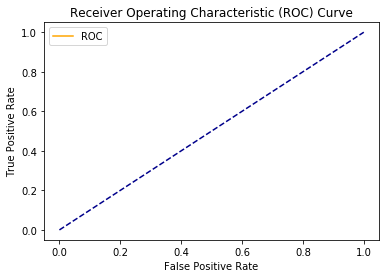

In [270]:
target_names = ['normal','u2r']
print(classification_report(y_test_u2r, Y_pred_u2rfc, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_u2r, Y_pred_u2rfc))
print("Log Loss Score is ..:",log_loss(y_test_u2r, Y_pred_u2rfc, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_u2r, Y_pred_u2rfc, pos_label=2)
plot_roc_curve(fpr,tpr)

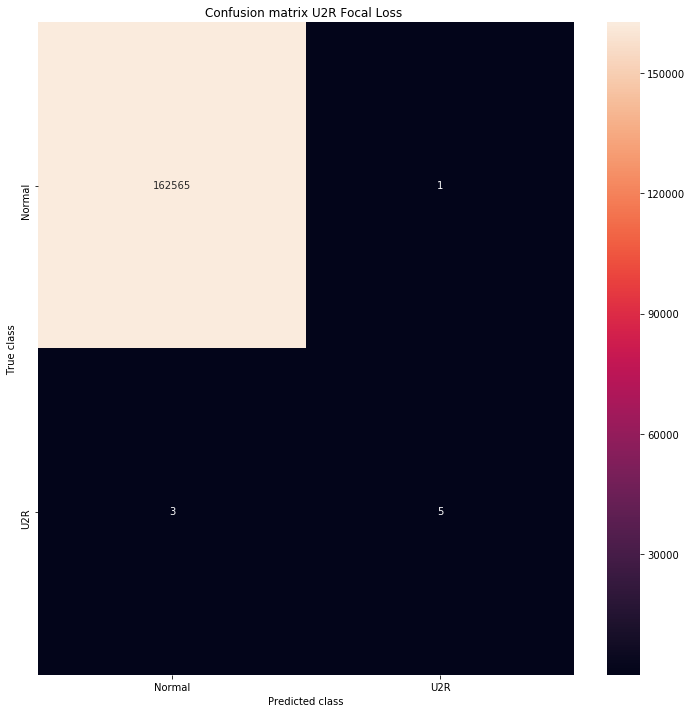

In [271]:
LABELS = ["Normal", "U2R"]
plt.figure(figsize=(12, 12))
sns.heatmap(cm_u2rfc, xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
plt.title("Confusion matrix U2R Focal Loss ")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

In [272]:
df_dos = df_no_duplicate[(df_no_duplicate.classes == 'normal') | (df_no_duplicate.classes == 'dos')]
df_dos['classes'] = np.where(df_dos['classes'] == 'normal', 0, 1)

C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [273]:
df_nd_dos  = df_dos.copy()
y_nd_dos = df_nd_dos['classes']
df_nd_dos = df_nd_dos.drop('classes', 1)
X_train_dos, X_test_dos, y_train_dos, y_test_dos = train_test_split(df_nd_dos , y_nd_dos, test_size=0.2, random_state=42)

In [274]:
df_dos.iloc[:,0:40].columns.to_list()

['duration',
 'protocol_type',
 'service',
 'flag',
 'src_bytes',
 'dst_bytes',
 'land',
 'wrong_fragment',
 'urgent',
 'hot',
 'num_failed_logins',
 'logged_in',
 'num_compromised',
 'root_shell',
 'su_attempted',
 'num_root',
 'num_file_creations',
 'num_shells',
 'num_access_files',
 'is_host_login',
 'is_guest_login',
 'count',
 'srv_count',
 'serror_rate',
 'srv_serror_rate',
 'rerror_rate',
 'srv_rerror_rate',
 'same_srv_rate',
 'diff_srv_rate',
 'srv_diff_host_rate',
 'dst_host_count',
 'dst_host_srv_count',
 'dst_host_same_srv_rate',
 'dst_host_diff_srv_rate',
 'dst_host_same_src_port_rate',
 'dst_host_srv_diff_host_rate',
 'dst_host_serror_rate',
 'dst_host_srv_serror_rate',
 'dst_host_rerror_rate',
 'dst_host_srv_rerror_rate']

In [275]:
df_dos.groupby('classes').count()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
classes,,,,,,,,,,,,,,,,,,,,,
0,812814,812814,812814,812814,812814,812814,812814,812814,812814,812814,...,812814,812814,812814,812814,812814,812814,812814,812814,812814,812814
1,247267,247267,247267,247267,247267,247267,247267,247267,247267,247267,...,247267,247267,247267,247267,247267,247267,247267,247267,247267,247267


In [276]:
a = (len(df_no_duplicate[(df_no_duplicate.classes == 'dos')]) / len(df_no_duplicate[(df_no_duplicate.classes == 'normal')]))
print("Ratio is ..: {}%".format(round(100*a,2)))

Ratio is ..: 30.42%


In [279]:
train_data_dos = lgb.Dataset(X_train_dos, label=y_train_dos, free_raw_data=False, feature_name=df_dos.iloc[:,0:40].columns.to_list())
test_data_dos = lgb.Dataset(X_test_dos, label=y_test_dos, free_raw_data=False)

In [280]:
parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'min_child_samples': 50,
    'boosting': 'gbdt',#dart,gbdt
    'num_leaves': 70,
    'feature_fraction': 0.5,
    'bagging_fraction': 0.8,
    'bagging_freq': 10,
    'learning_rate': 0.05,
    'verbose': 0,
    'max_depth': 6,
    'max bin' : 350

    
}

#lgb.cv(param, train_data, num_round, nfold=5)

evals_results_dos = {}

model_dos = lgb.train(parameters,
                       train_data,
                       valid_sets=[test_data_dos],
                       evals_result=evals_results_dos,
                       #valid_sets=test_data,
                       num_boost_round=1000,
                       early_stopping_rounds=200)

[1]	valid_0's auc: 0.96241
Training until validation scores don't improve for 200 rounds.
[2]	valid_0's auc: 0.0215965
[3]	valid_0's auc: 0.0208021
[4]	valid_0's auc: 0.0225368
[5]	valid_0's auc: 0.823054
[6]	valid_0's auc: 0.828878
[7]	valid_0's auc: 0.831342
[8]	valid_0's auc: 0.0567502
[9]	valid_0's auc: 0.833916
[10]	valid_0's auc: 0.351114
[11]	valid_0's auc: 0.0547722
[12]	valid_0's auc: 0.0645118
[13]	valid_0's auc: 0.0643944
[14]	valid_0's auc: 0.0651751
[15]	valid_0's auc: 0.0631215
[16]	valid_0's auc: 0.063394
[17]	valid_0's auc: 0.0638754
[18]	valid_0's auc: 0.041581
[19]	valid_0's auc: 0.0490881
[20]	valid_0's auc: 0.0908953
[21]	valid_0's auc: 0.108818
[22]	valid_0's auc: 0.11055
[23]	valid_0's auc: 0.134666
[24]	valid_0's auc: 0.289608
[25]	valid_0's auc: 0.611753
[26]	valid_0's auc: 0.606333
[27]	valid_0's auc: 0.7045
[28]	valid_0's auc: 0.486764
[29]	valid_0's auc: 0.793274
[30]	valid_0's auc: 0.793647
[31]	valid_0's auc: 0.796763
[32]	valid_0's auc: 0.799446
[33]	valid

In [281]:
# bay dos
def lgbm_bay_dos(
     min_child_samples,
     num_leaves,
     feature_fraction,
     bagging_fraction,
     bagging_freq,
     learning_rate,
     max_depth,
     max_bin) :
     
     num_leaves = int(num_leaves)
     max_depth = int(max_depth)
     min_child_samples= int(min_child_samples)
     bagging_freq= int(bagging_freq)

     parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'min_child_samples': min_child_samples,
    'boosting': 'gbdt',#dart,gbdt
    'num_leaves': num_leaves,
    'feature_fraction': feature_fraction,
    'bagging_fraction': bagging_fraction,
    'bagging_freq': bagging_freq,
    'learning_rate': learning_rate,
    'verbose': 0,
    'max_depth': max_depth,
    'max_bin' : 350
    }
     evals_results_dos = {}
     model_dos = lgb.train(parameters,
                       train_data,
                       valid_sets=[test_data_dos],
                       evals_result=evals_results_dos,
                       #valid_sets=test_data,
                       num_boost_round=1000,
                       verbose_eval=False,
                       early_stopping_rounds=200)
     
     return model_dos.best_score['valid_0']['auc']


In [282]:
bo_dos = BayesianOptimization(lgbm_bay_dos, params)
bo_dos.maximize(init_points = 5, n_iter = 5)

|   iter    |  target   | baggin... | baggin... | featur... | learni... |  max_bin  | max_depth | min_ch... | num_le... |
-------------------------------------------------------------------------------------------------------------------------
|  1        |  0.9682   |  0.8319   |  24.05    |  0.7279   |  0.04745  |  349.9    |  7.884    |  68.89    |  54.72    |
|  2        |  0.9311   |  0.7526   |  21.74    |  0.7835   |  0.06732  |  379.6    |  7.064    |  66.84    |  55.87    |
|  3        |  0.9803   |  0.7151   |  20.53    |  0.7052   |  0.04699  |  365.5    |  7.178    |  66.48    |  55.25    |
|  4        |  0.9637   |  0.8932   |  20.45    |  0.7468   |  0.05186  |  374.1    |  7.148    |  64.41    |  59.52    |
|  5        |  0.9573   |  0.7786   |  23.28    |  0.7035   |  0.05341  |  372.8    |  7.918    |  66.32    |  54.75    |
|  6        |  0.9637   |  0.7      |  20.0     |  0.7      |  0.04     |  325.0    |  8.0      |  60.0     |  50.0     |
|  7        |  0.8753   

In [283]:
## bayes
bo_dos.max['params']

{'bagging_fraction': 0.7150927256812186,
 'bagging_freq': 20.527623358576676,
 'feature_fraction': 0.7051713076530058,
 'learning_rate': 0.04699448438280994,
 'max_bin': 365.481635533322,
 'max_depth': 7.177583460018129,
 'min_child_samples': 66.48219257407457,
 'num_leaves': 55.245339055591415}

In [292]:
parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'min_child_samples': 66,
    'boosting': 'gbdt',#dart,gbdt
    'num_leaves': 55,
    'feature_fraction': 0.71,
    'bagging_fraction': 0.71,
    'bagging_freq': 21,
    'learning_rate': 0.047 ,
    'verbose': 0,
    'max_depth': 7,
    'max_bin' : 365
  }

evals_results_dos = {}

model_dos = lgb.train(parameters,
                       train_data,
                       valid_sets=[test_data_dos],
                       evals_result=evals_results_dos,
                       #valid_sets=test_data,
                       num_boost_round=1000,
                       early_stopping_rounds=200)




[1]	valid_0's auc: 0.875592
Training until validation scores don't improve for 200 rounds.
[2]	valid_0's auc: 0.111167
[3]	valid_0's auc: 0.89632
[4]	valid_0's auc: 0.893943
[5]	valid_0's auc: 0.87165
[6]	valid_0's auc: 0.80569
[7]	valid_0's auc: 0.803666
[8]	valid_0's auc: 0.831243
[9]	valid_0's auc: 0.835217
[10]	valid_0's auc: 0.831734
[11]	valid_0's auc: 0.941075
[12]	valid_0's auc: 0.901747
[13]	valid_0's auc: 0.788338
[14]	valid_0's auc: 0.775961
[15]	valid_0's auc: 0.755298
[16]	valid_0's auc: 0.885779
[17]	valid_0's auc: 0.753415
[18]	valid_0's auc: 0.854026
[19]	valid_0's auc: 0.717112
[20]	valid_0's auc: 0.846651
[21]	valid_0's auc: 0.722671
[22]	valid_0's auc: 0.89037
[23]	valid_0's auc: 0.741172
[24]	valid_0's auc: 0.69974
[25]	valid_0's auc: 0.699965
[26]	valid_0's auc: 0.680932
[27]	valid_0's auc: 0.511191
[28]	valid_0's auc: 0.515542
[29]	valid_0's auc: 0.360414
[30]	valid_0's auc: 0.26922
[31]	valid_0's auc: 0.216676
[32]	valid_0's auc: 0.197468
[33]	valid_0's auc: 0.13

In [293]:
Y_pred_dos=model_dos.predict(X_test_dos, num_iteration=model_dos.best_iteration)

for i in range(0,len(Y_pred_dos)):
    if Y_pred_dos[i]>=.5:       # setting threshold to .5
       Y_pred_dos[i]=1
    else:  
       Y_pred_dos[i]=0
        
cm_dos = confusion_matrix(y_test_dos, Y_pred_dos)
cm_dos

array([[152180,  10297],
       [   581,  48959]], dtype=int64)

              precision    recall  f1-score   support

      normal        1.0       0.9       1.0    162477
         dos        0.8       1.0       0.9     49540

    accuracy                            0.9    212017
   macro avg        0.9       1.0       0.9    212017
weighted avg        1.0       0.9       1.0    212017


 ------------------------------------

ROC-AUC Score is ..: 0.9624484897435712
Log Loss Score is ..: 1.7721269666044575


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



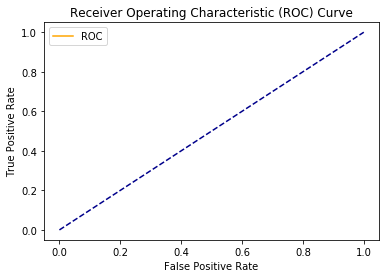

In [294]:
target_names = ['normal','dos']
print(classification_report(y_test_dos, Y_pred_dos, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_dos, Y_pred_dos))
print("Log Loss Score is ..:",log_loss(y_test_dos, Y_pred_dos, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_dos, Y_pred_dos, pos_label=2)
plot_roc_curve(fpr,tpr)

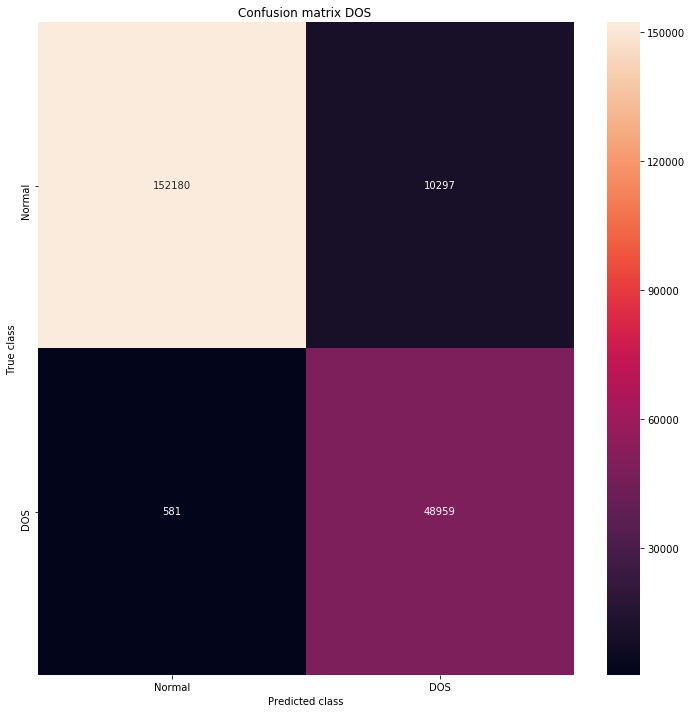

In [295]:
LABELS = ["Normal", "DOS"]
plt.figure(figsize=(12, 12))
sns.heatmap(cm_dos, xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
plt.title("Confusion matrix DOS ")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

In [288]:
parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'boosting': 'gbdt',
    'num_leaves': 31,
    'feature_fraction': 0.5,
    'bagging_fraction': 0.5,
    'bagging_freq': 20,
    'learning_rate': 0.05,
    'verbose': 0
}

#lgb.cv(param, train_data, num_round, nfold=5)

evals_results_dosfc = {}

model_dosfc = lgb.train(parameters,
                       train_data_dos,
                       valid_sets=[test_data_dos],
                       evals_result=evals_results_dosfc,
                       fobj=focal_loss,
                       feval=eval_error,
                       #valid_sets=test_data,
                       num_boost_round=1000,
                       early_stopping_rounds=100)

[1]	valid_0's auc: 0.998175	valid_0's focal_loss: 0.20474
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's auc: 0.99993	valid_0's focal_loss: 0.191192
[3]	valid_0's auc: 0.999978	valid_0's focal_loss: 0.178753
[4]	valid_0's auc: 0.999978	valid_0's focal_loss: 0.167283
[5]	valid_0's auc: 0.999979	valid_0's focal_loss: 0.156653
[6]	valid_0's auc: 0.99998	valid_0's focal_loss: 0.14681
[7]	valid_0's auc: 0.999997	valid_0's focal_loss: 0.137683
[8]	valid_0's auc: 0.999997	valid_0's focal_loss: 0.129233
[9]	valid_0's auc: 1	valid_0's focal_loss: 0.121373
[10]	valid_0's auc: 1	valid_0's focal_loss: 0.114091
[11]	valid_0's auc: 1	valid_0's focal_loss: 0.10727
[12]	valid_0's auc: 1	valid_0's focal_loss: 0.100892
[13]	valid_0's auc: 1	valid_0's focal_loss: 0.0949402
[14]	valid_0's auc: 1	valid_0's focal_loss: 0.0893983
[15]	valid_0's auc: 1	valid_0's focal_loss: 0.0841998
[16]	valid_0's auc: 1	valid_0's focal_loss: 0.0793358
[17]	valid_0's auc: 1	valid_0's focal_loss:

[148]	valid_0's auc: 1	valid_0's focal_loss: 9.88504e-05
[149]	valid_0's auc: 1	valid_0's focal_loss: 9.50338e-05
[150]	valid_0's auc: 1	valid_0's focal_loss: 9.14387e-05
[151]	valid_0's auc: 1	valid_0's focal_loss: 8.80555e-05
[152]	valid_0's auc: 1	valid_0's focal_loss: 8.44591e-05
[153]	valid_0's auc: 1	valid_0's focal_loss: 8.1283e-05
[154]	valid_0's auc: 1	valid_0's focal_loss: 7.80135e-05
[155]	valid_0's auc: 1	valid_0's focal_loss: 7.48443e-05
[156]	valid_0's auc: 1	valid_0's focal_loss: 7.18772e-05
[157]	valid_0's auc: 1	valid_0's focal_loss: 6.93952e-05
[158]	valid_0's auc: 1	valid_0's focal_loss: 6.67367e-05
[159]	valid_0's auc: 1	valid_0's focal_loss: 6.43035e-05
[160]	valid_0's auc: 1	valid_0's focal_loss: 6.2245e-05
[161]	valid_0's auc: 1	valid_0's focal_loss: 6.0121e-05
[162]	valid_0's auc: 1	valid_0's focal_loss: 5.76763e-05
[163]	valid_0's auc: 1	valid_0's focal_loss: 5.57379e-05
[164]	valid_0's auc: 1	valid_0's focal_loss: 5.40094e-05
[165]	valid_0's auc: 1	valid_0's f

In [289]:
##
def lgbm_bay_dosfc(
     min_child_samples,
     num_leaves,
     feature_fraction,
     bagging_fraction,
     bagging_freq,
     learning_rate,
     max_depth,
     max_bin) :
     
     num_leaves = int(num_leaves)
     max_depth = int(max_depth)
     min_child_samples= int(min_child_samples)
     bagging_freq= int(bagging_freq)

     parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'min_child_samples': min_child_samples,
    'boosting': 'gbdt',#dart,gbdt
    'num_leaves': num_leaves,
    'feature_fraction': feature_fraction,
    'bagging_fraction': bagging_fraction,
    'bagging_freq': bagging_freq,
    'learning_rate': learning_rate,
    'verbose': 0,
    'max_depth': max_depth,
    'max_bin' : 350
    }

     evals_results_dosfc = {}

     model_u2rfc = lgb.train(parameters,
                       train_data_dos,
                       valid_sets=[test_data_dos],
                       evals_result=evals_results_dosfc,
                       fobj=focal_loss,
                       feval=eval_error,
                       #valid_sets=test_data,
                       num_boost_round=1000,
                       verbose_eval=False,
                       early_stopping_rounds=100)
     
     return model_dosfc.best_score['valid_0']['auc']

In [290]:
bo_dosfc = BayesianOptimization(lgbm_bay_dosfc, params)
bo_dosfc.maximize(init_points = 5, n_iter = 5)

|   iter    |  target   | baggin... | baggin... | featur... | learni... |  max_bin  | max_depth | min_ch... | num_le... |
-------------------------------------------------------------------------------------------------------------------------
|  1        |  1.0      |  0.8254   |  24.31    |  0.7718   |  0.06974  |  337.7    |  7.503    |  63.03    |  54.73    |
|  2        |  1.0      |  0.7486   |  24.2     |  0.781    |  0.0509   |  397.8    |  7.132    |  68.19    |  53.49    |
|  3        |  1.0      |  0.7407   |  20.56    |  0.7702   |  0.0557   |  377.1    |  7.494    |  61.22    |  52.63    |
|  4        |  1.0      |  0.8565   |  24.35    |  0.7723   |  0.06598  |  386.2    |  7.216    |  63.81    |  56.48    |
|  5        |  1.0      |  0.7241   |  24.34    |  0.7627   |  0.05157  |  350.1    |  7.142    |  63.89    |  56.79    |
|  6        |  1.0      |  0.8682   |  20.81    |  0.7111   |  0.05392  |  325.0    |  7.681    |  69.79    |  50.79    |
|  7        |  1.0      

In [291]:
#bay

bo_dos.max['params']



{'bagging_fraction': 0.7150927256812186,
 'bagging_freq': 20.527623358576676,
 'feature_fraction': 0.7051713076530058,
 'learning_rate': 0.04699448438280994,
 'max_bin': 365.481635533322,
 'max_depth': 7.177583460018129,
 'min_child_samples': 66.48219257407457,
 'num_leaves': 55.245339055591415}

In [296]:
parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'min_child_samples': 66,
    'boosting': 'gbdt',#dart,gbdt
    'num_leaves': 55,
    'feature_fraction': 0.71,
    'bagging_fraction': 0.72,
    'bagging_freq': 21,
    'learning_rate': 0.047,
    'verbose': 0,
    'max_depth': 7,
    'max_bin' : 365
  }

evals_results_dosfc = {}

model_dosfc = lgb.train(parameters,
                       train_data_dos,
                       valid_sets=[test_data_dos],
                       evals_result=evals_results_dosfc,
                       fobj=focal_loss,
                       feval=eval_error,
                       #valid_sets=test_data,
                       num_boost_round=1000,
                       early_stopping_rounds=100)

[1]	valid_0's auc: 0.998044	valid_0's focal_loss: 0.205614
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's auc: 0.999888	valid_0's focal_loss: 0.192822
[3]	valid_0's auc: 0.999972	valid_0's focal_loss: 0.180985
[4]	valid_0's auc: 0.999972	valid_0's focal_loss: 0.170029
[5]	valid_0's auc: 0.999988	valid_0's focal_loss: 0.159823
[6]	valid_0's auc: 0.999988	valid_0's focal_loss: 0.150338
[7]	valid_0's auc: 1	valid_0's focal_loss: 0.141517
[8]	valid_0's auc: 0.999999	valid_0's focal_loss: 0.133309
[9]	valid_0's auc: 0.999999	valid_0's focal_loss: 0.125646
[10]	valid_0's auc: 1	valid_0's focal_loss: 0.118484
[11]	valid_0's auc: 0.999999	valid_0's focal_loss: 0.111787
[12]	valid_0's auc: 0.999999	valid_0's focal_loss: 0.105519
[13]	valid_0's auc: 0.999999	valid_0's focal_loss: 0.0996417
[14]	valid_0's auc: 1	valid_0's focal_loss: 0.094133
[15]	valid_0's auc: 1	valid_0's focal_loss: 0.0889552
[16]	valid_0's auc: 0.999999	valid_0's focal_loss: 0.0840962
[17]	valid_

[148]	valid_0's auc: 1	valid_0's focal_loss: 0.000143901
[149]	valid_0's auc: 1	valid_0's focal_loss: 0.000137631
[150]	valid_0's auc: 1	valid_0's focal_loss: 0.000131691
[151]	valid_0's auc: 1	valid_0's focal_loss: 0.000126007
[152]	valid_0's auc: 1	valid_0's focal_loss: 0.000120652
[153]	valid_0's auc: 1	valid_0's focal_loss: 0.00011572
[154]	valid_0's auc: 1	valid_0's focal_loss: 0.000110913
[155]	valid_0's auc: 1	valid_0's focal_loss: 0.000106329
[156]	valid_0's auc: 1	valid_0's focal_loss: 0.000102069
[157]	valid_0's auc: 1	valid_0's focal_loss: 9.78254e-05
[158]	valid_0's auc: 1	valid_0's focal_loss: 9.37061e-05
[159]	valid_0's auc: 1	valid_0's focal_loss: 8.97774e-05
[160]	valid_0's auc: 1	valid_0's focal_loss: 8.6104e-05
[161]	valid_0's auc: 1	valid_0's focal_loss: 8.25597e-05
[162]	valid_0's auc: 1	valid_0's focal_loss: 7.91796e-05
[163]	valid_0's auc: 1	valid_0's focal_loss: 7.60785e-05
[164]	valid_0's auc: 1	valid_0's focal_loss: 7.30755e-05
[165]	valid_0's auc: 1	valid_0's 

In [297]:
Y_pred_dosfc=model_dosfc.predict(X_test_dos, num_iteration=model_dosfc.best_iteration)

for i in range(0,len(Y_pred_dosfc)):
    if Y_pred_dosfc[i]>=.5:       # setting threshold to .5
       Y_pred_dosfc[i]=1
    else:  
       Y_pred_dosfc[i]=0
        
cm_dosfc = confusion_matrix(y_test_dos, Y_pred_dosfc)
cm_dosfc

array([[162475,      2],
       [     5,  49535]], dtype=int64)

              precision    recall  f1-score   support

      normal        1.0       1.0       1.0    162477
         dos        1.0       1.0       1.0     49540

    accuracy                            1.0    212017
   macro avg        1.0       1.0       1.0    212017
weighted avg        1.0       1.0       1.0    212017


 ------------------------------------

ROC-AUC Score is ..: 0.999943381011421
Log Loss Score is ..: 0.0011403473964797493


C:\Users\ALPEROL\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\ranking.py:659: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



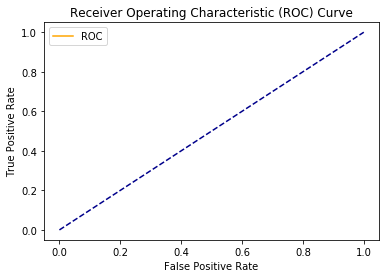

In [298]:
target_names = ['normal','dos']
print(classification_report(y_test_dos, Y_pred_dosfc, target_names=target_names, digits=1))
print("\n ------------------------------------\n")
print("ROC-AUC Score is ..:",roc_auc_score(y_test_dos, Y_pred_dosfc))
print("Log Loss Score is ..:",log_loss(y_test_dos, Y_pred_dosfc, eps=1e-15))
fpr, tpr, thresholds = metrics.roc_curve(y_test_dos, Y_pred_dosfc, pos_label=2)
plot_roc_curve(fpr,tpr)

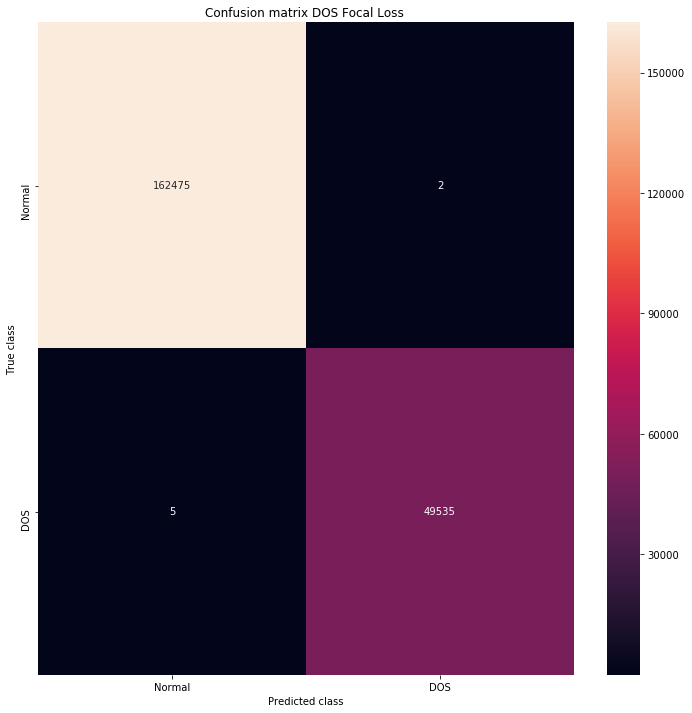

In [299]:
LABELS = ["Normal", "DOS"]
plt.figure(figsize=(12, 12))
sns.heatmap(cm_dosfc, xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
plt.title("Confusion matrix DOS Focal Loss ")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

## No Duplicate & Not Binary

Let's take a look at each tree separately and then give an opinion on its differences and similarities. We will start with the tree you use by the Gini metric, then after analyzing the regression tree that uses the gain function as a metric.

### Decision Tree Analysis

The first important point to note is the root of this tree. In this case, we have that the variable used to maximize subdivision into two new groups is the flag variable, which indicates the error status identified in the connection. This variable was transformed from string to numeric to apply the models, the assigned relation was:
- {'OTH': 10,'REJ': 3,'RSTO': 5,'RSTOS0': 8,'RSTR': 1,'S0': 6,'S1': 2,'S2': 7,'S3': 4,'SF': 0,'SH': 9}


That is, by separating the new groups according to a division by flag values less than 2.5 what the algorithm is doing is trying to separate the connections that were normally established and terminated from the others. The class that was assigned was udpstorm, a class that has only two dataset appearances, so we couldn't understand why it was chosen. Our expectation was that the root classification would be 'normal', as it is the most frequent classification.


Some interesting comparisons with what we study in the field can be seen, for example, in the branch that divides the classifications of "buffer_overflow" and "mscan". While buffer overflow is an attack that exploits the fact that when the buffer is full the information goes to the stack and takes advantage of manipulating that information, mscan works similarly to a port scan to scan for machines with vulnerabilities. a possible future attack. Interestingly, the variable chosen to split the data between these two data was srv_diff_host_rate, which means the percentage of connections made to the same service and different hosts. If this percentage is less than 0.35 we classify as mscan, which may be due to the fact that mscan has this percentage by nature lower as a result of testing mscan several different services to assess potential vulnerabilities.


Another interesting aspect of the tree that we can draw parallel with the content seen in class is the division of data between the categories "surf" and "ftwrite". While smurf is a DDoS attack, FTP Write takes place by the attacker taking advantage of a wrong FTP configuration (allowing him to add and remove new files). According to the decision tree, if it is identified in an element that was being classified as a Smurf attack that it has a connection duration greater than 279 seconds it is classified as an FTP Write attack. We imagine this may be due to the fact that an attacker who does FTP Write may need more time, for example to upload a malicious file and configure it on the infected machine.

### Decision Tree with Entropy

The decision tree using entropy was in many ways similar to the tree generated when using the Gini metric. However, one difference that became clear was that by using the same tree depth, she was able to classify different attacks. For example, the types of attack "back" and "terminate" only appear in the tree created by Entropia, while the attacks "Saint" and "nmap" only appear using Gini.


We can have some interesting insight by looking at the node that splits apache2 and buffer overflow attacks in this tree. While apache2 sets up a denial-of-service attack against a web server attack buffer overflow, as already explained, it takes advantage of the manipulation of overflow data that goes into the stack. Interestingly, the variable that divided these two groups was "same_srv_rate", which measures the percentage of connections to the same service. The apache2 attack tends to have fewer connections to the same service, since buffer overflow always needs to connect to the same service to speed up overflow.

### Comparison with and without duplicated columns

Looking at the tree generated with the entropy criterion, we can see that the number of different attacks that the model can classify greatly decreases using the duplicate dataset, with 15 different types in the duplicate dataset versus 9 in the duplicate dataset. In addition, the accuracy of the model without duplicates is also higher than that of the model with duplicates. This shows that duplicate data actually skews the classifier to the records most often, and thus decreases the accuracy of the model.


Another point is to realize that in the tree with duplicates the root node is the feature protocol_type, which was mapped as follows: {'icmp': 2, 'tcp': 1, 'udp': 0} In the classifier, all TCP traffic and UDP went to one branch of the tree and ICMP went to the other branch, which makes some sense according to the use of each protocol in existing applications today.